|평가문항	|상세기준|
|-|-|
|1. Movielens 데이터셋을 session based recommendation 관점으로 전처리하는 과정이 체계적으로 진행되었다.|데이터셋의 면밀한 분석을 토대로 세션단위 정의 과정(길이분석, 시간분석)을 합리적으로 수행한 과정이 기술되었다.|
|2. RNN 기반의 예측 모델이 정상적으로 구성되어 안정적으로 훈련이 진행되었다.|적절한 epoch만큼의 학습이 진행되는 과정에서 train loss가 안정적으로 감소하고, validation 단계에서의 Recall, MRR이 개선되는 것이 확인된다.|
|3. 세션정의, 모델구조, 하이퍼파라미터 등을 변경해서 실험하여 Recall, MRR 등의 변화추이를 관찰하였다.|3가지 이상의 변화를 시도하고 그 실험결과를 체계적으로 분석하였다.|

Movielens 1M Dataset을 기반으로, Session based Recommendation 시스템을 제작해 보겠습니다.

In [1]:
# 주요 라이브러리 버전 확인
import numpy as np
import pandas
import tensorflow

print(pandas.__version__)
print(tensorflow.__version__)

1.3.3
2.6.0


In [2]:
import datetime as dt
from pathlib import Path
import os
import time
from datetime import datetime
from IPython.display import display

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
data_path = Path(os.getenv('HOME')+'/aiffel/yoochoose/data/') 
train_path = data_path / 'ratings.dat'

def load_data(data_path: Path, nrows=None):
    data = pd.read_csv(data_path, sep='::', header=None, usecols=[0, 1, 2, 3], dtype={0: np.int32, 1: np.int32, 2: np.int32}, nrows=nrows)
    data.columns = ['UserId', 'ItemId', 'Rating', 'Time']
    return data

data = load_data(train_path, None)
data.sort_values(['UserId', 'Time'], inplace=True)  # data를 id와 시간 순서로 정렬해줍니다.
data

,UserId,ItemId,Rating,Time
31,1,3186,4,978300019
22,1,1270,5,978300055
27,1,1721,4,978300055
37,1,1022,5,978300055
24,1,2340,3,978300103
...,...,...,...,...
1000019,6040,2917,4,997454429
999988,6040,1921,4,997454464
1000172,6040,1784,3,997454464
1000167,6040,161,3,997454486


- 여기서 이전 실습 내역과 가장 크게 다른 부분은 바로 **SessionID 대신 UserID 항목이 들어갔다**는 점입니다. 이 데이터셋은 명확한 1회 세션의 SessionID를 포함하지 않고 있습니다. 그래서 이번에는 UserID가 SessionID 역할을 해야 합니다.

- **Rating 정보가 포함되어 있습니다.** 이전 실습 내역에서는 이런 항목이 포함되어 있지 않았으므로, 무시하고 제외할 수 있습니다. 하지만, 직전에 봤던 영화가 맘에 들었는지가 비슷한 영화를 더 고르게 하는 것과 상관이 있을 수도 있습니다. 아울러, Rating이 낮은 데이터를 어떻게 처리할지도 고민해야 합니다.

- Time 항목에는 UTC time 가 포함되어, 1970년 1월 1일부터 경과된 초 단위 시간이 기재되어 있습니다.

## **Step 1. 데이터의 전처리**
위와 같이 간단히 구성해 본 데이터셋을 꼼꼼히 살펴보면서 항목별 기본 분석, session length, session time, cleaning 등의 작업을 진행합니다.
특히, 이 데이터셋에서는 Session이 아닌 UserID 단위로 데이터가 생성되어 있으므로, 이를 Session 단위로 어떻게 해석할지에 주의합니다.


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000209 entries, 31 to 1000042
Data columns (total 4 columns):
 #   Column  Non-Null Count    Dtype
---  ------  --------------    -----
 0   UserId  1000209 non-null  int32
 1   ItemId  1000209 non-null  int32
 2   Rating  1000209 non-null  int32
 3   Time    1000209 non-null  int64
dtypes: int32(3), int64(1)
memory usage: 26.7 MB


In [5]:
data.describe()

,UserId,ItemId,Rating,Time
count,1.000209e+06,1.000209e+06,1.000209e+06,1.000209e+06
mean,3.024512e+03,1.865540e+03,3.581564e+00,9.722437e+08
std,1.728413e+03,1.096041e+03,1.117102e+00,1.215256e+07
min,1.000000e+00,1.000000e+00,1.000000e+00,9.567039e+08
25%,1.506000e+03,1.030000e+03,3.000000e+00,9.653026e+08
50%,3.070000e+03,1.835000e+03,4.000000e+00,9.730180e+08
75%,4.476000e+03,2.770000e+03,4.000000e+00,9.752209e+08
max,6.040000e+03,3.952000e+03,5.000000e+00,1.046455e+09


In [6]:
data = load_data(train_path, None)
data.sort_values(['UserId', 'Time'], inplace=True)  # data를 id와 시간 순서로 정렬해줍니다.
data

,UserId,ItemId,Rating,Time
31,1,3186,4,978300019
22,1,1270,5,978300055
27,1,1721,4,978300055
37,1,1022,5,978300055
24,1,2340,3,978300103
...,...,...,...,...
1000019,6040,2917,4,997454429
999988,6040,1921,4,997454464
1000172,6040,1784,3,997454464
1000167,6040,161,3,997454486


In [7]:
data['UserId'].nunique(), data['ItemId'].nunique()

(6040, 3706)

세션(유저)의 수는 6040개, 아이템의 수는 3706개

### **Session Length**

In [8]:
session_length = data.groupby('UserId').size()
session_length

UserId
1        53
2       129
3        51
4        21
5       198
       ... 
6036    888
6037    202
6038     20
6039    123
6040    341
Length: 6040, dtype: int64

현재 데이터에서는 각 유저가 몇 개의 영화에 별점을 줬는지의 데이터로 이해할 수 있다.

In [9]:
session_length.describe()

count    6040.000000
mean      165.597517
std       192.747029
min        20.000000
25%        44.000000
50%        96.000000
75%       208.000000
max      2314.000000
dtype: float64

평균적으로 165개의 영화에 별점을 매겼으며, 가장 적게 평점을 매긴 사람은 20개 영화를, 가장 많이 평점을 매긴 사람은 2314개(!)의 영화에 평점을 매겼다.

In [10]:
session_length.quantile(0.999)

1343.181000000005

In [11]:
session_length.quantile(0.99)

906.659999999998

In [12]:
session_length.quantile(0.90)

400.0

In [13]:
session_length.quantile(0.85)

309.0

In [14]:
session_length.quantile(0.68)

162.0

사용자의 활동이 매우 광범위하게 분포되어 있다. 상위 35 가량의 사람들은 평균치를 훨씬 상회하는 영화를 본 것을 알 수 있다.  
즉, 매우 활발하게 활동하는 소수의 사용자들이 있음을 암시한다.

In [15]:
session_length.value_counts().head(10)

21    91
20    86
23    81
24    81
22    77
25    75
29    72
36    71
27    66
26    62
dtype: int64

In [16]:
long_session = session_length[session_length==2314].index[0]
data[data['UserId']==long_session].head(20)

,UserId,ItemId,Rating,Time
696969,4169,1268,5,965333392
697168,4169,2617,4,965333392
697185,4169,2628,4,965333392
697219,4169,2653,4,965333392
697275,4169,423,3,965333392
696168,4169,3801,5,965333481
696250,4169,3841,2,965333481
697903,4169,3761,3,965333481
697954,4169,3788,3,965333481
695653,4169,3794,4,965333519


In [17]:
data[data['UserId']==long_session].tail(20)

,UserId,ItemId,Rating,Time
696227,4169,618,2,1014688495
696614,4169,3537,3,1016489705
696952,4169,3946,1,1016489939
696992,4169,749,3,1016490207
697737,4169,1018,4,1016490411
697028,4169,2242,3,1016491063
697398,4169,824,4,1016491445
697590,4169,1749,4,1016491656
696075,4169,2811,4,1016492378
696870,4169,3916,4,1018211900


In [18]:
1024176337 - 965333392

58842945

681시간 1시간 15분 45초 (약 28일) 동안 약 2000편의 영화에 평점을 매겨왔다.  
초반에는 짧은 시간 동안 여러 영화에 평점을 매기는 것을 확인할 수 있는데, 이는 초반 추천 시스템을 위한 사전 작업으로 보여진다.

In [19]:
# 세션 길이 기준 하위 99.9%까지의 분포 누적합을 시각화
length_count = session_length.groupby(session_length).size()
length_percent_cumsum = length_count.cumsum() / length_count.sum()
length_percent_cumsum_999 = length_percent_cumsum[length_percent_cumsum < 0.999]

length_percent_cumsum_999

20      0.014238
21      0.029305
22      0.042053
23      0.055464
24      0.068874
          ...   
1271    0.998179
1277    0.998344
1286    0.998510
1302    0.998675
1323    0.998841
Length: 736, dtype: float64

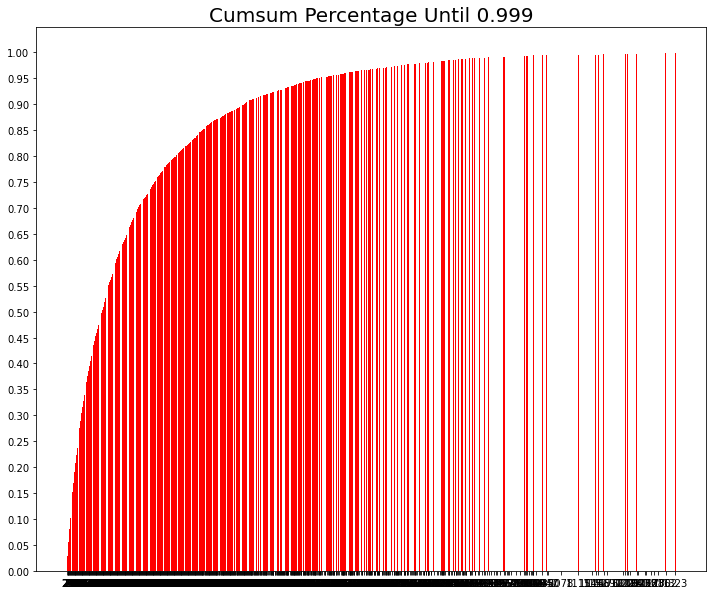

In [20]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
plt.bar(x=length_percent_cumsum_999.index,
        height=length_percent_cumsum_999, color='red')
plt.xticks(length_percent_cumsum_999.index)
plt.yticks(np.arange(0, 1.01, 0.05))
plt.title('Cumsum Percentage Until 0.999', size=20)
plt.show()

### **Session time**

In [21]:
data['Datetime'] = pd.to_datetime(data['Time'], unit='s')
data = data.drop(columns=['Time'])
data

,UserId,ItemId,Rating,Datetime
31,1,3186,4,2000-12-31 22:00:19
22,1,1270,5,2000-12-31 22:00:55
27,1,1721,4,2000-12-31 22:00:55
37,1,1022,5,2000-12-31 22:00:55
24,1,2340,3,2000-12-31 22:01:43
...,...,...,...,...
1000019,6040,2917,4,2001-08-10 14:40:29
999988,6040,1921,4,2001-08-10 14:41:04
1000172,6040,1784,3,2001-08-10 14:41:04
1000167,6040,161,3,2001-08-10 14:41:26


In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000209 entries, 31 to 1000042
Data columns (total 4 columns):
 #   Column    Non-Null Count    Dtype         
---  ------    --------------    -----         
 0   UserId    1000209 non-null  int32         
 1   ItemId    1000209 non-null  int32         
 2   Rating    1000209 non-null  int32         
 3   Datetime  1000209 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int32(3)
memory usage: 26.7 MB


In [23]:
oldest, latest = data['Datetime'].min(), data['Datetime'].max()
print(oldest) 
print(latest)

2000-04-25 23:05:32
2003-02-28 17:49:50


약 3년 10개월치의 데이터가 있다. 데이터 자체의 수가 많지는 않으므로 최근 1년치의 데이터만 사용해보자.

In [24]:
# Calculating the date 1 year before the latest date in the dataset
one_year_ago = latest - dt.timedelta(days=365)

# Filtering the dataset to only include data from the last 365 days
data = data[data['Datetime'] > one_year_ago]
data

,UserId,ItemId,Rating,Datetime
5170,36,1387,5,2002-03-12 03:46:59
5267,36,1201,4,2002-03-12 03:46:59
5122,36,1291,5,2002-03-12 03:47:16
5123,36,2167,5,2002-03-12 03:48:25
5290,36,2951,4,2002-03-12 03:48:25
...,...,...,...,...
992358,5996,3835,3,2002-04-29 20:46:24
992279,5996,2422,3,2002-04-29 20:47:05
992702,5996,168,3,2002-09-03 13:12:26
992459,5996,339,4,2002-10-07 13:24:39


최종적으로 약 2만개의 데이터가 남았다.

In [25]:
session_length = data.groupby('UserId').size()
session_length.describe()

count    498.000000
mean      43.582329
std       69.088389
min        1.000000
25%        7.000000
50%       21.000000
75%       52.000000
max      728.000000
dtype: float64

### **Cleaning**

전처리 작업을 위해 우선은 평점 기준이 3 이상인 영화만 사용자의 선호도를 반영한다고 가정하고 데이터를 덜어내보자.

In [26]:
print('평점 기준 적용 전 데이터 크기:', data.shape)
data = data[data['Rating'] >= 3]
data.head(), data.shape

평점 기준 적용 전 데이터 크기: (21704, 4)


(      UserId  ItemId  Rating            Datetime
 5170      36    1387       5 2002-03-12 03:46:59
 5267      36    1201       4 2002-03-12 03:46:59
 5122      36    1291       5 2002-03-12 03:47:16
 5123      36    2167       5 2002-03-12 03:48:25
 5290      36    2951       4 2002-03-12 03:48:25,
 (17567, 4))

약 4000개의 데이터가 사라졌다. 다시 한 번 기술통계 분석을 해보자.

In [27]:
session_length = data.groupby('UserId').size()
session_length.describe()

count    492.000000
mean      35.705285
std       55.112258
min        1.000000
25%        6.000000
50%       17.000000
75%       45.000000
max      632.000000
dtype: float64

In [28]:
length_count = session_length.groupby(session_length).size()
length_percent_cumsum = length_count.cumsum() / length_count.sum()
length_percent_cumsum_999 = length_percent_cumsum[length_percent_cumsum < 0.999]

length_percent_cumsum_999

1      0.050813
2      0.111789
3      0.158537
4      0.199187
5      0.223577
         ...   
210    0.987805
222    0.989837
262    0.993902
349    0.995935
452    0.997967
Length: 112, dtype: float64

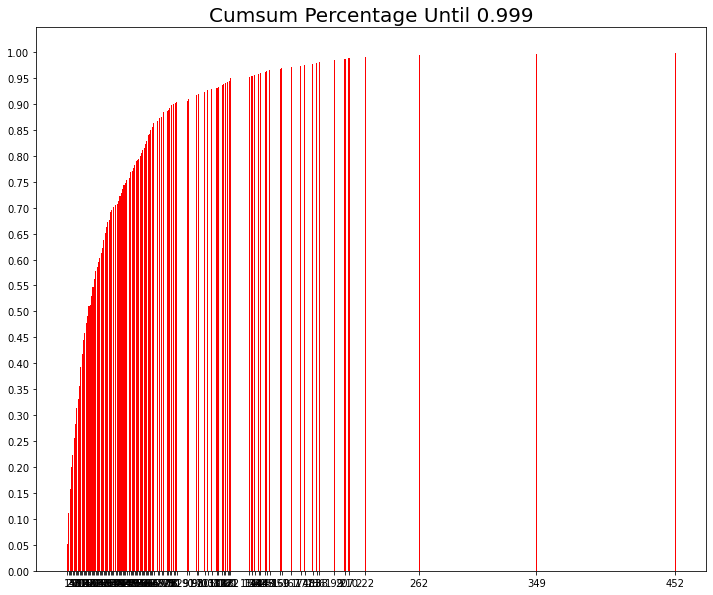

In [29]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
plt.bar(x=length_percent_cumsum_999.index,
        height=length_percent_cumsum_999, color='red')
plt.xticks(length_percent_cumsum_999.index)
plt.yticks(np.arange(0, 1.01, 0.05))
plt.title('Cumsum Percentage Until 0.999', size=20)
plt.show()

long tale 문제가 있긴 하지만, 많은 평점을 매긴 사용자들은 추천 시스템에 대해 콜드 스타트 문제를 완화하는 데 도움이 되고 신뢰도가 높으므로 굳이 이상치로 여겨 제거하지는 않음  
우리의 목적은 유저가 최소 2개 이상의 영화에 평점을 매겼을 때 추후 어떤 영화를 좋아할지 예측하는 것이므로, 단 한 편의 영화에만 평점을 매긴 경우는 제외한다. 그리고 평점 수가 너무 적은 영화는 추천될 가능성도 적으므로 배제한다.

In [30]:
def cleanse_short_session(data: pd.DataFrame, shortest):
    session_len = data.groupby('UserId').size()
    session_use = session_len[session_len >= shortest].index
    data = data[data['UserId'].isin(session_use)]
    return data

def cleanse_unpopular_item(data: pd.DataFrame, least_click):
    item_popular = data.groupby('ItemId').size()
    item_use = item_popular[item_popular >= least_click].index
    data = data[data['ItemId'].isin(item_use)]
    return data

def cleanse_recursive(data: pd.DataFrame, shortest, least_click) -> pd.DataFrame:
    while True:
        before_len = len(data)
        data = cleanse_short_session(data, shortest)
        data = cleanse_unpopular_item(data, least_click)
        after_len = len(data)
        if before_len == after_len:
            break
    return data

data = cleanse_recursive(data, shortest=2, least_click=5)
data

,UserId,ItemId,Rating,Datetime
5170,36,1387,5,2002-03-12 03:46:59
5267,36,1201,4,2002-03-12 03:46:59
5122,36,1291,5,2002-03-12 03:47:16
5123,36,2167,5,2002-03-12 03:48:25
5290,36,2951,4,2002-03-12 03:48:25
...,...,...,...,...
992553,5996,781,5,2002-04-29 20:18:44
992689,5996,2701,3,2002-04-29 20:26:16
992702,5996,168,3,2002-09-03 13:12:26
992459,5996,339,4,2002-10-07 13:24:39


최종적으로 약 만 오천개의 데이터가 남았다.

### **Train / Valid / Test split**
모델 평가를 위해 Valid Set과 Test Set을 만들기

In [31]:
# ratings에서 10개월은 train, 1개월은 val, 1개월은 test 데이터로 분리
def split_by_date(data: pd.DataFrame, n_days: int):
    final_time = data['Datetime'].max()
    session_last_time = data.groupby('UserId')['Datetime'].max()
    session_in_train = session_last_time[session_last_time < final_time - pd.Timedelta(days=n_days)].index
    session_in_test = session_last_time[session_last_time >= final_time - pd.Timedelta(days=n_days)].index

    before_date = data[data['UserId'].isin(session_in_train)]
    after_date = data[data['UserId'].isin(session_in_test)]
    return before_date, after_date

tr, test = split_by_date(data, n_days=30)
tr, val = split_by_date(tr, n_days=30)

In [32]:
# data에 대한 정보를 살펴봅니다.
def stats_info(data: pd.DataFrame, status: str):
    print(f'* {status} Set Stats Info\n'
          f'\t Events: {len(data)}\n'
          f'\t Sessions: {data["UserId"].nunique()}\n'
          f'\t Items: {data["ItemId"].nunique()}\n'
          f'\t First Time : {data["Datetime"].min()}\n'
          f'\t Last Time : {data["Datetime"].max()}\n')

In [33]:
stats_info(tr, 'train')
stats_info(val, 'valid')
stats_info(test, 'test')

* train Set Stats Info
	 Events: 7709
	 Sessions: 283
	 Items: 1238
	 First Time : 2002-02-28 19:06:39
	 Last Time : 2002-12-30 02:26:14

* valid Set Stats Info
	 Events: 2345
	 Sessions: 81
	 Items: 993
	 First Time : 2002-02-28 23:32:05
	 Last Time : 2003-01-29 03:00:40

* test Set Stats Info
	 Events: 4416
	 Sessions: 90
	 Items: 1203
	 First Time : 2002-03-01 04:03:30
	 Last Time : 2003-02-28 17:49:08



In [34]:
print(tr['ItemId'].nunique())
print(val['ItemId'].nunique())
print(test['ItemId'].nunique())

1238
993
1203


In [35]:
total_unique_items = len(set(tr['ItemId'].unique()).union(set(val['ItemId'].unique()), set(test['ItemId'].unique())))
print(total_unique_items)

1245


In [36]:
# train set에 없는 아이템이 val, test기간에 생길 수 있으므로 train data를 기준으로 인덱싱합니다.
id2idx = {item_id : index for index, item_id in enumerate(tr['ItemId'].unique())}

def indexing(df, id2idx):
    df['item_idx'] = df['ItemId'].map(lambda x: id2idx.get(x, -1))  # id2idx에 없는 아이템은 모르는 값(-1) 처리 해줍니다.
    return df

tr = indexing(tr, id2idx)
val = indexing(val, id2idx)
test = indexing(test, id2idx)

In [37]:
# 데이터를 저장하고 data pipeline 구축하는 단계로 넘어가기

save_path = data_path / 'processed'
save_path.mkdir(parents=True, exist_ok=True)

tr.to_pickle(save_path / 'train.pkl')
val.to_pickle(save_path / 'valid.pkl')
test.to_pickle(save_path / 'test.pkl')

## **Step 2. 미니 배치의 구성**
### **SessionDataset**
데이터가 주어지면 세션이 시작되는 인덱스를 담는 값과 세션을 새로 인덱싱한 값을 갖는 클래스를 만들기

In [38]:
class SessionDataset:
    """Credit to yhs-968/pyGRU4REC."""

    def __init__(self, data):
        self.df = data
        self.click_offsets = self.get_click_offsets()
        self.session_idx = np.arange(self.df['UserId'].nunique())  # indexing to UserId

    def get_click_offsets(self):
        """
        Return the indexes of the first click of each session IDs,
        """
        offsets = np.zeros(self.df['UserId'].nunique() + 1, dtype=np.int32)
        offsets[1:] = self.df.groupby('UserId').size().cumsum()
        return offsets

**`click_offsets`** 변수는 각 세션이 시작된 인덱스를 담고 있음  
**`session_idx`** 변수는 각 세션을 인덱싱한 **`np.array`**

train데이터로 **`SessionDataset`** 객체를 만들고 인스턴스 변수들을 살펴보기

In [39]:
tr_dataset = SessionDataset(tr)
tr_dataset.df.head(10)

,UserId,ItemId,Rating,Datetime,item_idx
5170,36,1387,5,2002-03-12 03:46:59,0
5267,36,1201,4,2002-03-12 03:46:59,1
5122,36,1291,5,2002-03-12 03:47:16,2
5123,36,2167,5,2002-03-12 03:48:25,3
5290,36,2951,4,2002-03-12 03:48:25,4
5359,36,2115,5,2002-03-12 03:48:25,5
5073,36,1912,5,2002-03-12 03:48:44,6
5113,36,2662,3,2002-03-12 03:48:44,7
5366,36,2985,4,2002-03-12 03:49:01,8
5145,36,198,5,2002-03-12 03:49:48,9


In [40]:
tr_dataset.click_offsets

array([   0,   29,   35,   43,   48,   50,   71,   77,   94,  105,  149,
        212,  224,  296,  328,  348,  356,  364,  368,  371,  399,  409,
        414,  433,  481,  495,  507,  509,  554,  560,  564,  566,  670,
        676,  682,  715,  723,  730,  769,  771,  778,  780,  782,  795,
        797,  823,  826,  833,  842,  870,  973,  979, 1092, 1097, 1100,
       1104, 1478, 1495, 1526, 1539, 1541, 1564, 1567, 1573, 1578, 1586,
       1589, 1627, 1630, 1661, 1686, 1714, 1806, 1835, 1844, 1878, 1968,
       1970, 1980, 1995, 2048, 2058, 2112, 2131, 2142, 2147, 2321, 2337,
       2347, 2398, 2411, 2506, 2584, 2614, 2630, 2657, 2682, 2733, 2749,
       2753, 2770, 2775, 2787, 2806, 2808, 2818, 2824, 2833, 2881, 2884,
       2942, 2954, 2973, 2975, 2988, 2990, 3003, 3024, 3107, 3111, 3142,
       3152, 3167, 3195, 3205, 3255, 3274, 3318, 3323, 3428, 3484, 3489,
       3553, 3556, 3561, 3569, 3575, 3581, 3587, 3606, 3609, 3630, 3759,
       3761, 3815, 3878, 3882, 3947, 3962, 4081, 41

In [41]:
tr_dataset.session_idx

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

### **SessionDataLoader**
**`SessionDataset`** 객체를 받아서 Session-Parallel mini-batch를 만드는 클래스 만들기
**`__iter__`** 메서드는 모델 인풋, 라벨, 세션이 끝나는 곳의 위치를 **`yield`**함  

mask는 후에 RNN Cell State를 초기화하는데 사용할 것

In [42]:
class SessionDataLoader:
    """Credit to yhs-968/pyGRU4REC."""

    def __init__(self, dataset: SessionDataset, batch_size=50):
        self.dataset = dataset
        self.batch_size = batch_size

    def __iter__(self):
        """ Returns the iterator for producing session-parallel training mini-batches.
        Yields:
            input (B,):  Item indices that will be encoded as one-hot vectors later.
            target (B,): a Variable that stores the target item indices
            masks: Numpy array indicating the positions of the sessions to be terminated
        """
        #print("Iterator started")
        start, end, mask, last_session, finished = self.initialize()  # initialize 메소드에서 확인해주세요.
        """
        start : Index Where Session Start
        end : Index Where Session End
        mask : indicator for the sessions to be terminated
        """
        #print(f"Initialized: start={start}, end={end}, mask={mask}, last_session={last_session}, finished={finished}")

        while not finished:
            min_len = (end - start).min() - 1  # Shortest Length Among Sessions
            for i in range(min_len):
                # Build inputs & targets
                inp = self.dataset.df['item_idx'].values[start + i]
                target = self.dataset.df['item_idx'].values[start + i + 1]
                yield inp, target, mask
            print("Calling update_status")
            start, end, mask, last_session, finished = self.update_status(start, end, min_len, last_session, finished)

    def initialize(self):
#         self.batch_size = min(self.batch_size, len(self.dataset.session_idx) - 1)
        first_iters = np.arange(self.batch_size)    # 첫 배치에 사용할 세션 Index를 가져옵니다.
        last_session = self.batch_size - 1    # 마지막으로 다루고 있는 세션 Index를 저장해둡니다.
        start = self.dataset.click_offsets[self.dataset.session_idx[first_iters]]       # data 상에서 session이 시작된 위치를 가져옵니다.
        end = self.dataset.click_offsets[self.dataset.session_idx[first_iters] + 1]  # session이 끝난 위치 바로 다음 위치를 가져옵니다.
        mask = np.array([])   # session의 모든 아이템을 다 돌은 경우 mask에 추가해줄 것입니다.
        finished = False         # data를 전부 돌았는지 기록하기 위한 변수입니다.
        return start, end, mask, last_session, finished

    def update_status(self, start: np.ndarray, end: np.ndarray, min_len: int, last_session: int, finished: bool):  
        # 다음 배치 데이터를 생성하기 위해 상태를 update합니다.
        # print(f'Before update: start={start}, end={end}, last_session={last_session}, finished={finished}')        
        start += min_len   # __iter__에서 min_len 만큼 for문을 돌았으므로 start를 min_len 만큼 더해줍니다.
        mask = np.arange(self.batch_size)[(end - start) == 1]  
        # end는 다음 세션이 시작되는 위치인데 start와 한 칸 차이난다는 것은 session이 끝났다는 뜻입니다. mask에 기록해줍니다.

        for i, idx in enumerate(mask, start=1):  # mask에 추가된 세션 개수만큼 새로운 세션을 돌것입니다.
            new_session = last_session + i  
            if new_session > self.dataset.session_idx[-1]:  # 만약 새로운 세션이 마지막 세션 index보다 크다면 모든 학습데이터를 돈 것입니다.
                finished = True
                break
            # update the next starting/ending point
            start[idx] = self.dataset.click_offsets[self.dataset.session_idx[new_session]]     # 종료된 세션 대신 새로운 세션의 시작점을 기록합니다.
            end[idx] = self.dataset.click_offsets[self.dataset.session_idx[new_session] + 1]

        last_session += len(mask)  # 마지막 세션의 위치를 기록해둡니다.
        print(f'After update: start={start}, end={end}, last_session={last_session}, finished={finished}, mask={mask}')
        return start, end, mask, last_session, finished

In [43]:
tr_data_loader = SessionDataLoader(tr_dataset, batch_size = 4)
tr_dataset.df.head(15)

,UserId,ItemId,Rating,Datetime,item_idx
5170,36,1387,5,2002-03-12 03:46:59,0
5267,36,1201,4,2002-03-12 03:46:59,1
5122,36,1291,5,2002-03-12 03:47:16,2
5123,36,2167,5,2002-03-12 03:48:25,3
5290,36,2951,4,2002-03-12 03:48:25,4
5359,36,2115,5,2002-03-12 03:48:25,5
5073,36,1912,5,2002-03-12 03:48:44,6
5113,36,2662,3,2002-03-12 03:48:44,7
5366,36,2985,4,2002-03-12 03:49:01,8
5145,36,198,5,2002-03-12 03:49:48,9


In [44]:
iter_ex = iter(tr_data_loader)

In [45]:
inputs, labels, mask =  next(iter_ex)
print(f'Model Input Item Idx are : {inputs}')
print(f'Label Item Idx are : {"":5} {labels}')
print(f'Previous Masked Input Idx are {mask}')

Model Input Item Idx are : [ 0 29 35 43]
Label Item Idx are :       [ 1 30 36 44]
Previous Masked Input Idx are []


In [46]:
inputs, labels, mask =  next(iter_ex)
print(f'Model Input Item Idx are : {inputs}')
print(f'Label Item Idx are : {"":5} {labels}')
print(f'Previous Masked Input Idx are {mask}')

Model Input Item Idx are : [ 1 30 36 44]
Label Item Idx are :       [ 2 31 37 45]
Previous Masked Input Idx are []


In [47]:
inputs, labels, mask =  next(iter_ex)
print(f'Model Input Item Idx are : {inputs}')
print(f'Label Item Idx are : {"":5} {labels}')
print(f'Previous Masked Input Idx are {mask}')

Model Input Item Idx are : [ 2 31 37 45]
Label Item Idx are :       [ 3 32 38 46]
Previous Masked Input Idx are []


## **Step 3. 모델 구성**
### **Evaluation Metric**

In [48]:
def mrr_k(pred, truth: int, k: int):
    indexing = np.where(pred[:k] == truth)[0]
    if len(indexing) > 0:
        return 1 / (indexing[0] + 1)
    else:
        return 0


def recall_k(pred, truth: int, k: int) -> int:
    answer = truth in pred[:k]
    return int(answer)

### **Model Architecture**

In [49]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, GRU
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tqdm import tqdm

모델에 사용할 hyper-parameter를 class형식으로 관리

In [50]:
class Args:
    def __init__(self, tr, val, test, batch_size, hsz, drop_rate, lr, epochs, k, num_items):
        self.tr = tr
        self.val = val
        self.test = test
        self.num_items = total_unique_items
        self.num_sessions = tr['UserId'].nunique()
        self.batch_size = batch_size
        self.hsz = hsz
        self.drop_rate = drop_rate
        self.lr = lr
        self.epochs = epochs
        self.k = k

args = Args(tr, val, test, batch_size=64, hsz=50, drop_rate=0.1, lr=0.001, epochs=30, k=20, num_items = total_unique_items)

In [51]:
def create_model(args):
    inputs = Input(batch_shape=(args.batch_size, 1, args.num_items))
    gru, _ = GRU(args.hsz, stateful=True, return_state=True, name='GRU')(inputs)
    dropout = Dropout(args.drop_rate)(gru)
    predictions = Dense(args.num_items, activation='softmax')(dropout)
    model = Model(inputs=inputs, outputs=[predictions])
    model.compile(loss=categorical_crossentropy, optimizer=Adam(args.lr), metrics=['accuracy'])
    model.summary()
    return model

## **Step 4. 모델 학습**

In [52]:
# train 셋으로 학습하면서 valid 셋으로 검증합니다.
def train_model(model, args):
    train_losses = []
    accuracies = []
    val_recalls = []
    val_mrrs = []
    
    model.reset_states()
    train_dataset = SessionDataset(args.tr)
    train_loader = SessionDataLoader(train_dataset, batch_size=args.batch_size)

    for epoch in range(1, args.epochs + 1):
        total_step = len(args.tr) - args.tr['UserId'].nunique()
        tr_loader = tqdm(train_loader, total=total_step // args.batch_size, desc='Train', mininterval=1)
        for feat, target, mask in tr_loader:
            reset_hidden_states(model, mask)  # 종료된 session은 hidden_state를 초기화합니다. 아래 메서드에서 확인해주세요.

            input_ohe = to_categorical(feat, num_classes=args.num_items)
            input_ohe = np.expand_dims(input_ohe, axis=1)
            target_ohe = to_categorical(target, num_classes=args.num_items)

            result = model.train_on_batch(input_ohe, target_ohe)
            tr_loader.set_postfix(train_loss=result[0], accuracy = result[1])
        
        # Save metrics
        train_losses.append(result[0])
        accuracies.append(result[1])
        
        val_recall, val_mrr = get_metrics(args.val, model, args, args.k)  # valid set에 대해 검증합니다.
        val_recalls.append(val_recall)
        val_mrrs.append(val_mrr)

        print(f"\t - Recall@{args.k} epoch {epoch}: {val_recall:3f}")
        print(f"\t - MRR@{args.k}    epoch {epoch}: {val_mrr:3f}\n")

    return train_losses, accuracies, val_recalls, val_mrrs



def reset_hidden_states(model, mask):
    gru_layer = model.get_layer(name='GRU')  # model에서 gru layer를 가져옵니다.
    hidden_states = gru_layer.states[0].numpy()  # gru_layer의 parameter를 가져옵니다.
    for elt in mask:  # mask된 인덱스 즉, 종료된 세션의 인덱스를 돌면서
        hidden_states[elt, :] = 0  # parameter를 초기화 합니다.
    gru_layer.reset_states(states=hidden_states)


def get_metrics(data, model, args, k: int):  # valid셋과 test셋을 평가하는 코드입니다. 
                                             # train과 거의 같지만 mrr, recall을 구하는 라인이 있습니다.
    dataset = SessionDataset(data)
    loader = SessionDataLoader(dataset, batch_size=args.batch_size)
    recall_list, mrr_list = [], []

    total_step = len(data) - data['UserId'].nunique()
    for inputs, label, mask in tqdm(loader, total=total_step // args.batch_size, desc='Evaluation', mininterval=1):
        reset_hidden_states(model, mask)
        input_ohe = to_categorical(inputs, num_classes=args.num_items)
        input_ohe = np.expand_dims(input_ohe, axis=1)
        print(input_ohe.shape)

        pred = model.predict(input_ohe, batch_size=args.batch_size)
        pred_arg = tf.argsort(pred, direction='DESCENDING')  # softmax 값이 큰 순서대로 sorting 합니다.

        length = len(inputs)
        recall_list.extend([recall_k(pred_arg[i], label[i], k) for i in range(length)])
        mrr_list.extend([mrr_k(pred_arg[i], label[i], k) for i in range(length)])

    recall, mrr = np.mean(recall_list), np.mean(mrr_list)
    return recall, mrr

def plot_metrics(train_losses, accuracies, val_recalls, val_mrrs):
    epochs = range(1, len(train_losses) + 1)
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(epochs, accuracies, label='Accuracy')
    plt.title('Training Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(epochs, val_recalls, label='Recall@20')
    plt.title('Validation Recall@20')
    plt.xlabel('Epoch')
    plt.ylabel('Recall@20')
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(epochs, val_mrrs, label='MRR@20')
    plt.title('Validation MRR@20')
    plt.xlabel('Epoch')
    plt.ylabel('MRR@20')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [53]:
# 이제 모델을 다시 생성합니다.
model = create_model(args)

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(64, 1, 1245)]           0         
_________________________________________________________________
GRU (GRU)                    [(64, 50), (64, 50)]      194550    
_________________________________________________________________
dropout (Dropout)            (64, 50)                  0         
_________________________________________________________________
dense (Dense)                (64, 1245)                63495     
Total params: 258,045
Trainable params: 258,045
Non-trainable params: 0
_________________________________________________________________


In [54]:
# Call training
train_losses, accuracies, val_recalls, val_mrrs = train_model(model, args)

Train:   1%|          | 1/116 [00:03<05:28,  2.86s/it, accuracy=0, train_loss=7.12]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   1%|          | 1/116 [00:03<05:28,  2.86s/it, accuracy=0, train_loss=7.12]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]
Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 

Train:   1%|          | 1/116 [00:03<05:28,  2.86s/it, accuracy=0, train_loss=7.1]      

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:  70%|██████▉   | 81/116 [00:03<00:01, 22.19it/s, accuracy=0, train_loss=7.09]   


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:   9%|▊         | 3/35 [00:01<00:12,  2.59it/s]

Calling update_status
After update: start=[   3  100  149  199  207  247  252  260 1734  272  308  316  341  429
  441  466  499  508  521 1627  565  612  655  667  689  740  767  852
  858  895  939  992 1003 1018 1041 1065 1694 1076 1102 1113 1165 1706
 1189 1195 1214 1225 1230 1712 1287 1303 1974 1318 1333 1620 1380 1398
 1403 1413 1429 1440 1559 1571 1592 1604], end=[  97  146  196  204  244  249  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 1227 1281 1734 1300 1311 2000 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=70, finished=False, mask=[ 8 50]
(64, 1, 1245)
Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 

Evaluation:  20%|██        | 7/35 [00:02<00:09,  2.91it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 1: 0.046875
	 - MRR@20    epoch 1: 0.006204



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.95]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.97]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.98]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.97]     

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.95]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.33it/s, accuracy=0, train_loss=6.94]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.33it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.31it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 2: 0.060268
	 - MRR@20    epoch 2: 0.011731



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.72]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.82]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.92]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.9]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.89]     

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.85]

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 105.23it/s, accuracy=0, train_loss=6.91]


Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 5998
 3077 4475 4151 6605 6111 3536 6807  936 2567 1045 4901 5151 3924 1170
 4202 6744 6919 1779 5714 1942 6590 2209], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 6042 2942 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=246, finished=False, mask=[17 26]
Calling update_status
After update: start=[4677 4258 6386 6327 5270 3858 5808 5405 3476 6986 6770 4004  291 6257
 3674 6403 5451 6928 5207 4844 6877 6350 3372 5752 7001 2940 6973 5514
 6054 4991 5940  633 6418 2473 4732 3805 6898 7004 6096 5550 4631 599

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.40it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.38it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 3: 0.071429
	 - MRR@20    epoch 3: 0.012082



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.71]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.75]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.87]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.84]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.85]     

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.8] 

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 105.72it/s, accuracy=0, train_loss=6.89]


Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 5998
 3077 4475 4151 6605 6111 3536 6807  936 2567 1045 4901 5151 3924 1170
 4202 6744 6919 1779 5714 1942 6590 2209], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 6042 2942 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=246, finished=False, mask=[17 26]
Calling update_status
After update: start=[4677 4258 6386 6327 5270 3858 5808 5405 3476 6986 6770 4004  291 6257
 3674 6403 5451 6928 5207 4844 6877 6350 3372 5752 7001 2940 6973 5514
 6054 4991 5940  633 6418 2473 4732 3805 6898 7004 6096 5550 4631 599

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.21it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.21it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 4: 0.062500
	 - MRR@20    epoch 4: 0.011424



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.82]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.73]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.93]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]
Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.81]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.77]     

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.30it/s, accuracy=0, train_loss=6.86]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.29it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.27it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 5: 0.069196
	 - MRR@20    epoch 5: 0.011894



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.7] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.8]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.89]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.78]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.92]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.78]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.20it/s, accuracy=0, train_loss=6.83]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.36it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.37it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 6: 0.064732
	 - MRR@20    epoch 6: 0.011461



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.68]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.72]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.74]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.88]     

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.69]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 99.40it/s, accuracy=0, train_loss=6.79]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.36it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 7: 0.064732
	 - MRR@20    epoch 7: 0.011822



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.64]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.67]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.69]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.71]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.64]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 101.91it/s, accuracy=0, train_loss=6.74]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.35it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.28it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 8: 0.069196
	 - MRR@20    epoch 8: 0.013745



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.62]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.62]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.66]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.65]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.79]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.59]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.86it/s, accuracy=0, train_loss=6.7]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.36it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 9: 0.064732
	 - MRR@20    epoch 9: 0.015239



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.57]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.58]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.59]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.53]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 102.60it/s, accuracy=0.0156, train_loss=6.65]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.40it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 10: 0.064732
	 - MRR@20    epoch 10: 0.016355



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.5] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.52]    

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.53]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.52]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.64]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.47]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.11it/s, accuracy=0.0312, train_loss=6.59]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.41it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 11: 0.071429
	 - MRR@20    epoch 11: 0.020667



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.53]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.57]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.52]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.59]     

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.3] 

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.43]    

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.39]

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.34]

Calling update_status
After update: start=[4689 4270 7270 7369 5282 3870 5820 7331 7154 6998 6782 4016 7105 6269
 3686 7182 7376 6940 5219 4856 6889 7537 3384 7383 7138 7018 7575 7450
 6066 5003 5952  645 6430 2485 4744 7346 6910 7041 7057 5562 7423 7430
 3090 4488 7363 6618 6124 3549 6820  949 2580 1058 4914 5164 3937 1183
 7114 6757 7534 1792 5727 1955 7196 2222], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=278, finished=False, mask=[21 26]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 95.64it/s, accuracy=0.0469, train_loss=6.47]


Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 7431
 3091 4489 7364 6619 6125 3550 6821  950 2581 1059 4915 7597 3938 1184
 7115 6758 7535 1793 5728 1956 7197 2223], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7597 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=280, finished=False, mask=[12 53]
Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.39it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.40it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 12: 0.069196
	 - MRR@20    epoch 12: 0.024200



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.35]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.34]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.38]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.32]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.36]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 102.51it/s, accuracy=0.0469, train_loss=6.36]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 13: 0.075893
	 - MRR@20    epoch 13: 0.023348



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.41]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.26]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.41]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.22]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.23]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 102.49it/s, accuracy=0.0469, train_loss=6.25]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.31it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.26it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 14: 0.078125
	 - MRR@20    epoch 14: 0.026397



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.12]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.14]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.17]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.29]

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.22]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.1] 

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 98.96it/s, accuracy=0.0625, train_loss=6.12]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 15: 0.082589
	 - MRR@20    epoch 15: 0.026670



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=6.18]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.96]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.17]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.95] 

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.03]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.20it/s, accuracy=0.0781, train_loss=5.98]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.41it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 16: 0.089286
	 - MRR@20    epoch 16: 0.028121



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=5.9]  

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.82]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.91]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.86] 

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.85]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.43it/s, accuracy=0.0469, train_loss=5.83]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.43it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.44it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 17: 0.089286
	 - MRR@20    epoch 17: 0.027526



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=5.8]  

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.71]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.86] 

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.72] 

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.82]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.72] 

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 102.63it/s, accuracy=0.109, train_loss=5.64]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.41it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.38it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 18: 0.093750
	 - MRR@20    epoch 18: 0.028270



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.64] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.55]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.66] 

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.59] 

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=5.5]  

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  70%|██████▉   | 81/116 [00:00<00:00, 96.33it/s, accuracy=0.172, train_loss=5.51]


Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 7432
 3092 4490 7365 6620 6126 3551 6822  951 2582 1060 4916 7598 3939 1185
 7116 6759 7536 1794 5729 1957 7198 2224], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7611 6803 4081 7597 6300
 3759 7709 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=283, finished=True, mask=[ 9 15 58]


Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.46it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.45it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 19: 0.093750
	 - MRR@20    epoch 19: 0.026980



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.51] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.4]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=5.4]  

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=5.43]

Calling update_status


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=5.25] 

After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 412

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.87it/s, accuracy=0.188, train_loss=5.33]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.45it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.42it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 20: 0.095982
	 - MRR@20    epoch 20: 0.026130



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.38] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.27]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=5.34] 

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=5.29]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=5.3]  

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 102.97it/s, accuracy=0.156, train_loss=5.16]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.42it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 21: 0.089286
	 - MRR@20    epoch 21: 0.026151



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=5.22] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.12]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=5.2]  

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.23]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=5.16]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=5.08]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.37it/s, accuracy=0.219, train_loss=4.94]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.31it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 22: 0.093750
	 - MRR@20    epoch 22: 0.025872



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=5.1] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.94]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.93]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=5.01]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.68]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 104.28it/s, accuracy=0.188, train_loss=4.82]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.38it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 23: 0.084821
	 - MRR@20    epoch 23: 0.025276



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=4.94]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.8] 

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.93]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=4.8]  

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=4.81]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.42it/s, accuracy=0.234, train_loss=4.55]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.46it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 24: 0.084821
	 - MRR@20    epoch 24: 0.025459



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.75]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.64]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=4.77]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.73]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.71]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 101.78it/s, accuracy=0.266, train_loss=4.46]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.20it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.25it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 25: 0.089286
	 - MRR@20    epoch 25: 0.025838



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=4.57] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.52]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=4.48]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=4.27]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=4.22]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 96.86it/s, accuracy=0.25, train_loss=4.22]


Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 7432
 3092 4490 7365 6620 6126 3551 6822  951 2582 1060 4916 7598 3939 1185
 7116 6759 7536 1794 5729 1957 7198 2224], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7611 6803 4081 7597 6300
 3759 7709 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=283, finished=True, mask=[ 9 15 58]


Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.41it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 26: 0.087054
	 - MRR@20    epoch 26: 0.026309



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=4.43]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.38]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=4.43]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=4.29]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=4.3] 

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 102.84it/s, accuracy=0.266, train_loss=4.09]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.42it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.40it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 27: 0.082589
	 - MRR@20    epoch 27: 0.026020



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=4.17]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.35]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]
Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=4.21]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=4.16]

Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 4603 4095
 3050 4448 4124 2862 4562 3509 4397  909 2540 1018 4874 5041 3897 1143
 4175 5016 3228 1752 5045 1915 4940 2182], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=189, finished=False, mask=[16]
Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=4.2] 

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=4.22] 

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  70%|██████▉   | 81/116 [00:00<00:00, 99.55it/s, accuracy=0.328, train_loss=3.92]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.41it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 28: 0.082589
	 - MRR@20    epoch 28: 0.025817



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=4.23] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.12]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=4.14]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=3.93]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3.92]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.82it/s, accuracy=0.344, train_loss=3.71]


Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.25it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.28it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 29: 0.080357
	 - MRR@20    epoch 29: 0.026688



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=4.01]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.97]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=3.71]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=3.97]

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]
Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=3.78]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=3.85]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.52it/s, accuracy=0.359, train_loss=3.59]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]

Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 30: 0.080357
	 - MRR@20    epoch 30: 0.025348



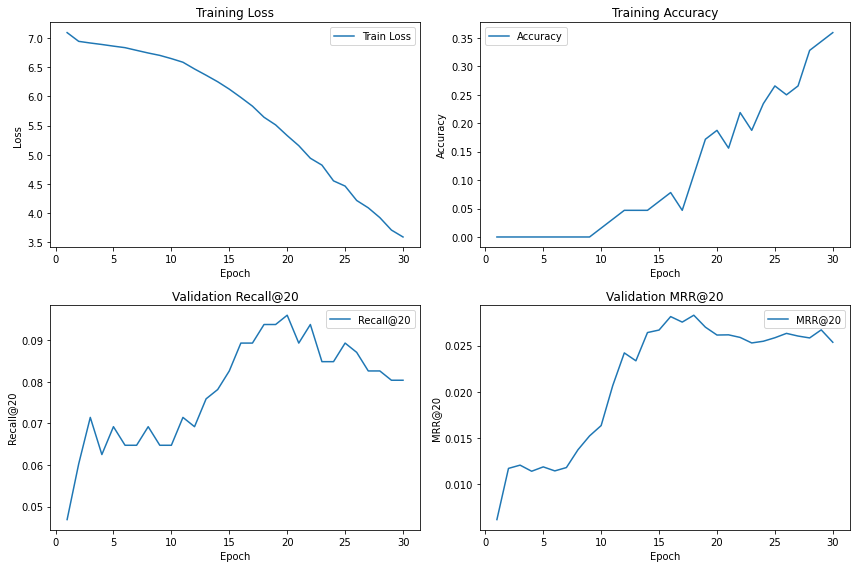

In [55]:
# Plot the metrics
plot_metrics(train_losses, accuracies, val_recalls, val_mrrs)

## **Step 5. 모델 테스트**
지금까지 작성한 모델이 테스트셋에 대해서 어느 정도 성능을 내는지 검증

In [57]:
def test_model(model, args, test):
    test_recall, test_mrr = get_metrics(test, model, args, 20)
    print(f"\t - Recall@{args.k}: {test_recall:3f}")
    print(f"\t - MRR@{args.k}: {test_mrr:3f}\n")

test_model(model, args, test)

Evaluation:   0%|          | 0/67 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   75  159  234  309  313  503  507  573  994 1004 1059 1128 1169
 1176 1235 1275 3271 1287 1550 1604 1648 1669 1682 1723 1760 1838 1864
 1879 1989 1995 2007 2048 2072 2086 2183 2309 2349 2422 2459 2503 2512
 2519 2556 2612 2640 2651 2770 2843 2854 2884 2891 2901 2913 3031 3037
 3058 3092 3104 3154 3181 3211 3236 3253], end=[  74  158  233  308  312  502  506  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3276 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 1994 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3036 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=64, finished=False, mask=[17]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[   3   77  161  236 3276  315 3318  509  575  996 1006 1061 1130 1171
 1178 1237 1277 3273 1289 1552 1606 1650 1671 1684 1725 1762 1840 1866
 1881 1991 1997 2009 2050 2074 

Evaluation:   6%|▌         | 4/67 [00:01<00:18,  3.40it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   5   79  163  238 3278  317 3320  511  577  998 1008 1063 1132 1173
 1180 1239 1279 3352 1291 1554 1608 1652 1673 1686 1727 1764 1842 1868
 1883 3367 1999 2011 2052 2076 2090 2187 2313 2353 2426 2463 2507 2516
 2523 2560 2616 2644 2655 2774 2847 2858 2888 2895 2905 2917 3508 3041
 3062 3096 3108 3158 3185 3215 3240 3257], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=69, finished=False, mask=[17 29 54]
(64, 1, 1245)
Calling update_status
After update: start=[   6   80  164  239 3279  318 3321  512  578  999 1009 1064 1133 3549
 1181 1240 1280 3353 1292 1555 1609 1653 1674 1687 1728 1765 1843 1869
 1884 3368 2000 2012 2053 2077 2091 218

Evaluation:  12%|█▏        | 8/67 [00:02<00:17,  3.37it/s]

Calling update_status
After update: start=[   8   82  166  241 3281  320 3323  514  580 1001 1011 1066 1135 3551
 1183 1242 1282 3355 1294 1557 1611 1655 1676 1689 1730 1767 1845 1871
 1886 3370 2002 2014 2055 2079 2093 2190 2316 2356 2429 2466 3672 3567
 2526 2563 2619 2647 2658 2777 2850 2861 3643 2898 2908 2920 3511 3044
 3065 3099 3111 3161 3188 3218 3243 3260], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 3565
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 2650 2769 2842 2853 2883 3672 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=73, finished=False, mask=[40]
(64, 1, 1245)
Calling update_status
After update: start=[   9   83  167  242 3282  321 3324  515  581 3685 1012 1067 1136 3552
 1184 1243 3804 3356 1295 1558 1612 1656 1677 1690 1731 1768 1846 1872
 1887 3371 2003 2015 2056 2080 2094 2191 2317 2357 2430 246

Evaluation:  18%|█▊        | 12/67 [00:03<00:16,  3.37it/s]

Calling update_status
After update: start=[  12   86  170  245 3285  324 3327  518  584 3688 1015 1070 1139 3555
 1187 1246 3807 3359 1298 1561 1615 1659 3986 1693 1734 1771 1849 1875
 1890 3374 3939 2018 2059 2083 2097 2194 2320 2360 2433 2470 3676 3571
 2530 2567 2623 3839 2662 2781 3903 2865 3647 3829 3965 2924 3515 3048
 3069 4030 3115 3165 3192 3222 3247 3264], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 1878
 1988 3508 3964 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 3252 3271], last_session=83, finished=False, mask=[22 57]
(64, 1, 1245)
Calling update_status
After update: start=[  13   87  171  246 3286  325 3328  519  585 3689 1016 1071 1140 3556
 1188 1247 3808 3360 1299 1562 1616 1660 3987 1694 1735 1772 1850 1876
 1891 3375 3940 2019 2060 4040 2098 2195 2321 2361 2434 

Evaluation:  24%|██▍       | 16/67 [00:04<00:15,  3.34it/s]

Calling update_status
After update: start=[  16   90  174  249 3289  328 3331  522  588 3692 1019 1074 1143 3559
 1191 1250 3811 3363 1302 1565 1619 1663 3990 1697 1738 1775 1853 4045
 1894 3378 3943 2022 2063 4074 2101 2198 2324 2364 2437 2474 3680 3575
 2534 2571 2627 3843 2666 2785 3907 2869 3651 3833 3969 2928 3519 3052
 3073 4034 3119 3169 3196 3226 4167 3268], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 3271], last_session=87, finished=False, mask=[62]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[  18   92  176  251 3291  330 3333  524  590 3694 1021 1076 1145 3561
 1193 1252 3813 3365 1304 1567 1621 1665 3992 1699 1740 1777 1855 4047
 1896 3380 3945 2024 2065 4076 2103 2200 2326

Evaluation:  28%|██▊       | 19/67 [00:05<00:14,  3.37it/s]

Calling update_status
After update: start=[  19   93  177  252 3292  331 3334  525  591 3695 1022 1077 1146 3562
 1194 1253 3814 4385 1305 1568 1622 1666 3993 1700 1741 1778 1856 4048
 1897 3381 3946 2025 2066 4077 2104 2201 2327 2367 2440 2477 3683 3578
 2537 2574 2630 3846 2669 2788 3910 2872 3654 3836 3972 2931 3522 3055
 3076 4037 3122 3172 3199 3229 4170 4370], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 4416 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 4385], last_session=90, finished=True, mask=[17 51]
	 - Recall@20: 0.044408
	 - MRR@20: 0.009223



학습은 잘 진행되는 것 같지만 Recall@20과 MRR@20 지표가 불안정하게 증가하고 있다...모델을 좀 더 수정해보자.  
우선 dropout 비율을 조정해볼 것이다.

## 성능 개선 trial 1 - dropout 비율 조정

In [58]:
class Args:
    def __init__(self, tr, val, test, batch_size, hsz, drop_rate, lr, epochs, k, num_items):
        self.tr = tr
        self.val = val
        self.test = test
        self.num_items = total_unique_items
        self.num_sessions = tr['UserId'].nunique()
        self.batch_size = batch_size
        self.hsz = hsz
        self.drop_rate = drop_rate
        self.lr = lr
        self.epochs = epochs
        self.k = k

args = Args(tr, val, test, batch_size=64, hsz=50, drop_rate=0.5, lr=0.001, epochs=30, k=20, num_items = total_unique_items)

def create_model(args):
    inputs = Input(batch_shape=(args.batch_size, 1, args.num_items))
    gru, _ = GRU(args.hsz, stateful=True, return_state=True, name='GRU')(inputs)
    dropout = Dropout(args.drop_rate)(gru)
    predictions = Dense(args.num_items, activation='softmax')(dropout)
    model = Model(inputs=inputs, outputs=[predictions])
    model.compile(loss=categorical_crossentropy, optimizer=Adam(args.lr), metrics=['accuracy'])
    model.summary()
    return model

# train 셋으로 학습하면서 valid 셋으로 검증합니다.
def train_model(model, args):
    train_losses = []
    accuracies = []
    val_recalls = []
    val_mrrs = []
    
    model.reset_states()
    train_dataset = SessionDataset(args.tr)
    train_loader = SessionDataLoader(train_dataset, batch_size=args.batch_size)

    for epoch in range(1, args.epochs + 1):
        total_step = len(args.tr) - args.tr['UserId'].nunique()
        tr_loader = tqdm(train_loader, total=total_step // args.batch_size, desc='Train', mininterval=1)
        for feat, target, mask in tr_loader:
            reset_hidden_states(model, mask)  # 종료된 session은 hidden_state를 초기화합니다. 아래 메서드에서 확인해주세요.

            input_ohe = to_categorical(feat, num_classes=args.num_items)
            input_ohe = np.expand_dims(input_ohe, axis=1)
            target_ohe = to_categorical(target, num_classes=args.num_items)

            result = model.train_on_batch(input_ohe, target_ohe)
            tr_loader.set_postfix(train_loss=result[0], accuracy = result[1])
        
        # Save metrics
        train_losses.append(result[0])
        accuracies.append(result[1])
        
        val_recall, val_mrr = get_metrics(args.val, model, args, args.k)  # valid set에 대해 검증합니다.
        val_recalls.append(val_recall)
        val_mrrs.append(val_mrr)

        print(f"\t - Recall@{args.k} epoch {epoch}: {val_recall:3f}")
        print(f"\t - MRR@{args.k}    epoch {epoch}: {val_mrr:3f}\n")

    return train_losses, accuracies, val_recalls, val_mrrs



def reset_hidden_states(model, mask):
    gru_layer = model.get_layer(name='GRU')  # model에서 gru layer를 가져옵니다.
    hidden_states = gru_layer.states[0].numpy()  # gru_layer의 parameter를 가져옵니다.
    for elt in mask:  # mask된 인덱스 즉, 종료된 세션의 인덱스를 돌면서
        hidden_states[elt, :] = 0  # parameter를 초기화 합니다.
    gru_layer.reset_states(states=hidden_states)


def get_metrics(data, model, args, k: int):  # valid셋과 test셋을 평가하는 코드입니다. 
                                             # train과 거의 같지만 mrr, recall을 구하는 라인이 있습니다.
    dataset = SessionDataset(data)
    loader = SessionDataLoader(dataset, batch_size=args.batch_size)
    recall_list, mrr_list = [], []

    total_step = len(data) - data['UserId'].nunique()
    for inputs, label, mask in tqdm(loader, total=total_step // args.batch_size, desc='Evaluation', mininterval=1):
        reset_hidden_states(model, mask)
        input_ohe = to_categorical(inputs, num_classes=args.num_items)
        input_ohe = np.expand_dims(input_ohe, axis=1)
        print(input_ohe.shape)

        pred = model.predict(input_ohe, batch_size=args.batch_size)
        pred_arg = tf.argsort(pred, direction='DESCENDING')  # softmax 값이 큰 순서대로 sorting 합니다.

        length = len(inputs)
        recall_list.extend([recall_k(pred_arg[i], label[i], k) for i in range(length)])
        mrr_list.extend([mrr_k(pred_arg[i], label[i], k) for i in range(length)])

    recall, mrr = np.mean(recall_list), np.mean(mrr_list)
    return recall, mrr

def plot_metrics(train_losses, accuracies, val_recalls, val_mrrs):
    epochs = range(1, len(train_losses) + 1)
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(epochs, accuracies, label='Accuracy')
    plt.title('Training Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(epochs, val_recalls, label='Recall@20')
    plt.title('Validation Recall@20')
    plt.xlabel('Epoch')
    plt.ylabel('Recall@20')
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(epochs, val_mrrs, label='MRR@20')
    plt.title('Validation MRR@20')
    plt.xlabel('Epoch')
    plt.ylabel('MRR@20')
    plt.legend()

    plt.tight_layout()
    plt.show()
    
# 이제 모델을 다시 생성합니다.
model = create_model(args)

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(64, 1, 1245)]           0         
_________________________________________________________________
GRU (GRU)                    [(64, 50), (64, 50)]      194550    
_________________________________________________________________
dropout_1 (Dropout)          (64, 50)                  0         
_________________________________________________________________
dense_1 (Dense)              (64, 1245)                63495     
Total params: 258,045
Trainable params: 258,045
Non-trainable params: 0
_________________________________________________________________


In [59]:
# Call training
train_losses, accuracies, val_recalls, val_mrrs = train_model(model, args)

Train:   1%|          | 1/116 [00:01<02:11,  1.15s/it, accuracy=0.0156, train_loss=7.12]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   1%|          | 1/116 [00:01<02:11,  1.15s/it, accuracy=0, train_loss=7.12]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   1%|          | 1/116 [00:01<02:11,  1.15s/it, accuracy=0, train_loss=7.11]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 41.94it/s, accuracy=0, train_loss=7.09]    


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:   9%|▊         | 3/35 [00:01<00:11,  2.78it/s]

Calling update_status
After update: start=[   3  100  149  199  207  247  252  260 1734  272  308  316  341  429
  441  466  499  508  521 1627  565  612  655  667  689  740  767  852
  858  895  939  992 1003 1018 1041 1065 1694 1076 1102 1113 1165 1706
 1189 1195 1214 1225 1230 1712 1287 1303 1974 1318 1333 1620 1380 1398
 1403 1413 1429 1440 1559 1571 1592 1604], end=[  97  146  196  204  244  249  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 1227 1281 1734 1300 1311 2000 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=70, finished=False, mask=[ 8 50]
(64, 1, 1245)
Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.13it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 1: 0.069196
	 - MRR@20    epoch 1: 0.017365



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.96]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=7.01]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.98]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=7.01]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.96]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.59it/s, accuracy=0, train_loss=6.97]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.42it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 2: 0.078125
	 - MRR@20    epoch 2: 0.013076



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.9]      

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.71]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=7]        

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]
Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.88]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.88]     

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:  70%|██████▉   | 81/116 [00:00<00:00, 101.74it/s, accuracy=0, train_loss=6.93]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.27it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.29it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 3: 0.064732
	 - MRR@20    epoch 3: 0.012935



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.73]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.73]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.87]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.89]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.84]     

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.81]

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.05it/s, accuracy=0, train_loss=6.91]


Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 5998
 3077 4475 4151 6605 6111 3536 6807  936 2567 1045 4901 5151 3924 1170
 4202 6744 6919 1779 5714 1942 6590 2209], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 6042 2942 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=246, finished=False, mask=[17 26]
Calling update_status
After update: start=[4677 4258 6386 6327 5270 3858 5808 5405 3476 6986 6770 4004  291 6257
 3674 6403 5451 6928 5207 4844 6877 6350 3372 5752 7001 2940 6973 5514
 6054 4991 5940  633 6418 2473 4732 3805 6898 7004 6096 5550 4631 599

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.43it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 4: 0.069196
	 - MRR@20    epoch 4: 0.013389



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.81]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.78]     

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.95]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.83]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.98]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.85]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.99it/s, accuracy=0, train_loss=6.9]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.47it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 5: 0.066964
	 - MRR@20    epoch 5: 0.013213



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.76]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.79]

Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 1677
 3028 1702  814 2840 2668 2784  859  887 2518  996 2796 1859 2980 1121
 3196 1512 3206 1730 1558 1893 2596 2160], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=126, finished=False, mask=[29 32]
Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.81]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.89]

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.72]

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]
Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.83]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.86]

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  70%|██████▉   | 81/116 [00:00<00:00, 97.42it/s, accuracy=0, train_loss=6.88]

Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 7432
 3092 4490 7365 6620 6126 3551 6822  951 2582 1060 4916 7598 3939 1185
 7116 6759 7536 1794 5729 1957 7198 2224], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7611 6803 4081 7597 6300
 3759 7709 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=283, finished=True, mask=[ 9 15 58]



Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.39it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.29it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 6: 0.066964
	 - MRR@20    epoch 6: 0.012710



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.82]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.69]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.81]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]
Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.78]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.76]     

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.87it/s, accuracy=0, train_loss=6.84]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.38it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 7: 0.066964
	 - MRR@20    epoch 7: 0.012110



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.65]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.66]     

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.86]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.74]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.87]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.74]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 101.32it/s, accuracy=0, train_loss=6.81]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.33it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 8: 0.069196
	 - MRR@20    epoch 8: 0.012642



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.67]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.68]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.74]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.74]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.74]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.53it/s, accuracy=0, train_loss=6.79]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.46it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.43it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 9: 0.073661
	 - MRR@20    epoch 9: 0.012598



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.61]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.64]     

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.72]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.67]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.65]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.72it/s, accuracy=0, train_loss=6.77]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.30it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 10: 0.075893
	 - MRR@20    epoch 10: 0.012524



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.59]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.59]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.68]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.62]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.6]      

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 101.39it/s, accuracy=0, train_loss=6.75]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.46it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.44it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 11: 0.071429
	 - MRR@20    epoch 11: 0.012220



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.57]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.62]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.72]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.82]     

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.65]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.79]     

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.16it/s, accuracy=0.0156, train_loss=6.69]


Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.48it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 12: 0.075893
	 - MRR@20    epoch 12: 0.011882



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.55]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.56]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.63]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.63]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.65]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.74]     

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.61]     

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.66]

Calling update_status
After update: start=[4689 4270 7270 7369 5282 3870 5820 7331 7154 6998 6782 4016 7105 6269
 3686 7182 7376 6940 5219 4856 6889 7537 3384 7383 7138 7018 7575 7450
 6066 5003 5952  645 6430 2485 4744 7346 6910 7041 7057 5562 7423 7430
 3090 4488 7363 6618 6124 3549 6820  949 2580 1058 4914 5164 3937 1183
 7114 6757 7534 1792 5727 1955 7196 2222], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=278, finished=False, mask=[21 26]
Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 743

Train:  70%|██████▉   | 81/116 [00:00<00:00, 96.49it/s, accuracy=0.0156, train_loss=6.66]


Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 7432
 3092 4490 7365 6620 6126 3551 6822  951 2582 1060 4916 7598 3939 1185
 7116 6759 7536 1794 5729 1957 7198 2224], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7611 6803 4081 7597 6300
 3759 7709 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=283, finished=True, mask=[ 9 15 58]


Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.42it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 13: 0.075893
	 - MRR@20    epoch 13: 0.012802



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.64]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.51]     

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.57]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.57]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.5]      

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.54]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.09it/s, accuracy=0.0156, train_loss=6.65]


Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 5998
 3077 4475 4151 6605 6111 3536 6807  936 2567 1045 4901 5151 3924 1170
 4202 6744 6919 1779 5714 1942 6590 2209], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 6042 2942 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=246, finished=False, mask=[17 26]
Calling update_status
After update: start=[4677 4258 6386 6327 5270 3858 5808 5405 3476 6986 6770 4004  291 6257
 3674 6403 5451 6928 5207 4844 6877 6350 3372 5752 7001 2940 6973 5514
 6054 4991 5940  633 6418 2473 4732 3805 6898 7004 6096 5550 4631 599

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.43it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 14: 0.073661
	 - MRR@20    epoch 14: 0.013012



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.48]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.49]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.51]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.53]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.49]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.7]      

Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 5998
 3077 4475 4151 6605 6111 3536 6807  936 2567 1045 4901 5151 3924 1170
 4202 6744 6919 1779 5714 1942 6590 2209], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 6042 2942 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=246, finished=False, mask=[17 26]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 106.40it/s, accuracy=0, train_loss=6.63]


Calling update_status
After update: start=[4677 4258 6386 6327 5270 3858 5808 5405 3476 6986 6770 4004  291 6257
 3674 6403 5451 6928 5207 4844 6877 6350 3372 5752 7001 2940 6973 5514
 6054 4991 5940  633 6418 2473 4732 3805 6898 7004 6096 5550 4631 5999
 3078 4476 4152 6606 6112 3537 6808  937 2568 1046 4902 5152 3925 1171
 4203 6745 6920 1780 5715 1943 6591 2210], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7004 2942 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7007 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=249, finished=False, mask=[ 9 24 37]
Calling update_status
After update: start=[4678 4259 6387 6328 5271 3859 5809 5406 3477 6987 6771 4005  292 6258
 3675 6404 5452 6929 5208 4845 6878 6351 3373 5753 7002 7007 6974 5515
 6055 4992 5941  634 6419 2474 4733 3806 6899 7005 6097 5551 4632 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.44it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.43it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 15: 0.075893
	 - MRR@20    epoch 15: 0.013518



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.44]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.47]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.57]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.63]

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.53]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.65]     

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.07it/s, accuracy=0.0156, train_loss=6.54]


Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.12it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.23it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 16: 0.073661
	 - MRR@20    epoch 16: 0.013572



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.44]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.56]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.46]     

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.49]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.46]     

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.58]     

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.76it/s, accuracy=0.0312, train_loss=6.5]


Calling update_status
After update: start=[4677 4258 6386 6327 5270 3858 5808 5405 3476 6986 6770 4004  291 6257
 3674 6403 5451 6928 5207 4844 6877 6350 3372 5752 7001 2940 6973 5514
 6054 4991 5940  633 6418 2473 4732 3805 6898 7004 6096 5550 4631 5999
 3078 4476 4152 6606 6112 3537 6808  937 2568 1046 4902 5152 3925 1171
 4203 6745 6920 1780 5715 1943 6591 2210], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7004 2942 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7007 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=249, finished=False, mask=[ 9 24 37]
Calling update_status
After update: start=[4678 4259 6387 6328 5271 3859 5809 5406 3477 6987 6771 4005  292 6258
 3675 6404 5452 6929 5208 4845 6878 6351 3373 5753 7002 7007 6974 5515
 6055 4992 5941  634 6419 2474 4733 3806 6899 7005 6097 5551 4632 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.32it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 17: 0.078125
	 - MRR@20    epoch 17: 0.018263



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.52]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.33]     

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.55]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]
Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.39]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.36]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.4]      

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  70%|██████▉   | 81/116 [00:00<00:00, 99.60it/s, accuracy=0.0469, train_loss=6.41]

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 


Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.44it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 18: 0.075893
	 - MRR@20    epoch 18: 0.018863



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.48]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.31]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.51]     

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]
Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.35]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.33]     

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:  70%|██████▉   | 81/116 [00:00<00:00, 102.68it/s, accuracy=0.0156, train_loss=6.37]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.50it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.44it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 19: 0.075893
	 - MRR@20    epoch 19: 0.018963



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.23]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.23]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.29]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.3] 

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.25]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.18it/s, accuracy=0.0312, train_loss=6.34]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.40it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.32it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 20: 0.075893
	 - MRR@20    epoch 20: 0.021012



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.21]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.12]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.24]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.28]     

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.22]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 102.45it/s, accuracy=0.0625, train_loss=6.24]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.42it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.37it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 21: 0.084821
	 - MRR@20    epoch 21: 0.021210



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.15]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.12]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.21]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.15]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.15]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 102.17it/s, accuracy=0.0625, train_loss=6.16]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.53it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.49it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 22: 0.087054
	 - MRR@20    epoch 22: 0.021796



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.12]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.16]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.17]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.14]

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]
Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.1] 

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6]   

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  70%|██████▉   | 81/116 [00:00<00:00, 100.37it/s, accuracy=0.0781, train_loss=6.07]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.44it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.37it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 23: 0.089286
	 - MRR@20    epoch 23: 0.022227



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.1] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6]  

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.02]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6]   

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=6.04]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 98.51it/s, accuracy=0.0312, train_loss=6]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.35it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.38it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 24: 0.089286
	 - MRR@20    epoch 24: 0.020957



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.05]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.82]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.12]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.91]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.85] 

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.93]

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  70%|██████▉   | 81/116 [00:00<00:00, 101.12it/s, accuracy=0.125, train_loss=5.81]

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 


Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.44it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.45it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 25: 0.084821
	 - MRR@20    epoch 25: 0.020205



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.92]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.8] 

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.06]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.9]  

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.88]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 103.67it/s, accuracy=0.141, train_loss=5.84]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.47it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.43it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 26: 0.080357
	 - MRR@20    epoch 26: 0.020822



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.72] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.79]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.82]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.72]

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.76]

Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 4603 4095
 3050 4448 4124 2862 4562 3509 4397  909 2540 1018 4874 5041 3897 1143
 4175 5016 3228 1752 5045 1915 4940 2182], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=189, finished=False, mask=[16]
Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.64] 

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.86] 

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.65] 

Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561 7422 7429
 3089 4487 7362 6617 6123 3548 6819  948 2579 1057 4913 5163 3936 1182
 7113 6756 7533 1791 5726 1954 7195 2221], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=276, finished=False, mask=[27 58]
Calling update_status
After update: start=[4689 4270 7270 7369 5282 3870 5820 7331 7154 6998 6782 4016 7105 6269
 3686 7182 7376 6940 5219 4856 6889 7537 3384 7383 7138 7018 7575 7450
 6066 5003 5952  645 6430 2485 4744 7346 6910 7041 7057 5562 7423 743

Train:  70%|██████▉   | 81/116 [00:00<00:00, 95.64it/s, accuracy=0.109, train_loss=5.65]


Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 7432
 3092 4490 7365 6620 6126 3551 6822  951 2582 1060 4916 7598 3939 1185
 7116 6759 7536 1794 5729 1957 7198 2224], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7611 6803 4081 7597 6300
 3759 7709 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=283, finished=True, mask=[ 9 15 58]


Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.30it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 27: 0.080357
	 - MRR@20    epoch 27: 0.021069



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.71] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.54] 

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.71]

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]
Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.74] 

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]
Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.64] 

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.6] 

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 101.43it/s, accuracy=0.172, train_loss=5.57]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.45it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.40it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 28: 0.084821
	 - MRR@20    epoch 28: 0.021439



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.63]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.41] 

Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681
 3032 1706  818 2844 2672 3491  863  891 2522 1000 2800 1863 2984 1125
 3200 1516 3210 1734 1562 1897 2600 2164], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=134, finished=False, mask=[36]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=5.66]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.46]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.51] 

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.54]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 101.17it/s, accuracy=0.156, train_loss=5.52]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.40it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 29: 0.084821
	 - MRR@20    epoch 29: 0.021420



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.53] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.3]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.54]

Calling update_status
After update: start=[  22 3569 2697 2076 2952 3558 3119 3173 3431  127  171 2999  246  318
 3487 3575 3159 3581 1826  393 3587 3150 3327  455 3012 2895 2964  531
 2364 3260 1610  588 3279 2428  704 2768 3562  752 2014 2646 1651 1682
 3033 1707  819 2845 2673 3492  864  892 2523 1001 2801 1864 2985 1126
 3201 1517 3211 1735 3606 1898 2601 2165], end=[  29 3575 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 3581 3167 3587 1835  399 3606 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 3569  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 3609 1968 2614 2321], last_session=139, finished=False, mask=[ 1 15 17 20 60]
Calling update_status
After update: start=[  23 3570 2698 2077 3609 3559 3120 3174 3432  128  172 3000  247  319
 3630 3576 3160 3582 1827  394 3588 3759 3328  456 3013 2896 2965  532
 2365 3261 1611  589 3280 2429  705 3761 3563  753 2015 2647

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.54]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.44]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 101.57it/s, accuracy=0.125, train_loss=5.43]


Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.45it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.42it/s]

Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 30: 0.082589
	 - MRR@20    epoch 30: 0.021774



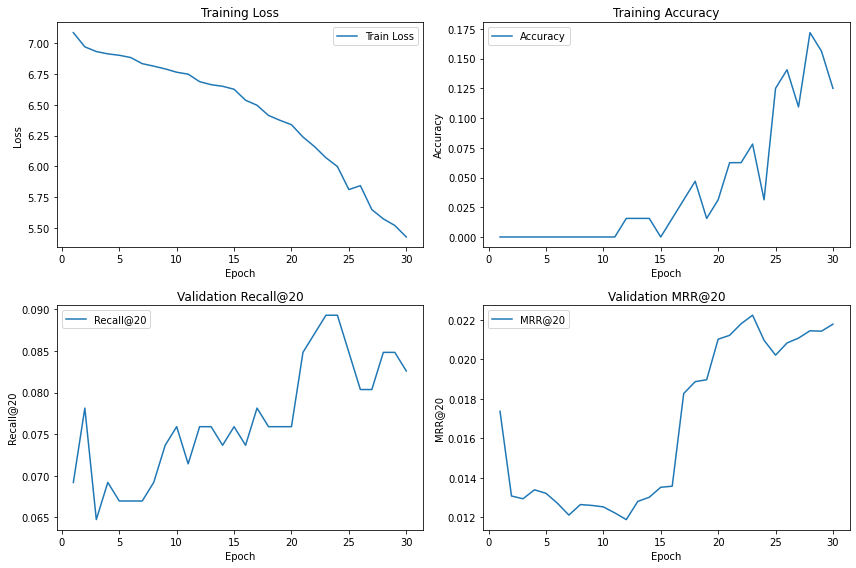

In [60]:
# Plot the metrics
plot_metrics(train_losses, accuracies, val_recalls, val_mrrs)

In [61]:
def test_model(model, args, test):
    test_recall, test_mrr = get_metrics(test, model, args, 20)
    print(f"\t - Recall@{args.k}: {test_recall:3f}")
    print(f"\t - MRR@{args.k}: {test_mrr:3f}\n")

test_model(model, args, test)

Evaluation:   0%|          | 0/67 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   75  159  234  309  313  503  507  573  994 1004 1059 1128 1169
 1176 1235 1275 3271 1287 1550 1604 1648 1669 1682 1723 1760 1838 1864
 1879 1989 1995 2007 2048 2072 2086 2183 2309 2349 2422 2459 2503 2512
 2519 2556 2612 2640 2651 2770 2843 2854 2884 2891 2901 2913 3031 3037
 3058 3092 3104 3154 3181 3211 3236 3253], end=[  74  158  233  308  312  502  506  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3276 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 1994 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3036 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=64, finished=False, mask=[17]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[   3   77  161  236 3276  315 3318  509  575  996 1006 1061 1130 1171
 1178 1237 1277 3273 1289 1552 1606 1650 1671 1684 1725 1762 1840 1866
 1881 1991 1997 2009 2050 2074 

Evaluation:   6%|▌         | 4/67 [00:01<00:19,  3.24it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   5   79  163  238 3278  317 3320  511  577  998 1008 1063 1132 1173
 1180 1239 1279 3352 1291 1554 1608 1652 1673 1686 1727 1764 1842 1868
 1883 3367 1999 2011 2052 2076 2090 2187 2313 2353 2426 2463 2507 2516
 2523 2560 2616 2644 2655 2774 2847 2858 2888 2895 2905 2917 3508 3041
 3062 3096 3108 3158 3185 3215 3240 3257], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=69, finished=False, mask=[17 29 54]
(64, 1, 1245)
Calling update_status
After update: start=[   6   80  164  239 3279  318 3321  512  578  999 1009 1064 1133 3549
 1181 1240 1280 3353 1292 1555 1609 1653 1674 1687 1728 1765 1843 1869
 1884 3368 2000 2012 2053 2077 2091 218

Evaluation:  12%|█▏        | 8/67 [00:02<00:17,  3.34it/s]

Calling update_status
After update: start=[   8   82  166  241 3281  320 3323  514  580 1001 1011 1066 1135 3551
 1183 1242 1282 3355 1294 1557 1611 1655 1676 1689 1730 1767 1845 1871
 1886 3370 2002 2014 2055 2079 2093 2190 2316 2356 2429 2466 3672 3567
 2526 2563 2619 2647 2658 2777 2850 2861 3643 2898 2908 2920 3511 3044
 3065 3099 3111 3161 3188 3218 3243 3260], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 3565
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 2650 2769 2842 2853 2883 3672 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=73, finished=False, mask=[40]
(64, 1, 1245)
Calling update_status
After update: start=[   9   83  167  242 3282  321 3324  515  581 3685 1012 1067 1136 3552
 1184 1243 3804 3356 1295 1558 1612 1656 1677 1690 1731 1768 1846 1872
 1887 3371 2003 2015 2056 2080 2094 2191 2317 2357 2430 246

Evaluation:  18%|█▊        | 12/67 [00:03<00:16,  3.30it/s]

Calling update_status
After update: start=[  12   86  170  245 3285  324 3327  518  584 3688 1015 1070 1139 3555
 1187 1246 3807 3359 1298 1561 1615 1659 3986 1693 1734 1771 1849 1875
 1890 3374 3939 2018 2059 2083 2097 2194 2320 2360 2433 2470 3676 3571
 2530 2567 2623 3839 2662 2781 3903 2865 3647 3829 3965 2924 3515 3048
 3069 4030 3115 3165 3192 3222 3247 3264], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 1878
 1988 3508 3964 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 3252 3271], last_session=83, finished=False, mask=[22 57]
(64, 1, 1245)
Calling update_status
After update: start=[  13   87  171  246 3286  325 3328  519  585 3689 1016 1071 1140 3556
 1188 1247 3808 3360 1299 1562 1616 1660 3987 1694 1735 1772 1850 1876
 1891 3375 3940 2019 2060 4040 2098 2195 2321 2361 2434 

Evaluation:  24%|██▍       | 16/67 [00:04<00:15,  3.33it/s]

Calling update_status
After update: start=[  16   90  174  249 3289  328 3331  522  588 3692 1019 1074 1143 3559
 1191 1250 3811 3363 1302 1565 1619 1663 3990 1697 1738 1775 1853 4045
 1894 3378 3943 2022 2063 4074 2101 2198 2324 2364 2437 2474 3680 3575
 2534 2571 2627 3843 2666 2785 3907 2869 3651 3833 3969 2928 3519 3052
 3073 4034 3119 3169 3196 3226 4167 3268], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 3271], last_session=87, finished=False, mask=[62]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[  18   92  176  251 3291  330 3333  524  590 3694 1021 1076 1145 3561
 1193 1252 3813 3365 1304 1567 1621 1665 3992 1699 1740 1777 1855 4047
 1896 3380 3945 2024 2065 4076 2103 2200 2326

Evaluation:  28%|██▊       | 19/67 [00:05<00:14,  3.33it/s]

Calling update_status
After update: start=[  19   93  177  252 3292  331 3334  525  591 3695 1022 1077 1146 3562
 1194 1253 3814 4385 1305 1568 1622 1666 3993 1700 1741 1778 1856 4048
 1897 3381 3946 2025 2066 4077 2104 2201 2327 2367 2440 2477 3683 3578
 2537 2574 2630 3846 2669 2788 3910 2872 3654 3836 3972 2931 3522 3055
 3076 4037 3122 3172 3199 3229 4170 4370], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 4416 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 4385], last_session=90, finished=True, mask=[17 51]
	 - Recall@20: 0.048520
	 - MRR@20: 0.010951



Recall@20과 MRR@20값이 미세하게 증가했으나 불안정하게 향상하고 있다.

## 성능 개선 trial 2 - 모델 변경 (layer수 증가)

모델 층 수를 더 쌓아보자.

In [68]:
class Args:
    def __init__(self, tr, val, test, batch_size, hsz, drop_rate, lr, epochs, k, num_items):
        self.tr = tr
        self.val = val
        self.test = test
        self.num_items = total_unique_items
        self.num_sessions = tr['UserId'].nunique()
        self.batch_size = batch_size
        self.hsz = hsz
        self.drop_rate = drop_rate
        self.lr = lr
        self.epochs = epochs
        self.k = k

args = Args(tr, val, test, batch_size=64, hsz=50, drop_rate=0.2, lr=0.001, epochs=30, k=20, num_items = total_unique_items)

def create_model(args):
    inputs = Input(batch_shape=(args.batch_size, 1, args.num_items))
    
    # 첫 번째 GRU 레이어
    gru1, _ = GRU(args.hsz, stateful=True, return_sequences=True, return_state=True, name='GRU1')(inputs)
    dropout1 = Dropout(args.drop_rate)(gru1)
    
    # 두 번째 GRU 레이어
    gru2, _ = GRU(args.hsz, stateful=True, return_state=True, name='GRU2')(dropout1)
    dropout2 = Dropout(args.drop_rate)(gru2)
    
    predictions = Dense(args.num_items, activation='softmax')(dropout2)
    model = Model(inputs=inputs, outputs=[predictions])
    model.compile(loss=categorical_crossentropy, optimizer=Adam(args.lr), metrics=['accuracy'])
    model.summary()
    return model


# train 셋으로 학습하면서 valid 셋으로 검증합니다.
def train_model(model, args):
    train_losses = []
    accuracies = []
    val_recalls = []
    val_mrrs = []
    
    model.reset_states()
    train_dataset = SessionDataset(args.tr)
    train_loader = SessionDataLoader(train_dataset, batch_size=args.batch_size)

    for epoch in range(1, args.epochs + 1):
        total_step = len(args.tr) - args.tr['UserId'].nunique()
        tr_loader = tqdm(train_loader, total=total_step // args.batch_size, desc='Train', mininterval=1)
        for feat, target, mask in tr_loader:
            reset_hidden_states(model, mask)  # 종료된 session은 hidden_state를 초기화합니다. 아래 메서드에서 확인해주세요.

            input_ohe = to_categorical(feat, num_classes=args.num_items)
            input_ohe = np.expand_dims(input_ohe, axis=1)
            target_ohe = to_categorical(target, num_classes=args.num_items)

            result = model.train_on_batch(input_ohe, target_ohe)
            tr_loader.set_postfix(train_loss=result[0], accuracy = result[1])
        
        # Save metrics
        train_losses.append(result[0])
        accuracies.append(result[1])
        
        val_recall, val_mrr = get_metrics(args.val, model, args, args.k)  # valid set에 대해 검증합니다.
        val_recalls.append(val_recall)
        val_mrrs.append(val_mrr)

        print(f"\t - Recall@{args.k} epoch {epoch}: {val_recall:3f}")
        print(f"\t - MRR@{args.k}    epoch {epoch}: {val_mrr:3f}\n")

    return train_losses, accuracies, val_recalls, val_mrrs



def reset_hidden_states(model, mask):
    # 첫 번째 GRU 레이어의 상태 초기화
    gru_layer1 = model.get_layer(name='GRU1')
    hidden_states1 = gru_layer1.states[0].numpy()
    for elt in mask:
        hidden_states1[elt, :] = 0
    gru_layer1.reset_states(states=hidden_states1)
    
    # 두 번째 GRU 레이어의 상태 초기화
    gru_layer2 = model.get_layer(name='GRU2')
    hidden_states2 = gru_layer2.states[0].numpy()
    for elt in mask:
        hidden_states2[elt, :] = 0
    gru_layer2.reset_states(states=hidden_states2)


def get_metrics(data, model, args, k: int):  # valid셋과 test셋을 평가하는 코드입니다. 
                                             # train과 거의 같지만 mrr, recall을 구하는 라인이 있습니다.
    dataset = SessionDataset(data)
    loader = SessionDataLoader(dataset, batch_size=args.batch_size)
    recall_list, mrr_list = [], []

    total_step = len(data) - data['UserId'].nunique()
    for inputs, label, mask in tqdm(loader, total=total_step // args.batch_size, desc='Evaluation', mininterval=1):
        reset_hidden_states(model, mask)
        input_ohe = to_categorical(inputs, num_classes=args.num_items)
        input_ohe = np.expand_dims(input_ohe, axis=1)
        print(input_ohe.shape)

        pred = model.predict(input_ohe, batch_size=args.batch_size)
        pred_arg = tf.argsort(pred, direction='DESCENDING')  # softmax 값이 큰 순서대로 sorting 합니다.

        length = len(inputs)
        recall_list.extend([recall_k(pred_arg[i], label[i], k) for i in range(length)])
        mrr_list.extend([mrr_k(pred_arg[i], label[i], k) for i in range(length)])

    recall, mrr = np.mean(recall_list), np.mean(mrr_list)
    return recall, mrr

def plot_metrics(train_losses, accuracies, val_recalls, val_mrrs):
    epochs = range(1, len(train_losses) + 1)
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(epochs, accuracies, label='Accuracy')
    plt.title('Training Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(epochs, val_recalls, label='Recall@20')
    plt.title('Validation Recall@20')
    plt.xlabel('Epoch')
    plt.ylabel('Recall@20')
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(epochs, val_mrrs, label='MRR@20')
    plt.title('Validation MRR@20')
    plt.xlabel('Epoch')
    plt.ylabel('MRR@20')
    plt.legend()

    plt.tight_layout()
    plt.show()
    
# 이제 모델을 다시 생성합니다.
model = create_model(args)

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(64, 1, 1245)]           0         
_________________________________________________________________
GRU1 (GRU)                   [(64, 1, 50), (64, 50)]   194550    
_________________________________________________________________
dropout_9 (Dropout)          (64, 1, 50)               0         
_________________________________________________________________
GRU2 (GRU)                   [(64, 50), (64, 50)]      15300     
_________________________________________________________________
dropout_10 (Dropout)         (64, 50)                  0         
_________________________________________________________________
dense_4 (Dense)              (64, 1245)                63495     
Total params: 273,345
Trainable params: 273,345
Non-trainable params: 0
_____________________________________________________

In [69]:
# Call training
train_losses, accuracies, val_recalls, val_mrrs = train_model(model, args)

Train:   1%|          | 1/116 [00:01<03:14,  1.69s/it, accuracy=0.0156, train_loss=7.12]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   1%|          | 1/116 [00:02<03:14,  1.69s/it, accuracy=0, train_loss=7.12]     

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]
Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 167

Train:   1%|          | 1/116 [00:02<03:14,  1.69s/it, accuracy=0, train_loss=7.11]     

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   1%|          | 1/116 [00:02<03:14,  1.69s/it, accuracy=0, train_loss=7.1]      

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:  70%|██████▉   | 81/116 [00:02<00:01, 31.14it/s, accuracy=0, train_loss=7.06]    


Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:   9%|▊         | 3/35 [00:01<00:13,  2.33it/s]

Calling update_status
After update: start=[   3  100  149  199  207  247  252  260 1734  272  308  316  341  429
  441  466  499  508  521 1627  565  612  655  667  689  740  767  852
  858  895  939  992 1003 1018 1041 1065 1694 1076 1102 1113 1165 1706
 1189 1195 1214 1225 1230 1712 1287 1303 1974 1318 1333 1620 1380 1398
 1403 1413 1429 1440 1559 1571 1592 1604], end=[  97  146  196  204  244  249  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 1227 1281 1734 1300 1311 2000 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=70, finished=False, mask=[ 8 50]
(64, 1, 1245)
Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 

Evaluation:  20%|██        | 7/35 [00:02<00:09,  2.85it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 1: 0.064732
	 - MRR@20    epoch 1: 0.012672



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=7.14]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=7.08]     

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.94]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.93]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]
Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.88]     

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.83]

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.93]     

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.86]

Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Train:  70%|██████▉   | 81/116 [00:00<00:00, 89.50it/s, accuracy=0, train_loss=6.93]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.31it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.30it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 2: 0.060268
	 - MRR@20    epoch 2: 0.008901



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=7.02]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.89]     

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.81]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.87]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.98]     

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.89]     

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.86]

Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 88.71it/s, accuracy=0, train_loss=6.94]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.36it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.31it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 3: 0.066964
	 - MRR@20    epoch 3: 0.010523



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.97]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.85]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.83]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.77]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.83]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.94]     

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.84]     

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.8] 

Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 88.86it/s, accuracy=0, train_loss=6.87]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.40it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 4: 0.060268
	 - MRR@20    epoch 4: 0.009988



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.88]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.8]      

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.85]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.81]

Calling update_status
After update: start=[4645 4226 2710 2089 3621 3826 3132 3186 3444  140  184 3972  259 4766
 3642 4588 4409 4285 4419 4812 3600 4316 3340  468 4790 2908 4432  544
 2377 4954 1623  601 3292 2441 4700 3773 4352  765 2027 4754 4599 4091
 3046 4444 4120 2858 4558 3505 4393  905 2536 1014 4870 4956 3893 1139
 4171 4578 3224 1748 3958 1911 4936 2178], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 4956 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=182, finished=False, mask=[29 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.77]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]
Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.83]

Calling update_status
After update: start=[4662 4243 2727 2106 5255 3843 5793 5390 3461 5423  201 3989  276 4783
 3659 5176 5436 5766 5192 4829 5477 4333 3357 5737 4807 2925 5089 5499
 2394 4976 5074  618 3309 2458 4717 3790 4369 5917 2044 5535 4616 4108
 3063 4461 4137 2875 5774 3522 5115  922 2553 1031 4887 5137 3910 1156
 4188 5781 3241 1765 5700 1928 5923 2195], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 4110
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 5926 2321], last_session=215, finished=False, mask=[62]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.74]     

Calling update_status
After update: start=[4663 4244 2728 2107 5256 3844 5794 5391 3462 5424  202 3990  277 4784
 3660 5177 5437 5767 5193 4830 5478 4334 3358 5738 4808 2926 5090 5500
 2395 4977 5926  619 3310 2459 4718 3791 4370 5918 2045 5536 4617 5984
 3064 4462 4138 2876 5775 3523 5116  923 2554 1032 4888 5138 3911 1157
 4189 5782 3242 1766 5701 1929 5924 2196], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 5986
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 5926 2321], last_session=217, finished=False, mask=[30 41]
Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 598

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.87]

Calling update_status
After update: start=[4680 4261 6389 6330 5273 3861 5811 5408 3479 6989 6773 4007  294 6260
 3677 6406 5454 6931 5210 4847 6880 6353 3375 5755 7027 7009 6976 5517
 6057 4994 5943  636 6421 2476 4735 3808 6901 7032 7048 5553 4634 6002
 3081 4479 4155 6609 6115 3540 6811  940 2571 1049 4905 5155 3928 1174
 4206 6748 6923 1783 5718 1946 6594 2213], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=253, finished=False, mask=[38]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 84.88it/s, accuracy=0, train_loss=6.85]


Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.30it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 5: 0.066964
	 - MRR@20    epoch 5: 0.011511



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.8]      

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.8]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]
Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.77]     

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.76]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]
Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.77]

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.81]     

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.82]     

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.79]

Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Train:  70%|██████▉   | 81/116 [00:00<00:00, 89.45it/s, accuracy=0, train_loss=6.81]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.36it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 6: 0.066964
	 - MRR@20    epoch 6: 0.011365



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.6]      

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.75]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.72]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]
Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.78]

Calling update_status
After update: start=[4643 4224 2708 2087 3619 3824 3130 3184 3442  138  182 3970  257 4764
 3640 4586 4407 4283 4417 4306 3598 4314 3338  466 4788 2906 4430  542
 2375 3271 1621  599 3290 2439 4698 3771 4350  763 2025 4752 4597 4089
 3044 4442 4118 2856 4556 3503 4391  903 2534 1012 4216 1875 3891 1137
 4169 4576 3222 1746 3956 1909 2612 2176], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 4811 2942 4439  554
 2398 3274 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=177, finished=False, mask=[13 24]
Calling update_status
After update: start=[4644 4225 2709 2088 3620 3825 3131 3185 3443  139  183 3971  258 4765
 3641 4587 4408 4284 4418 4811 3599 4315 3339  467 4789 2907 4431  543
 2376 3272 1622  600 3291 2440 4699 3772 4351  764 2026 4753 4598 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.73]

Calling update_status
After update: start=[4645 4226 2710 2089 3621 3826 3132 3186 3444  140  184 3972  259 4766
 3642 4588 4409 4285 4419 4812 3600 4316 3340  468 4790 2908 4432  544
 2377 4954 1623  601 3292 2441 4700 3773 4352  765 2027 4754 4599 4091
 3046 4444 4120 2858 4558 3505 4393  905 2536 1014 4870 4956 3893 1139
 4171 4578 3224 1748 3958 1911 4936 2178], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 4956 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=182, finished=False, mask=[29 53]
Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.68]

Calling update_status
After update: start=[4662 4243 2727 2106 5255 3843 5793 5390 3461 5423  201 3989  276 4783
 3659 5176 5436 5766 5192 4829 5477 4333 3357 5737 4807 2925 5089 5499
 2394 4976 5074  618 3309 2458 4717 3790 4369 5917 2044 5535 4616 4108
 3063 4461 4137 2875 5774 3522 5115  922 2553 1031 4887 5137 3910 1156
 4188 5781 3241 1765 5700 1928 5923 2195], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 4110
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 5926 2321], last_session=215, finished=False, mask=[62]
Calling update_status
After update: start=[4663 4244 2728 2107 5256 3844 5794 5391 3462 5424  202 3990  277 4784
 3660 5177 5437 5767 5193 4830 5478 4334 3358 5738 4808 2926 5090 5500
 2395 4977 5926  619 3310 2459 4718 3791 4370 5918 2045 5536 4617 5984
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.78]     

Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 5986
 3065 4463 4139 2877 5776 3524 5117  924 2555 1033 4889 5139 3912 1158
 4190 5783 3243 1767 5702 1930 6009 2197], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 6009
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=219, finished=False, mask=[41 62]
Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 598

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.74]     

Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Train:  70%|██████▉   | 81/116 [00:00<00:00, 85.98it/s, accuracy=0, train_loss=6.77]


Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]
Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.39it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 7: 0.060268
	 - MRR@20    epoch 7: 0.009342



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.72]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.74]     

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.63]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.66]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.7]      

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.75]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.67]     

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.75]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 89.46it/s, accuracy=0.0156, train_loss=6.74]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.33it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 8: 0.055804
	 - MRR@20    epoch 8: 0.007099



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.66]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.71]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.59]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.58]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.67]

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.67]     

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:  70%|██████▉   | 81/116 [00:00<00:00, 89.82it/s, accuracy=0.0156, train_loss=6.69]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.36it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.29it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 9: 0.053571
	 - MRR@20    epoch 9: 0.006750



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.61]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.66]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.62]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.49]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.51]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.58]     

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.6] 

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.55]    

Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 88.53it/s, accuracy=0.0312, train_loss=6.63]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.27it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.28it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 10: 0.040179
	 - MRR@20    epoch 10: 0.006456



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.55]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.62]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.43]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.47]     

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.52]     

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:  70%|██████▉   | 81/116 [00:00<00:00, 89.34it/s, accuracy=0.0312, train_loss=6.57]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 11: 0.035714
	 - MRR@20    epoch 11: 0.005457



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.42]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.53]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.37]     

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.35]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.32]

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.47]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.47]     

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.51]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 88.70it/s, accuracy=0.0156, train_loss=6.47]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.30it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.28it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 12: 0.033482
	 - MRR@20    epoch 12: 0.004194



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.37]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.42]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.38]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.26]

Calling update_status
After update: start=[4645 4226 2710 2089 3621 3826 3132 3186 3444  140  184 3972  259 4766
 3642 4588 4409 4285 4419 4812 3600 4316 3340  468 4790 2908 4432  544
 2377 4954 1623  601 3292 2441 4700 3773 4352  765 2027 4754 4599 4091
 3046 4444 4120 2858 4558 3505 4393  905 2536 1014 4870 4956 3893 1139
 4171 4578 3224 1748 3958 1911 4936 2178], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 4956 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=182, finished=False, mask=[29 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.22]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]
Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.35]     

Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 5986
 3065 4463 4139 2877 5776 3524 5117  924 2555 1033 4889 5139 3912 1158
 4190 5783 3243 1767 5702 1930 6009 2197], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 6009
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=219, finished=False, mask=[41 62]
Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 598

Train:  70%|██████▉   | 81/116 [00:00<00:00, 84.69it/s, accuracy=0.0312, train_loss=6.41]


Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.12it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.14it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 13: 0.031250
	 - MRR@20    epoch 13: 0.004083



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.35]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.35]

Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 1677
 3028 1702  814 2840 2668 2784  859  887 2518  996 2796 1859 2980 1121
 3196 1512 3206 1730 1558 1893 2596 2160], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=126, finished=False, mask=[29 32]
Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.37]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.2] 

Calling update_status
After update: start=[4645 4226 2710 2089 3621 3826 3132 3186 3444  140  184 3972  259 4766
 3642 4588 4409 4285 4419 4812 3600 4316 3340  468 4790 2908 4432  544
 2377 4954 1623  601 3292 2441 4700 3773 4352  765 2027 4754 4599 4091
 3046 4444 4120 2858 4558 3505 4393  905 2536 1014 4870 4956 3893 1139
 4171 4578 3224 1748 3958 1911 4936 2178], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 4956 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=182, finished=False, mask=[29 53]
Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.1] 

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.17]

Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 5986
 3065 4463 4139 2877 5776 3524 5117  924 2555 1033 4889 5139 3912 1158
 4190 5783 3243 1767 5702 1930 6009 2197], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 6009
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=219, finished=False, mask=[41 62]
Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 598

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.19]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.27]

Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 87.85it/s, accuracy=0.0156, train_loss=6.25]


Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.35it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 14: 0.040179
	 - MRR@20    epoch 14: 0.005119



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.15]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.24]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.2] 

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.05]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.05]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.08]     

Calling update_status
After update: start=[4663 4244 2728 2107 5256 3844 5794 5391 3462 5424  202 3990  277 4784
 3660 5177 5437 5767 5193 4830 5478 4334 3358 5738 4808 2926 5090 5500
 2395 4977 5926  619 3310 2459 4718 3791 4370 5918 2045 5536 4617 5984
 3064 4462 4138 2876 5775 3523 5116  923 2554 1032 4888 5138 3911 1157
 4189 5782 3242 1766 5701 1929 5924 2196], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 5986
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 5926 2321], last_session=217, finished=False, mask=[30 41]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.12]

Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 5986
 3065 4463 4139 2877 5776 3524 5117  924 2555 1033 4889 5139 3912 1158
 4190 5783 3243 1767 5702 1930 6009 2197], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 6009
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=219, finished=False, mask=[41 62]
Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 598

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.19]

Calling update_status
After update: start=[4680 4261 6389 6330 5273 3861 5811 5408 3479 6989 6773 4007  294 6260
 3677 6406 5454 6931 5210 4847 6880 6353 3375 5755 7027 7009 6976 5517
 6057 4994 5943  636 6421 2476 4735 3808 6901 7032 7048 5553 4634 6002
 3081 4479 4155 6609 6115 3540 6811  940 2571 1049 4905 5155 3928 1174
 4206 6748 6923 1783 5718 1946 6594 2213], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=253, finished=False, mask=[38]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 85.13it/s, accuracy=0.0312, train_loss=6.21]


Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.25it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.29it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 15: 0.037946
	 - MRR@20    epoch 15: 0.005351



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.08]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.15]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]
Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=5.98]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.99]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.05]

Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 4603 4095
 3050 4448 4124 2862 4562 3509 4397  909 2540 1018 4874 5041 3897 1143
 4175 5016 3228 1752 5045 1915 4940 2182], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=189, finished=False, mask=[16]
Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=5.96]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.16]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.11]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 90.80it/s, accuracy=0.0156, train_loss=6.1]


Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561 7422 7429
 3089 4487 7362 6617 6123 3548 6819  948 2579 1057 4913 5163 3936 1182
 7113 6756 7533 1791 5726 1954 7195 2221], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=276, finished=False, mask=[27 58]
Calling update_status
After update: start=[4689 4270 7270 7369 5282 3870 5820 7331 7154 6998 6782 4016 7105 6269
 3686 7182 7376 6940 5219 4856 6889 7537 3384 7383 7138 7018 7575 7450
 6066 5003 5952  645 6430 2485 4744 7346 6910 7041 7057 5562 7423 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.28it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.20it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 16: 0.035714
	 - MRR@20    epoch 16: 0.004547



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.93]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.03]     

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=5.88]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=5.99]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.92]

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.91]

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.86]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=5.98]

Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]
Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 

Train:  70%|██████▉   | 81/116 [00:00<00:00, 88.86it/s, accuracy=0.0156, train_loss=6.03]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.32it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.32it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 17: 0.040179
	 - MRR@20    epoch 17: 0.005441



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.83]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=5.99]     

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.83]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.79]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.84]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.84]

Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 5986
 3065 4463 4139 2877 5776 3524 5117  924 2555 1033 4889 5139 3912 1158
 4190 5783 3243 1767 5702 1930 6009 2197], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 6009
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=219, finished=False, mask=[41 62]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6]   

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.73]

Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 3083 4481 4157 6611 6117 3542 6813  942 2573 1051 4907 5157 3930 1176
 7107 6750 6925 1785 5720 1948 6596 2215], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 6927 1806 5732 1968 6600 2321], last_session=255, finished=False, mask=[56]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 87.77it/s, accuracy=0.0156, train_loss=5.9]


Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]
Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.36it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.28it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 18: 0.037946
	 - MRR@20    epoch 18: 0.005292



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.71]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.86]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.69]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.69]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.71]

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:  70%|██████▉   | 81/116 [00:00<00:00, 89.55it/s, accuracy=0.0469, train_loss=5.85]


Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.30it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.29it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 19: 0.046875
	 - MRR@20    epoch 19: 0.008414



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.65]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.69]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]
Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.68]

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.63]

Calling update_status
After update: start=[4644 4225 2709 2088 3620 3825 3131 3185 3443  139  183 3971  258 4765
 3641 4587 4408 4284 4418 4811 3599 4315 3339  467 4789 2907 4431  543
 2376 3272 1622  600 3291 2440 4699 3772 4351  764 2026 4753 4598 4090
 3045 4443 4119 2857 4557 3504 4392  904 2535 1013 4869 1876 3892 1138
 4170 4577 3223 1747 3957 1910 4935 2177], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 3274 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 1878 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=180, finished=False, mask=[19 52 62]
Calling update_status
After update: start=[4645 4226 2710 2089 3621 3826 3132 3186 3444  140  184 3972  259 4766
 3642 4588 4409 4285 4419 4812 3600 4316 3340  468 4790 2908 4432  544
 2377 4954 1623  601 3292 2441 4700 3773 4352  765 2027 4754 4599 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.51] 

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]
Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.62] 

Calling update_status
After update: start=[4660 4241 2725 2104 5253 3841 5791 5388 3459 5421  199 3987  274 4781
 3657 5174 5434 5764 5190 4827 5475 4331 3355 5735 4805 2923 5087 5497
 2392 4974 5072  616 3307 2456 4715 3788 4367 5915 2042 5533 4614 4106
 3061 4459 4135 2873 5772 3520 5113  920 2551 1029 4885 5135 3908 1154
 4186 5779 3239 1763 5698 1926 4951 2193], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 4110
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 4954 2321], last_session=214, finished=False, mask=[ 6 37]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.43]

Calling update_status
After update: start=[4662 4243 2727 2106 5255 3843 5793 5390 3461 5423  201 3989  276 4783
 3659 5176 5436 5766 5192 4829 5477 4333 3357 5737 4807 2925 5089 5499
 2394 4976 5074  618 3309 2458 4717 3790 4369 5917 2044 5535 4616 4108
 3063 4461 4137 2875 5774 3522 5115  922 2553 1031 4887 5137 3910 1156
 4188 5781 3241 1765 5700 1928 5923 2195], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 4110
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 5926 2321], last_session=215, finished=False, mask=[62]
Calling update_status
After update: start=[4663 4244 2728 2107 5256 3844 5794 5391 3462 5424  202 3990  277 4784
 3660 5177 5437 5767 5193 4830 5478 4334 3358 5738 4808 2926 5090 5500
 2395 4977 5926  619 3310 2459 4718 3791 4370 5918 2045 5536 4617 5984
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.6] 

Calling update_status
After update: start=[4678 4259 6387 6328 5271 3859 5809 5406 3477 6987 6771 4005  292 6258
 3675 6404 5452 6929 5208 4845 6878 6351 3373 5753 7002 7007 6974 5515
 6055 4992 5941  634 6419 2474 4733 3806 6899 7005 6097 5551 4632 6000
 3079 4477 4153 6607 6113 3538 6809  938 2569 1047 4903 5153 3926 1172
 4204 6746 6921 1781 5716 1944 6592 2211], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7004 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7007 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=250, finished=False, mask=[25]
Calling update_status
After update: start=[4679 4260 6388 6329 5272 3860 5810 5407 3478 6988 6772 4006  293 6259
 3676 6405 5453 6930 5209 4846 6879 6352 3374 5754 7026 7008 6975 5516
 6056 4993 5942  635 6420 2475 4734 3807 6900 7031 6098 5552 4633 6001
 

Train:  70%|██████▉   | 81/116 [00:00<00:00, 83.72it/s, accuracy=0.0469, train_loss=5.77]


Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.31it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.31it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 20: 0.042411
	 - MRR@20    epoch 20: 0.006109



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.55]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.63] 

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.56] 

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.53]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]
Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.52] 

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.69] 

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.45] 

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.64]

Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]
Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 

Train:  70%|██████▉   | 81/116 [00:00<00:00, 88.51it/s, accuracy=0.0469, train_loss=5.61]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.26it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.30it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 21: 0.053571
	 - MRR@20    epoch 21: 0.007900



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.45] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.51]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.58]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.43] 

Calling update_status
After update: start=[4645 4226 2710 2089 3621 3826 3132 3186 3444  140  184 3972  259 4766
 3642 4588 4409 4285 4419 4812 3600 4316 3340  468 4790 2908 4432  544
 2377 4954 1623  601 3292 2441 4700 3773 4352  765 2027 4754 4599 4091
 3046 4444 4120 2858 4558 3505 4393  905 2536 1014 4870 4956 3893 1139
 4171 4578 3224 1748 3958 1911 4936 2178], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 4956 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=182, finished=False, mask=[29 53]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.34]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]
Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.42] 

Calling update_status
After update: start=[4663 4244 2728 2107 5256 3844 5794 5391 3462 5424  202 3990  277 4784
 3660 5177 5437 5767 5193 4830 5478 4334 3358 5738 4808 2926 5090 5500
 2395 4977 5926  619 3310 2459 4718 3791 4370 5918 2045 5536 4617 5984
 3064 4462 4138 2876 5775 3523 5116  923 2554 1032 4888 5138 3911 1157
 4189 5782 3242 1766 5701 1929 5924 2196], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 5986
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 5926 2321], last_session=217, finished=False, mask=[30 41]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.54]

Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 5986
 3065 4463 4139 2877 5776 3524 5117  924 2555 1033 4889 5139 3912 1158
 4190 5783 3243 1767 5702 1930 6009 2197], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 6009
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=219, finished=False, mask=[41 62]
Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 598

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.29] 

Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 3083 4481 4157 6611 6117 3542 6813  942 2573 1051 4907 5157 3930 1176
 7107 6750 6925 1785 5720 1948 6596 2215], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 6927 1806 5732 1968 6600 2321], last_session=255, finished=False, mask=[56]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 87.36it/s, accuracy=0.0312, train_loss=5.53]


Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]
Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.29it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 22: 0.051339
	 - MRR@20    epoch 22: 0.009879



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.31] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.45]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.28] 

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.24]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.24] 

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.19]

Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 5986
 3065 4463 4139 2877 5776 3524 5117  924 2555 1033 4889 5139 3912 1158
 4190 5783 3243 1767 5702 1930 6009 2197], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 6009
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=219, finished=False, mask=[41 62]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.2]  

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.23]

Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 88.07it/s, accuracy=0.0625, train_loss=5.29]


Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.26it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.28it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 23: 0.051339
	 - MRR@20    epoch 23: 0.008775



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.15] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.28]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=5.25] 

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.23]

Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 4092
 3047 4445 4121 2859 4559 3506 4394  906 2537 1015 4871 4957 3894 1140
 4172 4579 3225 1749 3959 1912 4937 2179], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=183, finished=False, mask=[29]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=5.16] 

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.21]

Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 5986
 3065 4463 4139 2877 5776 3524 5117  924 2555 1033 4889 5139 3912 1158
 4190 5783 3243 1767 5702 1930 6009 2197], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 6009
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=219, finished=False, mask=[41 62]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.3] 

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.16]

Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 3083 4481 4157 6611 6117 3542 6813  942 2573 1051 4907 5157 3930 1176
 7107 6750 6925 1785 5720 1948 6596 2215], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 6927 1806 5732 1968 6600 2321], last_session=255, finished=False, mask=[56]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 87.84it/s, accuracy=0.0469, train_loss=5.38]


Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]
Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.33it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 24: 0.051339
	 - MRR@20    epoch 24: 0.009422



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.14] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.12]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.07] 

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]
Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.39]

Calling update_status
After update: start=[4643 4224 2708 2087 3619 3824 3130 3184 3442  138  182 3970  257 4764
 3640 4586 4407 4283 4417 4306 3598 4314 3338  466 4788 2906 4430  542
 2375 3271 1621  599 3290 2439 4698 3771 4350  763 2025 4752 4597 4089
 3044 4442 4118 2856 4556 3503 4391  903 2534 1012 4216 1875 3891 1137
 4169 4576 3222 1746 3956 1909 2612 2176], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 4811 2942 4439  554
 2398 3274 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=177, finished=False, mask=[13 24]
Calling update_status
After update: start=[4644 4225 2709 2088 3620 3825 3131 3185 3443  139  183 3971  258 4765
 3641 4587 4408 4284 4418 4811 3599 4315 3339  467 4789 2907 4431  543
 2376 3272 1622  600 3291 2440 4699 3772 4351  764 2026 4753 4598 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.94] 

Calling update_status
After update: start=[4645 4226 2710 2089 3621 3826 3132 3186 3444  140  184 3972  259 4766
 3642 4588 4409 4285 4419 4812 3600 4316 3340  468 4790 2908 4432  544
 2377 4954 1623  601 3292 2441 4700 3773 4352  765 2027 4754 4599 4091
 3046 4444 4120 2858 4558 3505 4393  905 2536 1014 4870 4956 3893 1139
 4171 4578 3224 1748 3958 1911 4936 2178], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 4956 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=182, finished=False, mask=[29 53]
Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.05]

Calling update_status
After update: start=[4660 4241 2725 2104 5253 3841 5791 5388 3459 5421  199 3987  274 4781
 3657 5174 5434 5764 5190 4827 5475 4331 3355 5735 4805 2923 5087 5497
 2392 4974 5072  616 3307 2456 4715 3788 4367 5915 2042 5533 4614 4106
 3061 4459 4135 2873 5772 3520 5113  920 2551 1029 4885 5135 3908 1154
 4186 5779 3239 1763 5698 1926 4951 2193], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 4110
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 4954 2321], last_session=214, finished=False, mask=[ 6 37]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.93] 

Calling update_status
After update: start=[4662 4243 2727 2106 5255 3843 5793 5390 3461 5423  201 3989  276 4783
 3659 5176 5436 5766 5192 4829 5477 4333 3357 5737 4807 2925 5089 5499
 2394 4976 5074  618 3309 2458 4717 3790 4369 5917 2044 5535 4616 4108
 3063 4461 4137 2875 5774 3522 5115  922 2553 1031 4887 5137 3910 1156
 4188 5781 3241 1765 5700 1928 5923 2195], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 4110
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 5926 2321], last_session=215, finished=False, mask=[62]
Calling update_status
After update: start=[4663 4244 2728 2107 5256 3844 5794 5391 3462 5424  202 3990  277 4784
 3660 5177 5437 5767 5193 4830 5478 4334 3358 5738 4808 2926 5090 5500
 2395 4977 5926  619 3310 2459 4718 3791 4370 5918 2045 5536 4617 5984
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.05]

Calling update_status
After update: start=[4678 4259 6387 6328 5271 3859 5809 5406 3477 6987 6771 4005  292 6258
 3675 6404 5452 6929 5208 4845 6878 6351 3373 5753 7002 7007 6974 5515
 6055 4992 5941  634 6419 2474 4733 3806 6899 7005 6097 5551 4632 6000
 3079 4477 4153 6607 6113 3538 6809  938 2569 1047 4903 5153 3926 1172
 4204 6746 6921 1781 5716 1944 6592 2211], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7004 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7007 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=250, finished=False, mask=[25]
Calling update_status
After update: start=[4679 4260 6388 6329 5272 3860 5810 5407 3478 6988 6772 4006  293 6259
 3676 6405 5453 6930 5209 4846 6879 6352 3374 5754 7026 7008 6975 5516
 6056 4993 5942  635 6420 2475 4734 3807 6900 7031 6098 5552 4633 6001
 

Train:  70%|██████▉   | 81/116 [00:00<00:00, 81.64it/s, accuracy=0.109, train_loss=5.14]


Calling update_status
After update: start=[4680 4261 6389 6330 5273 3861 5811 5408 3479 6989 6773 4007  294 6260
 3677 6406 5454 6931 5210 4847 6880 6353 3375 5755 7027 7009 6976 5517
 6057 4994 5943  636 6421 2476 4735 3808 6901 7032 7048 5553 4634 6002
 3081 4479 4155 6609 6115 3540 6811  940 2571 1049 4905 5155 3928 1174
 4206 6748 6923 1783 5718 1946 6594 2213], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=253, finished=False, mask=[38]
Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.22it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.17it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 25: 0.040179
	 - MRR@20    epoch 25: 0.011195



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.29]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.14]

Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 1677
 3028 1702  814 2840 2668 2784  859  887 2518  996 2796 1859 2980 1121
 3196 1512 3206 1730 1558 1893 2596 2160], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=126, finished=False, mask=[29 32]
Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.22]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5]    

Calling update_status
After update: start=[4645 4226 2710 2089 3621 3826 3132 3186 3444  140  184 3972  259 4766
 3642 4588 4409 4285 4419 4812 3600 4316 3340  468 4790 2908 4432  544
 2377 4954 1623  601 3292 2441 4700 3773 4352  765 2027 4754 4599 4091
 3046 4444 4120 2858 4558 3505 4393  905 2536 1014 4870 4956 3893 1139
 4171 4578 3224 1748 3958 1911 4936 2178], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 4956 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 4581 3255 1806 3962 1968 4954 2321], last_session=182, finished=False, mask=[29 53]
Calling update_status
After update: start=[4646 4227 2711 2090 3622 3827 3133 3187 3445  141  185 3973  260 4767
 3643 4589 4410 4286 4420 4813 3601 4317 3341  469 4791 2909 4433  545
 2378 4960 1624  602 3293 2442 4701 3774 4353  766 2028 4755 4600 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.85] 

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.97] 

Calling update_status
After update: start=[4663 4244 2728 2107 5256 3844 5794 5391 3462 5424  202 3990  277 4784
 3660 5177 5437 5767 5193 4830 5478 4334 3358 5738 4808 2926 5090 5500
 2395 4977 5926  619 3310 2459 4718 3791 4370 5918 2045 5536 4617 5984
 3064 4462 4138 2876 5775 3523 5116  923 2554 1032 4888 5138 3911 1157
 4189 5782 3242 1766 5701 1929 5924 2196], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5984  670 3318 2506 4751 3815 4383 5923 2048 5693 4642 5986
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 5926 2321], last_session=217, finished=False, mask=[30 41]
Calling update_status
After update: start=[4664 4245 2729 2108 5257 3845 5795 5392 3463 5425  203 3991  278 4785
 3661 5178 5438 5768 5194 4831 5479 4335 3359 5739 4809 2927 5091 5501
 2396 4978 5927  620 3311 2460 4719 3792 4371 5919 2046 5537 4618 598

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.86] 

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.87] 

Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Train:  70%|██████▉   | 81/116 [00:00<00:00, 86.34it/s, accuracy=0.125, train_loss=5.07]


Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]
Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.19it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.25it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 26: 0.051339
	 - MRR@20    epoch 26: 0.010595



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.86] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.99]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.89] 

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.98]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.83]

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.27]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=5.01] 

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.95]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 89.49it/s, accuracy=0.0938, train_loss=5.02]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.33it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 27: 0.053571
	 - MRR@20    epoch 27: 0.010759



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.77]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=4.99]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.87] 

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.88]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.85]

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.06]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.08]

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.81] 

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 89.40it/s, accuracy=0.156, train_loss=4.88]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.32it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 28: 0.055804
	 - MRR@20    epoch 28: 0.012699



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.7]  

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.88]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]
Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.78] 

Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 1680
 3031 1705  817 2843 2671 3490  862  890 2521  999 2799 1862 2983 1124
 3199 1515 3209 1733 1561 1896 2599 2163], end=[  29 3556 2733 2112 2954 3561 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=133, finished=False, mask=[1 5]
Calling update_status
After update: start=[  21 3554 2696 2075 2951 3557 3118 3172 3430  126  170 2998  245  317
 3486 2747 3158 2129 1825  392 3321 3149 3326  454 3011 2894 2963  530
 2363 3259 1609  587 3278 2427  703 2767 3561  751 2013 2645 1650 1681


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.78]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]
Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.83]

Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 4603 4095
 3050 4448 4124 2862 4562 3509 4397  909 2540 1018 4874 5041 3897 1143
 4175 5016 3228 1752 5045 1915 4940 2182], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=189, finished=False, mask=[16]
Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.77]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.85] 

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.9] 

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:00<00:00, 89.95it/s, accuracy=0.172, train_loss=4.71]


Calling update_status
After update: start=[4689 4270 7270 7369 5282 3870 5820 7331 7154 6998 6782 4016 7105 6269
 3686 7182 7376 6940 5219 4856 6889 7537 3384 7383 7138 7018 7575 7450
 6066 5003 5952  645 6430 2485 4744 7346 6910 7041 7057 5562 7423 7430
 3090 4488 7363 6618 6124 3549 6820  949 2580 1058 4914 5164 3937 1183
 7114 6757 7534 1792 5727 1955 7196 2222], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=278, finished=False, mask=[21 26]
Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.21it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.21it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 29: 0.049107
	 - MRR@20    epoch 29: 0.010800



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=4.58]  

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.71]

Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 1678
 3029 1703  815 2841 2669 2785  860  888 2519  997 2797 1860 2981 1122
 3197 1513 3207 1731 1559 1894 2597 2161], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=128, finished=False, mask=[20 22]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.58]

Calling update_status
After update: start=[  19 2335 2694 2073 2949   69 3116 3170 3428  124  168 2996  243  315
 3484 2745 3156 2127 1823  390 3319 3147 3324  452 3009 2892 2961  528
 2361 3257 1607  585 3276 2425  701 2765 2627  749 2011 2643 1648 1679
 3030 1704  816 2842 2670 3489  861  889 2520  998 2798 1861 2982 1123
 3198 1514 3208 1732 1560 1895 2598 2162], end=[  29 2337 2733 2112 2954   71 3142 3195 3484  149  212 3003  296  328
 3489 2749 3167 2131 1835  399 3323 3152 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 3553  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=131, finished=False, mask=[ 8 14 47]
Calling update_status
After update: start=[  20 3553 2695 2074 2950 3556 3117 3171 3429  125  169 2997  244  316
 3485 2746 3157 2128 1824  391 3320 3148 3325  453 3010 2893 2962  529
 2362 3258 1608  586 3277 2426  702 2766 2628  750 2012 2644 1649 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.74]

Calling update_status
After update: start=[4647 4228 2712 2091 3623 3828 3134 3188 3446  142  186 3974  261 4768
 3644 4590 4411 4287 4421 4814 3602 4318 3342  470 4792 2910 4434  546
 2379 4961 1625  603 3294 2443 4702 3775 4354  767 2029 4756 4601 4093
 3048 4446 4122 2860 4560 3507 4395  907 2538 1016 4872 4958 3895 1141
 4173 5014 3226 1750 3960 1913 4938 2180], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 4960 3947 1478
 4209 5027 3255 1806 3962 1968 4954 2321], last_session=184, finished=False, mask=[57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.52]

Calling update_status
After update: start=[4648 4229 2713 2092 3624 3829 3135 3189 3447  143  187 3975  262 4769
 3645 4591 4412 4288 4422 4815 3603 4319 3343  471 4793 2911 4435  547
 2380 4962 5027  604 3295 2444 4703 3776 4355 5030 2030 4757 4602 4094
 3049 4447 4123 2861 4561 3508 4396  908 2539 1017 4873 5040 3896 1142
 4174 5015 3227 1751 5044 1914 4939 2181], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4869 3606 4338 3428  481 4811 2942 4439  554
 2398 5014 5030  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=188, finished=False, mask=[30 37 53 60]
Calling update_status
After update: start=[4649 4230 2714 2093 3625 3830 3136 3190 3448  144  188 3976  263 4770
 3646 4592 5052 4289 4423 4816 3604 4320 3344  472 4794 2912 4436  548
 2381 4963 5028  605 3296 2445 4704 3777 4356 5031 2031 4758 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.81]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.71] 

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.8] 

Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]


Train:  70%|██████▉   | 81/116 [00:00<00:00, 90.00it/s, accuracy=0.109, train_loss=4.68]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:   9%|▊         | 3/35 [00:01<00:11,  2.81it/s]

Calling update_status
After update: start=[   3  100  149  199  207  247  252  260 1734  272  308  316  341  429
  441  466  499  508  521 1627  565  612  655  667  689  740  767  852
  858  895  939  992 1003 1018 1041 1065 1694 1076 1102 1113 1165 1706
 1189 1195 1214 1225 1230 1712 1287 1303 1974 1318 1333 1620 1380 1398
 1403 1413 1429 1440 1559 1571 1592 1604], end=[  97  146  196  204  244  249  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 1227 1281 1734 1300 1311 2000 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=70, finished=False, mask=[ 8 50]
(64, 1, 1245)
Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 

Evaluation:  20%|██        | 7/35 [00:02<00:09,  3.09it/s]

Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 30: 0.051339
	 - MRR@20    epoch 30: 0.010636



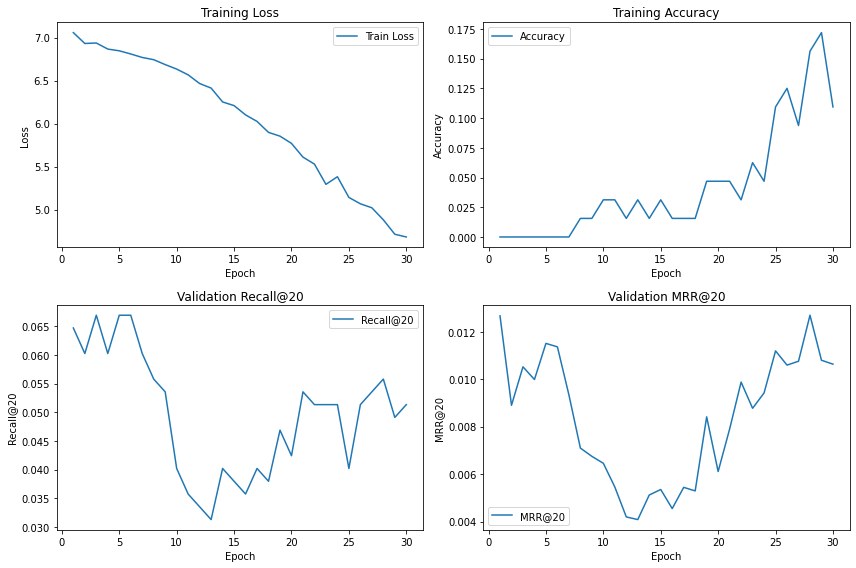

In [70]:
# Plot the metrics
plot_metrics(train_losses, accuracies, val_recalls, val_mrrs)

In [71]:
def test_model(model, args, test):
    test_recall, test_mrr = get_metrics(test, model, args, 20)
    print(f"\t - Recall@{args.k}: {test_recall:3f}")
    print(f"\t - MRR@{args.k}: {test_mrr:3f}\n")

test_model(model, args, test)

Evaluation:   0%|          | 0/67 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   75  159  234  309  313  503  507  573  994 1004 1059 1128 1169
 1176 1235 1275 3271 1287 1550 1604 1648 1669 1682 1723 1760 1838 1864
 1879 1989 1995 2007 2048 2072 2086 2183 2309 2349 2422 2459 2503 2512
 2519 2556 2612 2640 2651 2770 2843 2854 2884 2891 2901 2913 3031 3037
 3058 3092 3104 3154 3181 3211 3236 3253], end=[  74  158  233  308  312  502  506  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3276 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 1994 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3036 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=64, finished=False, mask=[17]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[   3   77  161  236 3276  315 3318  509  575  996 1006 1061 1130 1171
 1178 1237 1277 3273 1289 1552 1606 1650 1671 1684 1725 1762 1840 1866
 1881 1991 1997 2009 2050 2074 

Evaluation:   6%|▌         | 4/67 [00:01<00:18,  3.33it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   5   79  163  238 3278  317 3320  511  577  998 1008 1063 1132 1173
 1180 1239 1279 3352 1291 1554 1608 1652 1673 1686 1727 1764 1842 1868
 1883 3367 1999 2011 2052 2076 2090 2187 2313 2353 2426 2463 2507 2516
 2523 2560 2616 2644 2655 2774 2847 2858 2888 2895 2905 2917 3508 3041
 3062 3096 3108 3158 3185 3215 3240 3257], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=69, finished=False, mask=[17 29 54]
(64, 1, 1245)
Calling update_status
After update: start=[   6   80  164  239 3279  318 3321  512  578  999 1009 1064 1133 3549
 1181 1240 1280 3353 1292 1555 1609 1653 1674 1687 1728 1765 1843 1869
 1884 3368 2000 2012 2053 2077 2091 218

Evaluation:  12%|█▏        | 8/67 [00:02<00:17,  3.32it/s]

Calling update_status
After update: start=[   8   82  166  241 3281  320 3323  514  580 1001 1011 1066 1135 3551
 1183 1242 1282 3355 1294 1557 1611 1655 1676 1689 1730 1767 1845 1871
 1886 3370 2002 2014 2055 2079 2093 2190 2316 2356 2429 2466 3672 3567
 2526 2563 2619 2647 2658 2777 2850 2861 3643 2898 2908 2920 3511 3044
 3065 3099 3111 3161 3188 3218 3243 3260], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 3565
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 2650 2769 2842 2853 2883 3672 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=73, finished=False, mask=[40]
(64, 1, 1245)
Calling update_status
After update: start=[   9   83  167  242 3282  321 3324  515  581 3685 1012 1067 1136 3552
 1184 1243 3804 3356 1295 1558 1612 1656 1677 1690 1731 1768 1846 1872
 1887 3371 2003 2015 2056 2080 2094 2191 2317 2357 2430 246

Evaluation:  18%|█▊        | 12/67 [00:03<00:16,  3.29it/s]

Calling update_status
After update: start=[  12   86  170  245 3285  324 3327  518  584 3688 1015 1070 1139 3555
 1187 1246 3807 3359 1298 1561 1615 1659 3986 1693 1734 1771 1849 1875
 1890 3374 3939 2018 2059 2083 2097 2194 2320 2360 2433 2470 3676 3571
 2530 2567 2623 3839 2662 2781 3903 2865 3647 3829 3965 2924 3515 3048
 3069 4030 3115 3165 3192 3222 3247 3264], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 1878
 1988 3508 3964 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 3252 3271], last_session=83, finished=False, mask=[22 57]
(64, 1, 1245)
Calling update_status
After update: start=[  13   87  171  246 3286  325 3328  519  585 3689 1016 1071 1140 3556
 1188 1247 3808 3360 1299 1562 1616 1660 3987 1694 1735 1772 1850 1876
 1891 3375 3940 2019 2060 4040 2098 2195 2321 2361 2434 

Evaluation:  24%|██▍       | 16/67 [00:04<00:15,  3.29it/s]

Calling update_status
After update: start=[  16   90  174  249 3289  328 3331  522  588 3692 1019 1074 1143 3559
 1191 1250 3811 3363 1302 1565 1619 1663 3990 1697 1738 1775 1853 4045
 1894 3378 3943 2022 2063 4074 2101 2198 2324 2364 2437 2474 3680 3575
 2534 2571 2627 3843 2666 2785 3907 2869 3651 3833 3969 2928 3519 3052
 3073 4034 3119 3169 3196 3226 4167 3268], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 3271], last_session=87, finished=False, mask=[62]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[  18   92  176  251 3291  330 3333  524  590 3694 1021 1076 1145 3561
 1193 1252 3813 3365 1304 1567 1621 1665 3992 1699 1740 1777 1855 4047
 1896 3380 3945 2024 2065 4076 2103 2200 2326

Evaluation:  28%|██▊       | 19/67 [00:05<00:14,  3.31it/s]

Calling update_status
After update: start=[  19   93  177  252 3292  331 3334  525  591 3695 1022 1077 1146 3562
 1194 1253 3814 4385 1305 1568 1622 1666 3993 1700 1741 1778 1856 4048
 1897 3381 3946 2025 2066 4077 2104 2201 2327 2367 2440 2477 3683 3578
 2537 2574 2630 3846 2669 2788 3910 2872 3654 3836 3972 2931 3522 3055
 3076 4037 3122 3172 3199 3229 4170 4370], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 4416 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 4385], last_session=90, finished=True, mask=[17 51]
	 - Recall@20: 0.041118
	 - MRR@20: 0.009342



## 성능 개선 trial 3 - 모델 변경 (layer수 증가)

레이어 수 하나 더 늘리고, batchnormalization을 추가

In [82]:
class Args:
    def __init__(self, tr, val, test, batch_size, hsz, drop_rate, lr, epochs, k, num_items):
        self.tr = tr
        self.val = val
        self.test = test
        self.num_items = total_unique_items
        self.num_sessions = tr['UserId'].nunique()
        self.batch_size = batch_size
        self.hsz = hsz
        self.drop_rate = drop_rate
        self.lr = lr
        self.epochs = epochs
        self.k = k

args = Args(tr, val, test, batch_size=64, hsz=50, drop_rate=0.2, lr=0.001, epochs=30, k=20, num_items = total_unique_items)

from tensorflow.keras.layers import BatchNormalization

def create_model(args):
    inputs = Input(batch_shape=(args.batch_size, 1, args.num_items))
    
    # 첫 번째 GRU 레이어
    gru1 = GRU(args.hsz, stateful=True, return_sequences=True, name='GRU1')(inputs)
    batchnorm1 = BatchNormalization()(gru1)
    dropout1 = Dropout(args.drop_rate)(batchnorm1)
    
    # 두 번째 GRU 레이어
    gru2 = GRU(args.hsz, stateful=True, return_sequences=True, name='GRU2')(dropout1)
    batchnorm2 = BatchNormalization()(gru2)
    dropout2 = Dropout(args.drop_rate)(batchnorm2)
    
    # 세 번째 GRU 레이어
    gru3 = GRU(args.hsz, stateful=True, name='GRU3')(dropout2)
    batchnorm3 = BatchNormalization()(gru3)
    dropout3 = Dropout(args.drop_rate)(batchnorm3)
    
    predictions = Dense(args.num_items, activation='softmax')(dropout3)
    model = Model(inputs=inputs, outputs=predictions)
    model.compile(loss=categorical_crossentropy, optimizer=Adam(args.lr), metrics=['accuracy'])
    model.summary()
    return model

# train 셋으로 학습하면서 valid 셋으로 검증합니다.
def train_model(model, args):
    train_losses = []
    accuracies = []
    val_recalls = []
    val_mrrs = []
    
    model.reset_states()
    train_dataset = SessionDataset(args.tr)
    train_loader = SessionDataLoader(train_dataset, batch_size=args.batch_size)

    for epoch in range(1, args.epochs + 1):
        total_step = len(args.tr) - args.tr['UserId'].nunique()
        tr_loader = tqdm(train_loader, total=total_step // args.batch_size, desc='Train', mininterval=1)
        for feat, target, mask in tr_loader:
            reset_hidden_states(model, mask)  # 종료된 session은 hidden_state를 초기화합니다. 아래 메서드에서 확인해주세요.

            input_ohe = to_categorical(feat, num_classes=args.num_items)
            input_ohe = np.expand_dims(input_ohe, axis=1)
            target_ohe = to_categorical(target, num_classes=args.num_items)

            result = model.train_on_batch(input_ohe, target_ohe)
            tr_loader.set_postfix(train_loss=result[0], accuracy = result[1])
        
        # Save metrics
        train_losses.append(result[0])
        accuracies.append(result[1])
        
        val_recall, val_mrr = get_metrics(args.val, model, args, args.k)  # valid set에 대해 검증합니다.
        val_recalls.append(val_recall)
        val_mrrs.append(val_mrr)

        print(f"\t - Recall@{args.k} epoch {epoch}: {val_recall:3f}")
        print(f"\t - MRR@{args.k}    epoch {epoch}: {val_mrr:3f}\n")

    return train_losses, accuracies, val_recalls, val_mrrs



def reset_hidden_states(model, mask):
    # 첫 번째 GRU 레이어의 상태 초기화
    gru_layer1 = model.get_layer(name='GRU1')
    hidden_states1 = gru_layer1.states[0].numpy()
    for elt in mask:
        hidden_states1[elt, :] = 0
    gru_layer1.reset_states(states=hidden_states1)
    
    # 두 번째 GRU 레이어의 상태 초기화
    gru_layer2 = model.get_layer(name='GRU2')
    hidden_states2 = gru_layer2.states[0].numpy()
    for elt in mask:
        hidden_states2[elt, :] = 0
    gru_layer2.reset_states(states=hidden_states2)
    
    # 세 번째 GRU 레이어의 상태 초기화
    gru_layer3 = model.get_layer(name='GRU3')
    hidden_states3 = gru_layer3.states[0].numpy()
    for elt in mask:
        hidden_states2[elt, :] = 0
    gru_layer3.reset_states(states=hidden_states3)


def get_metrics(data, model, args, k: int):  # valid셋과 test셋을 평가하는 코드입니다. 
                                             # train과 거의 같지만 mrr, recall을 구하는 라인이 있습니다.
    dataset = SessionDataset(data)
    loader = SessionDataLoader(dataset, batch_size=args.batch_size)
    recall_list, mrr_list = [], []

    total_step = len(data) - data['UserId'].nunique()
    for inputs, label, mask in tqdm(loader, total=total_step // args.batch_size, desc='Evaluation', mininterval=1):
        reset_hidden_states(model, mask)
        input_ohe = to_categorical(inputs, num_classes=args.num_items)
        input_ohe = np.expand_dims(input_ohe, axis=1)
        print(input_ohe.shape)

        pred = model.predict(input_ohe, batch_size=args.batch_size)
        pred_arg = tf.argsort(pred, direction='DESCENDING')  # softmax 값이 큰 순서대로 sorting 합니다.

        length = len(inputs)
        recall_list.extend([recall_k(pred_arg[i], label[i], k) for i in range(length)])
        mrr_list.extend([mrr_k(pred_arg[i], label[i], k) for i in range(length)])

    recall, mrr = np.mean(recall_list), np.mean(mrr_list)
    return recall, mrr

def plot_metrics(train_losses, accuracies, val_recalls, val_mrrs):
    epochs = range(1, len(train_losses) + 1)
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(epochs, accuracies, label='Accuracy')
    plt.title('Training Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(epochs, val_recalls, label='Recall@20')
    plt.title('Validation Recall@20')
    plt.xlabel('Epoch')
    plt.ylabel('Recall@20')
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(epochs, val_mrrs, label='MRR@20')
    plt.title('Validation MRR@20')
    plt.xlabel('Epoch')
    plt.ylabel('MRR@20')
    plt.legend()

    plt.tight_layout()
    plt.show()
    
# 이제 모델을 다시 생성합니다.
model = create_model(args)

Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(64, 1, 1245)]           0         
_________________________________________________________________
GRU1 (GRU)                   (64, 1, 50)               194550    
_________________________________________________________________
batch_normalization_6 (Batch (64, 1, 50)               200       
_________________________________________________________________
dropout_21 (Dropout)         (64, 1, 50)               0         
_________________________________________________________________
GRU2 (GRU)                   (64, 1, 50)               15300     
_________________________________________________________________
batch_normalization_7 (Batch (64, 1, 50)               200       
_________________________________________________________________
dropout_22 (Dropout)         (64, 1, 50)               0   

In [83]:
# Call training
train_losses, accuracies, val_recalls, val_mrrs = train_model(model, args)

Train:   1%|          | 1/116 [00:03<05:37,  2.93s/it, accuracy=0, train_loss=7.15]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   1%|          | 1/116 [00:03<05:37,  2.93s/it, accuracy=0, train_loss=7.13]     

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   1%|          | 1/116 [00:03<05:37,  2.93s/it, accuracy=0.0156, train_loss=7.14]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   1%|          | 1/116 [00:03<05:37,  2.93s/it, accuracy=0, train_loss=7.12]     

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:  64%|██████▍   | 74/116 [00:04<00:01, 24.11it/s, accuracy=0, train_loss=7.11]    

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  70%|██████▉   | 81/116 [00:04<00:01, 20.08it/s, accuracy=0.0156, train_loss=7.12]


Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 7431
 3091 4489 7364 6619 6125 3550 6821  950 2581 1059 4915 7597 3938 1184
 7115 6758 7535 1793 5728 1956 7197 2223], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7597 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=280, finished=False, mask=[12 53]
Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)


Evaluation:   6%|▌         | 2/35 [00:01<00:19,  1.65it/s]

Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693 1075 1101 1112 1164 1705
 1188 1194 1213 1224 1229 1711 1286 1302 1313 1317 1332 1619 1379 1397
 1402 1412 1428 1439 1558 1570 1591 1603], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 1227 1281 1734 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=68, finished=False, mask=[19 36 41 47]
(64, 1, 1245)
Calling update_status
After update: start=[   3  100  149  199  207  247  252  260 1734  272  308  316  341  429
  441  466  499  508  521 1627  565  612  655  667  689  740  767  852
  858  895  939  992 1003 1018 1041 1065 1694 1076

Evaluation:  17%|█▋        | 6/35 [00:02<00:11,  2.63it/s]

(64, 1, 1245)


Evaluation:  20%|██        | 7/35 [00:02<00:10,  2.57it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 1: 0.044643
	 - MRR@20    epoch 1: 0.007675



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.99]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=7]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.98]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=7]        

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=7.03]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.96]     

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=7.01]     

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.77it/s, accuracy=0, train_loss=6.93]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.45it/s, accuracy=0.0156, train_loss=6.95]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:10,  3.06it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:09,  3.10it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 2: 0.033482
	 - MRR@20    epoch 2: 0.003119



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.82]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.77]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.86]     

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.83]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.84]     

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.77]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.82]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.36it/s, accuracy=0.0312, train_loss=6.73]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.35it/s, accuracy=0, train_loss=6.77]     


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.30it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 3: 0.033482
	 - MRR@20    epoch 3: 0.003974



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.58]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.55]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.66]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.67]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.56]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:  59%|█████▊    | 68/116 [00:01<00:00, 67.94it/s, accuracy=0, train_loss=6.68]     

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:  70%|██████▉   | 81/116 [00:01<00:00, 68.10it/s, accuracy=0.0156, train_loss=6.59]


Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.23it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.27it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 4: 0.049107
	 - MRR@20    epoch 4: 0.011298



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.43]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.3] 

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]
Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.46]     

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.44]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.32]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.37]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.35]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.55it/s, accuracy=0.0469, train_loss=6.18]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.34it/s, accuracy=0.0156, train_loss=6.28]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.24it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.24it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 5: 0.051339
	 - MRR@20    epoch 5: 0.010153



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=6.08] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.08]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.08]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.17]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6]   

Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 4088
 3043 4441 4117 2855 4555 3502 4390  902 2533 1011 4215 1874 3890 1136
 4168 4575 3221 1745 3955 1908 2611 2175], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=175, finished=False, mask=[ 0 34 39]
Calling update_status
After update: start=[4643 4224 2708 2087 3619 3824 3130 3184 3442  138  182 3970  257 4764
 3640 4586 4407 4283 4417 4306 3598 4314 3338  466 4788 2906 4430  542
 2375 3271 1621  599 3290 2439 4698 3771 4350  763 2025 4752 4597 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.12]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:  64%|██████▍   | 74/116 [00:01<00:00, 73.05it/s, accuracy=0.0312, train_loss=6.09]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.89it/s, accuracy=0.0469, train_loss=6.16]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.40it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.36it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 6: 0.082589
	 - MRR@20    epoch 6: 0.019260



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.87]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.85]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.93]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.88]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.74]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.63]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=5.76]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6]   

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]


Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.70it/s, accuracy=0.0469, train_loss=5.93]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.70it/s, accuracy=0.0625, train_loss=5.9] 

Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]


Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.61it/s, accuracy=0.0938, train_loss=5.76]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.14it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.19it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 7: 0.091518
	 - MRR@20    epoch 7: 0.023611



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.62]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.56] 

Calling update_status
After update: start=[  13 2329 2688 2067 2943   63 2345   90 2811  118  162 2990  237  309
  341 2739 2821 2121 1817  384 2827 2140  427  446 3003 2886 2955  522
 2355 1990 1601  579 2406 2419  695 2759 2621  743 2005 2637 1642 1673
 3024 1698  810 2836 2664 2780  855  883 2514  992 2792 1855 2976 1117
 1491 1508 3107 1726 1554 1889 2592 2156], end=[  29 2337 2733 2112 2954   71 2347   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 2142  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=118, finished=False, mask=[11 24 42 58]
Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.42] 

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.74]

Calling update_status
After update: start=[  27 4218 2702 2081 3613 3818 3124 3178 3436  132  176 3964  251  323
 3634 4274 3164 4277 1831 4300 3592 4308 3332  460 3017 2900 2969  536
 2369 3265 1615  593 3284 2433  709 3765 3567  757 2019 2651 1656 4083
 3038 1712 4112 2850 2678 3497 4338  897 2528 1006 4210 1869 3885 1131
 4163 1522 3216 1740 3950 1903 2606 2170], end=[  29 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 3569  769 2048 2657 1661 4110
 3107 1714 4161 2881 2682 3553 4340  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=158, finished=False, mask=[ 1 15 17 19 21 48]
Calling update_status
After update: start=[4340 4219 2703 2082 3614 3819 3125 3179 3437  133  177 3965  252  324
 3635 4275 3165 4278 1832 4301 3593 4309 3333  461 3018 2901 2970  537
 2370 3266 1616  594 3285 2434  710 3766 4345  758 2020 2

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.72]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.72]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.39]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.43] 

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:  58%|█████▊    | 67/116 [00:01<00:00, 66.58it/s, accuracy=0.0469, train_loss=5.81]

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:  58%|█████▊    | 67/116 [00:01<00:00, 66.58it/s, accuracy=0.0781, train_loss=5.48]

Calling update_status
After update: start=[4679 4260 6388 6329 5272 3860 5810 5407 3478 6988 6772 4006  293 6259
 3676 6405 5453 6930 5209 4846 6879 6352 3374 5754 7026 7008 6975 5516
 6056 4993 5942  635 6420 2475 4734 3807 6900 7031 6098 5552 4633 6001
 3080 4478 4154 6608 6114 3539 6810  939 2570 1048 4904 5154 3927 1173
 4205 6747 6922 1782 5717 1945 6593 2212], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=252, finished=False, mask=[24 37]
Calling update_status
After update: start=[4680 4261 6389 6330 5273 3861 5811 5408 3479 6989 6773 4007  294 6260
 3677 6406 5454 6931 5210 4847 6880 6353 3375 5755 7027 7009 6976 5517
 6057 4994 5943  636 6421 2476 4735 3808 6901 7032 7048 5553 4634 600

Train:  70%|██████▉   | 81/116 [00:01<00:00, 66.61it/s, accuracy=0.0781, train_loss=5.53]


Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 3083 4481 4157 6611 6117 3542 6813  942 2573 1051 4907 5157 3930 1176
 7107 6750 6925 1785 5720 1948 6596 2215], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 6927 1806 5732 1968 6600 2321], last_session=255, finished=False, mask=[56]
Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.35it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.31it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 8: 0.066964
	 - MRR@20    epoch 8: 0.020326



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.39] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.28]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.26]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.24] 

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.46] 

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.1]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.38]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.47]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.44it/s, accuracy=0.0938, train_loss=5.25]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.44it/s, accuracy=0.109, train_loss=5.24] 

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.56it/s, accuracy=0.0781, train_loss=5.37]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.43it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 9: 0.084821
	 - MRR@20    epoch 9: 0.027254



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.22]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.19]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.97] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.15]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.05]

Calling update_status
After update: start=[4643 4224 2708 2087 3619 3824 3130 3184 3442  138  182 3970  257 4764
 3640 4586 4407 4283 4417 4306 3598 4314 3338  466 4788 2906 4430  542
 2375 3271 1621  599 3290 2439 4698 3771 4350  763 2025 4752 4597 4089
 3044 4442 4118 2856 4556 3503 4391  903 2534 1012 4216 1875 3891 1137
 4169 4576 3222 1746 3956 1909 2612 2176], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 4811 2942 4439  554
 2398 3274 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=177, finished=False, mask=[13 24]
Calling update_status
After update: start=[4644 4225 2709 2088 3620 3825 3131 3185 3443  139  183 3971  258 4765
 3641 4587 4408 4284 4418 4811 3599 4315 3339  467 4789 2907 4431  543
 2376 3272 1622  600 3291 2440 4699 3772 4351  764 2026 4753 4598 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.05]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.02] 

Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 4105
 3060 4458 4134 2872 5771 3519 5112  919 2550 1028 4884 5134 3907 1153
 4185 5778 3238 1762 5697 1925 4950 2192], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 4954 2321], last_session=212, finished=False, mask=[17 46 57]
Calling update_status
After update: start=[4660 4241 2725 2104 5253 3841 5791 5388 3459 5421  199 3987  274 4781
 3657 5174 5434 5764 5190 4827 5475 4331 3355 5735 4805 2923 5087 5497
 2392 4974 5072  616 3307 2456 4715 3788 4367 5915 2042 5533 4614 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.19]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]


Train:  65%|██████▍   | 75/116 [00:01<00:00, 74.87it/s, accuracy=0.0781, train_loss=5.27]

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Train:  65%|██████▍   | 75/116 [00:01<00:00, 74.87it/s, accuracy=0.156, train_loss=4.99] 

Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561 7422 7429
 3089 4487 7362 6617 6123 3548 6819  948 2579 1057 4913 5163 3936 1182
 7113 6756 7533 1791 5726 1954 7195 2221], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=276, finished=False, mask=[27 58]
Calling update_status
After update: start=[4689 4270 7270 7369 5282 3870 5820 7331 7154 6998 6782 4016 7105 6269
 3686 7182 7376 6940 5219 4856 6889 7537 3384 7383 7138 7018 7575 7450
 6066 5003 5952  645 6430 2485 4744 7346 6910 7041 7057 5562 7423 743

Train:  70%|██████▉   | 81/116 [00:01<00:00, 74.73it/s, accuracy=0.141, train_loss=5.01]


Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 7432
 3092 4490 7365 6620 6126 3551 6822  951 2582 1060 4916 7598 3939 1185
 7116 6759 7536 1794 5729 1957 7198 2224], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7611 6803 4081 7597 6300
 3759 7709 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=283, finished=True, mask=[ 9 15 58]


Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.44it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.42it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 10: 0.091518
	 - MRR@20    epoch 10: 0.027730



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.8]  

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.91]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.68] 

Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 1677
 3028 1702  814 2840 2668 2784  859  887 2518  996 2796 1859 2980 1121
 3196 1512 3206 1730 1558 1893 2596 2160], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=126, finished=False, mask=[29 32]
Calling update_status
After update: start=[  18 2334 2693 2072 2948   68 3115 3169 2816  123  167 2995  242  314
  346 2744 3155 2126 1822  389 3318 3146 3323  451 3008 2891 2960  527
 2360 3256 1606  584 3275 2424  700 2764 2626  748 2010 2642 1647 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.87]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.65] 

Calling update_status
After update: start=[4643 4224 2708 2087 3619 3824 3130 3184 3442  138  182 3970  257 4764
 3640 4586 4407 4283 4417 4306 3598 4314 3338  466 4788 2906 4430  542
 2375 3271 1621  599 3290 2439 4698 3771 4350  763 2025 4752 4597 4089
 3044 4442 4118 2856 4556 3503 4391  903 2534 1012 4216 1875 3891 1137
 4169 4576 3222 1746 3956 1909 2612 2176], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 4811 2942 4439  554
 2398 3274 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=177, finished=False, mask=[13 24]
Calling update_status
After update: start=[4644 4225 2709 2088 3620 3825 3131 3185 3443  139  183 3971  258 4765
 3641 4587 4408 4284 4418 4811 3599 4315 3339  467 4789 2907 4431  543
 2376 3272 1622  600 3291 2440 4699 3772 4351  764 2026 4753 4598 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=4.94]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.71] 

Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 4105
 3060 4458 4134 2872 5771 3519 5112  919 2550 1028 4884 5134 3907 1153
 4185 5778 3238 1762 5697 1925 4950 2192], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 5778 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 4954 2321], last_session=212, finished=False, mask=[17 46 57]
Calling update_status
After update: start=[4660 4241 2725 2104 5253 3841 5791 5388 3459 5421  199 3987  274 4781
 3657 5174 5434 5764 5190 4827 5475 4331 3355 5735 4805 2923 5087 5497
 2392 4974 5072  616 3307 2456 4715 3788 4367 5915 2042 5533 4614 

Train:  65%|██████▍   | 75/116 [00:01<00:00, 74.90it/s, accuracy=0.188, train_loss=4.69] 

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Train:  70%|██████▉   | 81/116 [00:01<00:00, 74.84it/s, accuracy=0.141, train_loss=4.88]


Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 7431
 3091 4489 7364 6619 6125 3550 6821  950 2581 1059 4915 7597 3938 1184
 7115 6758 7535 1793 5728 1956 7197 2223], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7597 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=280, finished=False, mask=[12 53]
Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.32it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.33it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 11: 0.078125
	 - MRR@20    epoch 11: 0.029441



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.62] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.8]  

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.54] 

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=4.63] 

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:  61%|██████    | 71/116 [00:01<00:00, 70.27it/s, accuracy=0.109, train_loss=4.64] 

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 70.77it/s, accuracy=0.156, train_loss=4.51] 


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.40it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.40it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 12: 0.093750
	 - MRR@20    epoch 12: 0.034905



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.29] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.38]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.46] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.31]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.3] 

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=4.12] 

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.34]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.23]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.65it/s, accuracy=0.172, train_loss=4.31]

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.65it/s, accuracy=0.172, train_loss=4.28] 

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.71it/s, accuracy=0.172, train_loss=4.31]


Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 7431
 3091 4489 7364 6619 6125 3550 6821  950 2581 1059 4915 7597 3938 1184
 7115 6758 7535 1793 5728 1956 7197 2223], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7597 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=280, finished=False, mask=[12 53]
Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:10,  3.08it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:09,  3.07it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 13: 0.084821
	 - MRR@20    epoch 13: 0.028405



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.82]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.18]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]
Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=4.1] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=4.33]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.29]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=4.26]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.11]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.37]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.57it/s, accuracy=0.203, train_loss=4.09]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.57it/s, accuracy=0.172, train_loss=4.18]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.50it/s, accuracy=0.141, train_loss=4.14]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:   9%|▊         | 3/35 [00:01<00:11,  2.81it/s]

Calling update_status
After update: start=[   3  100  149  199  207  247  252  260 1734  272  308  316  341  429
  441  466  499  508  521 1627  565  612  655  667  689  740  767  852
  858  895  939  992 1003 1018 1041 1065 1694 1076 1102 1113 1165 1706
 1189 1195 1214 1225 1230 1712 1287 1303 1974 1318 1333 1620 1380 1398
 1403 1413 1429 1440 1559 1571 1592 1604], end=[  97  146  196  204  244  249  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 1227 1281 1734 1300 1311 2000 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=70, finished=False, mask=[ 8 50]
(64, 1, 1245)
Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 

Evaluation:  20%|██        | 7/35 [00:02<00:09,  3.11it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 14: 0.082589
	 - MRR@20    epoch 14: 0.030826



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=3.95]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=3.97]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.8]  

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.19]

Calling update_status
After update: start=[  27 4218 2702 2081 3613 3818 3124 3178 3436  132  176 3964  251  323
 3634 4274 3164 4277 1831 4300 3592 4308 3332  460 3017 2900 2969  536
 2369 3265 1615  593 3284 2433  709 3765 3567  757 2019 2651 1656 4083
 3038 1712 4112 2850 2678 3497 4338  897 2528 1006 4210 1869 3885 1131
 4163 1522 3216 1740 3950 1903 2606 2170], end=[  29 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 3569  769 2048 2657 1661 4110
 3107 1714 4161 2881 2682 3553 4340  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=158, finished=False, mask=[ 1 15 17 19 21 48]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=4.12]

Calling update_status
After update: start=[4340 4219 2703 2082 3614 3819 3125 3179 3437  133  177 3965  252  324
 3635 4275 3165 4278 1832 4301 3593 4309 3333  461 3018 2901 2970  537
 2370 3266 1616  594 3285 2434  710 3766 4345  758 2020 2652 1657 4084
 3039 4383 4113 2851 2679 3498 4386  898 2529 1007 4211 1870 3886 1132
 4164 1523 3217 1741 3951 1904 2607 2171], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=162, finished=False, mask=[ 0 36 43 48]
Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.15]

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]
Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.91]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]
Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 409

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.05]

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]
Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539

Train:  58%|█████▊    | 67/116 [00:01<00:00, 66.73it/s, accuracy=0.141, train_loss=4.15]

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:  58%|█████▊    | 67/116 [00:01<00:00, 66.73it/s, accuracy=0.172, train_loss=4.12]

Calling update_status
After update: start=[4680 4261 6389 6330 5273 3861 5811 5408 3479 6989 6773 4007  294 6260
 3677 6406 5454 6931 5210 4847 6880 6353 3375 5755 7027 7009 6976 5517
 6057 4994 5943  636 6421 2476 4735 3808 6901 7032 7048 5553 4634 6002
 3081 4479 4155 6609 6115 3540 6811  940 2571 1049 4905 5155 3928 1174
 4206 6748 6923 1783 5718 1946 6594 2213], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=253, finished=False, mask=[38]
Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 

Train:  70%|██████▉   | 81/116 [00:01<00:00, 67.59it/s, accuracy=0.172, train_loss=3.82]


Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 3083 4481 4157 6611 6117 3542 6813  942 2573 1051 4907 5157 3930 1176
 7107 6750 6925 1785 5720 1948 6596 2215], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 6927 1806 5732 1968 6600 2321], last_session=255, finished=False, mask=[56]
Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.36it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 15: 0.082589
	 - MRR@20    epoch 15: 0.027620



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=3.92]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=3.89]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=3.84]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.7] 

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.91]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=3.85]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.61]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.50it/s, accuracy=0.297, train_loss=3.81]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.60it/s, accuracy=0.219, train_loss=3.54]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.40it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.38it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 16: 0.075893
	 - MRR@20    epoch 16: 0.027649



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.65]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.42] 

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]
Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.73]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=3.42]

Calling update_status
After update: start=[4340 4219 2703 2082 3614 3819 3125 3179 3437  133  177 3965  252  324
 3635 4275 3165 4278 1832 4301 3593 4309 3333  461 3018 2901 2970  537
 2370 3266 1616  594 3285 2434  710 3766 4345  758 2020 2652 1657 4084
 3039 4383 4113 2851 2679 3498 4386  898 2529 1007 4211 1870 3886 1132
 4164 1523 3217 1741 3951 1904 2607 2171], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=162, finished=False, mask=[ 0 36 43 48]
Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.48]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.52]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=3.72]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.81]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:  59%|█████▉    | 69/116 [00:01<00:00, 68.89it/s, accuracy=0.328, train_loss=3.4] 

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  59%|█████▉    | 69/116 [00:01<00:00, 68.89it/s, accuracy=0.219, train_loss=3.6] 

Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Train:  70%|██████▉   | 81/116 [00:01<00:00, 69.55it/s, accuracy=0.297, train_loss=3.45]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.31it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 17: 0.084821
	 - MRR@20    epoch 17: 0.024784



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.58]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.35] 

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.31] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.51]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.59]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:  60%|██████    | 70/116 [00:01<00:00, 69.61it/s, accuracy=0.25, train_loss=3.43] 

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 69.89it/s, accuracy=0.344, train_loss=3.21]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.35it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 18: 0.069196
	 - MRR@20    epoch 18: 0.023359



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.73] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.58]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=3.32]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3.35]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3.44]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=3.31]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.72]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=3.61]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.60it/s, accuracy=0.312, train_loss=3.2] 

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.60it/s, accuracy=0.375, train_loss=2.92]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.51it/s, accuracy=0.312, train_loss=3.17]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.38it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.38it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 19: 0.075893
	 - MRR@20    epoch 19: 0.027143



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=3.3] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3.13]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]
Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3.31]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=3.04]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=3.28]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.22]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=3.28]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=3.47]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]


Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.51it/s, accuracy=0.297, train_loss=3.11]

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.51it/s, accuracy=0.281, train_loss=3.24]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]


Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.32it/s, accuracy=0.297, train_loss=3.06]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.30it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.31it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 20: 0.089286
	 - MRR@20    epoch 20: 0.028809



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.27]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.08]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=2.86]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=3.36]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=2.9]  

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=3.25]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.469, train_loss=2.65]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:  60%|██████    | 70/116 [00:01<00:00, 69.14it/s, accuracy=0.297, train_loss=3.25]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 68.96it/s, accuracy=0.375, train_loss=2.94]


Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 3084 4482 4158 6612 6118 3543 6814  943 2574 1052 4908 5158 3931 1177
 7108 6751 7143 1786 5721 1949 6597 2216], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=258, finished=False, mask=[23 24 58]
Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.38it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 21: 0.082589
	 - MRR@20    epoch 21: 0.028152



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.84]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=2.93]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.02]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=2.68]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=3.05]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=3.17]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.32]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.87]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 71.93it/s, accuracy=0.281, train_loss=3.14]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 71.93it/s, accuracy=0.281, train_loss=3]   

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.89it/s, accuracy=0.328, train_loss=2.95]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.29it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.22it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 22: 0.069196
	 - MRR@20    epoch 22: 0.027158



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.04]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.63]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]
Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.93]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=3]   

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.73]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.87]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.8] 

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.76]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.46it/s, accuracy=0.391, train_loss=2.56]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.46it/s, accuracy=0.359, train_loss=3.06]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.54it/s, accuracy=0.312, train_loss=3.04]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.36it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.38it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 23: 0.082589
	 - MRR@20    epoch 23: 0.030177



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.89]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.97]

Calling update_status
After update: start=[  13 2329 2688 2067 2943   63 2345   90 2811  118  162 2990  237  309
  341 2739 2821 2121 1817  384 2827 2140  427  446 3003 2886 2955  522
 2355 1990 1601  579 2406 2419  695 2759 2621  743 2005 2637 1642 1673
 3024 1698  810 2836 2664 2780  855  883 2514  992 2792 1855 2976 1117
 1491 1508 3107 1726 1554 1889 2592 2156], end=[  29 2337 2733 2112 2954   71 2347   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 2142  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=118, finished=False, mask=[11 24 42 58]
Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=3.07]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=2.77]

Calling update_status
After update: start=[4340 4219 2703 2082 3614 3819 3125 3179 3437  133  177 3965  252  324
 3635 4275 3165 4278 1832 4301 3593 4309 3333  461 3018 2901 2970  537
 2370 3266 1616  594 3285 2434  710 3766 4345  758 2020 2652 1657 4084
 3039 4383 4113 2851 2679 3498 4386  898 2529 1007 4211 1870 3886 1132
 4164 1523 3217 1741 3951 1904 2607 2171], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=162, finished=False, mask=[ 0 36 43 48]
Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.6] 

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=2.94]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.92]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  61%|██████    | 71/116 [00:01<00:00, 70.50it/s, accuracy=0.234, train_loss=3.13]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 69.08it/s, accuracy=0.406, train_loss=2.64]


Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.30it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 24: 0.073661
	 - MRR@20    epoch 24: 0.027622



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3]   

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3.01]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.53]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.61]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=2.88]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.84]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.89]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.79]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.67it/s, accuracy=0.375, train_loss=2.74]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.67it/s, accuracy=0.344, train_loss=2.95]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.67it/s, accuracy=0.281, train_loss=2.81]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 25: 0.080357
	 - MRR@20    epoch 25: 0.031075



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=2.68]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=2.81]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.43]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.79]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.65]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.67]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=3.32]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=2.64]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.28it/s, accuracy=0.328, train_loss=2.7] 

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.28it/s, accuracy=0.406, train_loss=2.68]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.18it/s, accuracy=0.312, train_loss=2.72]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.37it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 26: 0.078125
	 - MRR@20    epoch 26: 0.028382



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=2.65]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.74]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.68]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.31]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.516, train_loss=2.32]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=2.81]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.58]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.91it/s, accuracy=0.328, train_loss=2.71]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.91it/s, accuracy=0.422, train_loss=2.67]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]


Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.97it/s, accuracy=0.469, train_loss=2.6] 


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.25it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.29it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 27: 0.084821
	 - MRR@20    epoch 27: 0.026105



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.55]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.59]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]
Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.65]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.47]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.484, train_loss=2.34]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.39]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=2.9] 

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.61it/s, accuracy=0.469, train_loss=2.41]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.58it/s, accuracy=0.438, train_loss=2.33]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.31it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 28: 0.073661
	 - MRR@20    epoch 28: 0.030818



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.453, train_loss=2.49]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.38]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.484, train_loss=2.01]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.44]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.49]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.58]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=2.91]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=2.71]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  64%|██████▍   | 74/116 [00:01<00:00, 73.28it/s, accuracy=0.406, train_loss=2.21]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  64%|██████▍   | 74/116 [00:01<00:00, 73.28it/s, accuracy=0.359, train_loss=2.62]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 73.22it/s, accuracy=0.469, train_loss=2.24]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.35it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.37it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 29: 0.071429
	 - MRR@20    epoch 29: 0.030299



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.45]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.59]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.74]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.58]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.29]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.48]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.578, train_loss=2.21]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  60%|██████    | 70/116 [00:01<00:00, 69.72it/s, accuracy=0.453, train_loss=2.5] 

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 70.06it/s, accuracy=0.562, train_loss=2.16]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.17it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.28it/s]

Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 30: 0.075893
	 - MRR@20    epoch 30: 0.029915



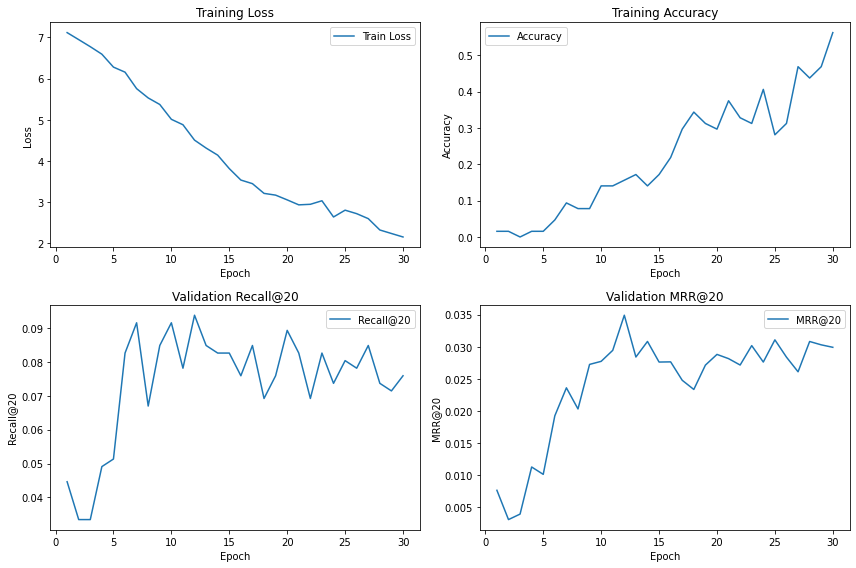

In [84]:
# Plot the metrics
plot_metrics(train_losses, accuracies, val_recalls, val_mrrs)

In [85]:
def test_model(model, args, test):
    test_recall, test_mrr = get_metrics(test, model, args, 20)
    print(f"\t - Recall@{args.k}: {test_recall:3f}")
    print(f"\t - MRR@{args.k}: {test_mrr:3f}\n")

test_model(model, args, test)

Evaluation:   0%|          | 0/67 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   75  159  234  309  313  503  507  573  994 1004 1059 1128 1169
 1176 1235 1275 3271 1287 1550 1604 1648 1669 1682 1723 1760 1838 1864
 1879 1989 1995 2007 2048 2072 2086 2183 2309 2349 2422 2459 2503 2512
 2519 2556 2612 2640 2651 2770 2843 2854 2884 2891 2901 2913 3031 3037
 3058 3092 3104 3154 3181 3211 3236 3253], end=[  74  158  233  308  312  502  506  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3276 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 1994 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3036 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=64, finished=False, mask=[17]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[   3   77  161  236 3276  315 3318  509  575  996 1006 1061 1130 1171
 1178 1237 1277 3273 1289 1552 1606 1650 1671 1684 1725 1762 1840 1866
 1881 1991 1997 2009 2050 2074 

Evaluation:   6%|▌         | 4/67 [00:01<00:18,  3.35it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   5   79  163  238 3278  317 3320  511  577  998 1008 1063 1132 1173
 1180 1239 1279 3352 1291 1554 1608 1652 1673 1686 1727 1764 1842 1868
 1883 3367 1999 2011 2052 2076 2090 2187 2313 2353 2426 2463 2507 2516
 2523 2560 2616 2644 2655 2774 2847 2858 2888 2895 2905 2917 3508 3041
 3062 3096 3108 3158 3185 3215 3240 3257], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=69, finished=False, mask=[17 29 54]
(64, 1, 1245)
Calling update_status
After update: start=[   6   80  164  239 3279  318 3321  512  578  999 1009 1064 1133 3549
 1181 1240 1280 3353 1292 1555 1609 1653 1674 1687 1728 1765 1843 1869
 1884 3368 2000 2012 2053 2077 2091 218

Evaluation:  12%|█▏        | 8/67 [00:02<00:17,  3.34it/s]

Calling update_status
After update: start=[   8   82  166  241 3281  320 3323  514  580 1001 1011 1066 1135 3551
 1183 1242 1282 3355 1294 1557 1611 1655 1676 1689 1730 1767 1845 1871
 1886 3370 2002 2014 2055 2079 2093 2190 2316 2356 2429 2466 3672 3567
 2526 2563 2619 2647 2658 2777 2850 2861 3643 2898 2908 2920 3511 3044
 3065 3099 3111 3161 3188 3218 3243 3260], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 3565
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 2650 2769 2842 2853 2883 3672 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=73, finished=False, mask=[40]
(64, 1, 1245)
Calling update_status
After update: start=[   9   83  167  242 3282  321 3324  515  581 3685 1012 1067 1136 3552
 1184 1243 3804 3356 1295 1558 1612 1656 1677 1690 1731 1768 1846 1872
 1887 3371 2003 2015 2056 2080 2094 2191 2317 2357 2430 246

Evaluation:  18%|█▊        | 12/67 [00:03<00:16,  3.26it/s]

Calling update_status
After update: start=[  12   86  170  245 3285  324 3327  518  584 3688 1015 1070 1139 3555
 1187 1246 3807 3359 1298 1561 1615 1659 3986 1693 1734 1771 1849 1875
 1890 3374 3939 2018 2059 2083 2097 2194 2320 2360 2433 2470 3676 3571
 2530 2567 2623 3839 2662 2781 3903 2865 3647 3829 3965 2924 3515 3048
 3069 4030 3115 3165 3192 3222 3247 3264], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 1878
 1988 3508 3964 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 3252 3271], last_session=83, finished=False, mask=[22 57]
(64, 1, 1245)
Calling update_status
After update: start=[  13   87  171  246 3286  325 3328  519  585 3689 1016 1071 1140 3556
 1188 1247 3808 3360 1299 1562 1616 1660 3987 1694 1735 1772 1850 1876
 1891 3375 3940 2019 2060 4040 2098 2195 2321 2361 2434 

Evaluation:  24%|██▍       | 16/67 [00:04<00:15,  3.27it/s]

Calling update_status
After update: start=[  16   90  174  249 3289  328 3331  522  588 3692 1019 1074 1143 3559
 1191 1250 3811 3363 1302 1565 1619 1663 3990 1697 1738 1775 1853 4045
 1894 3378 3943 2022 2063 4074 2101 2198 2324 2364 2437 2474 3680 3575
 2534 2571 2627 3843 2666 2785 3907 2869 3651 3833 3969 2928 3519 3052
 3073 4034 3119 3169 3196 3226 4167 3268], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 3271], last_session=87, finished=False, mask=[62]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[  18   92  176  251 3291  330 3333  524  590 3694 1021 1076 1145 3561
 1193 1252 3813 3365 1304 1567 1621 1665 3992 1699 1740 1777 1855 4047
 1896 3380 3945 2024 2065 4076 2103 2200 2326

Evaluation:  28%|██▊       | 19/67 [00:05<00:14,  3.28it/s]

Calling update_status
After update: start=[  19   93  177  252 3292  331 3334  525  591 3695 1022 1077 1146 3562
 1194 1253 3814 4385 1305 1568 1622 1666 3993 1700 1741 1778 1856 4048
 1897 3381 3946 2025 2066 4077 2104 2201 2327 2367 2440 2477 3683 3578
 2537 2574 2630 3846 2669 2788 3910 2872 3654 3836 3972 2931 3522 3055
 3076 4037 3122 3172 3199 3229 4170 4370], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 4416 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 4385], last_session=90, finished=True, mask=[17 51]
	 - Recall@20: 0.041118
	 - MRR@20: 0.010187



흠...맨 처음 시도한 결과와 처음(레이어 하나)과 큰 차이는 없는듯...  
그래도 MRR@20은 레이어가 하나인 경우에 비해 증가했다.

## 성능 개선 trial 4 - 모델 변경 (CNN 써보기)

In [87]:
class Args:
    def __init__(self, tr, val, test, batch_size, hsz, drop_rate, lr, epochs, k, num_items):
        self.tr = tr
        self.val = val
        self.test = test
        self.num_items = total_unique_items
        self.num_sessions = tr['UserId'].nunique()
        self.batch_size = batch_size
        self.hsz = hsz
        self.drop_rate = drop_rate
        self.lr = lr
        self.epochs = epochs
        self.k = k

args = Args(tr, val, test, batch_size=64, hsz=50, drop_rate=0.2, lr=0.001, epochs=30, k=20, num_items = total_unique_items)

from tensorflow.keras.layers import BatchNormalization

def create_cnn_model(args):
    inputs = Input(shape=(1, args.num_items))
    
    # 컨볼루션 레이어
    conv1 = Conv1D(filters=args.hsz, kernel_size=2, padding='same', activation='relu')(inputs)
    batchnorm1 = BatchNormalization()(conv1)
    dropout1 = Dropout(args.drop_rate)(batchnorm1)
    
    # Global Max Pooling 레이어
    global_max_pool = GlobalMaxPooling1D()(dropout1)
    
    # Dense 레이어
    dense = Dense(args.hsz, activation='relu')(global_max_pool)
    batchnorm2 = BatchNormalization()(dense)
    dropout2 = Dropout(args.drop_rate)(batchnorm2)
    
    predictions = Dense(args.num_items, activation='softmax')(dropout2)
    model = Model(inputs=inputs, outputs=predictions)
    model.compile(loss=categorical_crossentropy, optimizer=Adam(args.lr), metrics=['accuracy'])
    model.summary()
    return model

# train 셋으로 학습하면서 valid 셋으로 검증합니다.
def train_model(model, args):
    train_losses = []
    accuracies = []
    val_recalls = []
    val_mrrs = []
    
    model.reset_states()
    train_dataset = SessionDataset(args.tr)
    train_loader = SessionDataLoader(train_dataset, batch_size=args.batch_size)

    for epoch in range(1, args.epochs + 1):
        total_step = len(args.tr) - args.tr['UserId'].nunique()
        tr_loader = tqdm(train_loader, total=total_step // args.batch_size, desc='Train', mininterval=1)
        for feat, target, mask in tr_loader:
            reset_hidden_states(model, mask)  # 종료된 session은 hidden_state를 초기화합니다. 아래 메서드에서 확인해주세요.

            input_ohe = to_categorical(feat, num_classes=args.num_items)
            input_ohe = np.expand_dims(input_ohe, axis=1)
            target_ohe = to_categorical(target, num_classes=args.num_items)

            result = model.train_on_batch(input_ohe, target_ohe)
            tr_loader.set_postfix(train_loss=result[0], accuracy = result[1])
        
        # Save metrics
        train_losses.append(result[0])
        accuracies.append(result[1])
        
        val_recall, val_mrr = get_metrics(args.val, model, args, args.k)  # valid set에 대해 검증합니다.
        val_recalls.append(val_recall)
        val_mrrs.append(val_mrr)

        print(f"\t - Recall@{args.k} epoch {epoch}: {val_recall:3f}")
        print(f"\t - MRR@{args.k}    epoch {epoch}: {val_mrr:3f}\n")

    return train_losses, accuracies, val_recalls, val_mrrs



def reset_hidden_states(model, mask):
    # 첫 번째 GRU 레이어의 상태 초기화
    gru_layer1 = model.get_layer(name='GRU1')
    hidden_states1 = gru_layer1.states[0].numpy()
    for elt in mask:
        hidden_states1[elt, :] = 0
    gru_layer1.reset_states(states=hidden_states1)
    
    # 두 번째 GRU 레이어의 상태 초기화
    gru_layer2 = model.get_layer(name='GRU2')
    hidden_states2 = gru_layer2.states[0].numpy()
    for elt in mask:
        hidden_states2[elt, :] = 0
    gru_layer2.reset_states(states=hidden_states2)
    
    # 세 번째 GRU 레이어의 상태 초기화
    gru_layer3 = model.get_layer(name='GRU3')
    hidden_states3 = gru_layer3.states[0].numpy()
    for elt in mask:
        hidden_states2[elt, :] = 0
    gru_layer3.reset_states(states=hidden_states3)


def get_metrics(data, model, args, k: int):  # valid셋과 test셋을 평가하는 코드입니다. 
                                             # train과 거의 같지만 mrr, recall을 구하는 라인이 있습니다.
    dataset = SessionDataset(data)
    loader = SessionDataLoader(dataset, batch_size=args.batch_size)
    recall_list, mrr_list = [], []

    total_step = len(data) - data['UserId'].nunique()
    for inputs, label, mask in tqdm(loader, total=total_step // args.batch_size, desc='Evaluation', mininterval=1):
        reset_hidden_states(model, mask)
        input_ohe = to_categorical(inputs, num_classes=args.num_items)
        input_ohe = np.expand_dims(input_ohe, axis=1)
        print(input_ohe.shape)

        pred = model.predict(input_ohe, batch_size=args.batch_size)
        pred_arg = tf.argsort(pred, direction='DESCENDING')  # softmax 값이 큰 순서대로 sorting 합니다.

        length = len(inputs)
        recall_list.extend([recall_k(pred_arg[i], label[i], k) for i in range(length)])
        mrr_list.extend([mrr_k(pred_arg[i], label[i], k) for i in range(length)])

    recall, mrr = np.mean(recall_list), np.mean(mrr_list)
    return recall, mrr

def plot_metrics(train_losses, accuracies, val_recalls, val_mrrs):
    epochs = range(1, len(train_losses) + 1)
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(epochs, accuracies, label='Accuracy')
    plt.title('Training Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(epochs, val_recalls, label='Recall@20')
    plt.title('Validation Recall@20')
    plt.xlabel('Epoch')
    plt.ylabel('Recall@20')
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(epochs, val_mrrs, label='MRR@20')
    plt.title('Validation MRR@20')
    plt.xlabel('Epoch')
    plt.ylabel('MRR@20')
    plt.legend()

    plt.tight_layout()
    plt.show()
    
# 이제 모델을 다시 생성합니다.
model = create_model(args)

Model: "model_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_14 (InputLayer)        [(64, 1, 1245)]           0         
_________________________________________________________________
GRU1 (GRU)                   (64, 1, 50)               194550    
_________________________________________________________________
batch_normalization_9 (Batch (64, 1, 50)               200       
_________________________________________________________________
dropout_24 (Dropout)         (64, 1, 50)               0         
_________________________________________________________________
GRU2 (GRU)                   (64, 1, 50)               15300     
_________________________________________________________________
batch_normalization_10 (Batc (64, 1, 50)               200       
_________________________________________________________________
dropout_25 (Dropout)         (64, 1, 50)               0  

In [88]:
# Call training
train_losses, accuracies, val_recalls, val_mrrs = train_model(model, args)

Train:   1%|          | 1/116 [00:03<05:23,  2.81s/it, accuracy=0, train_loss=7.13]     

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   1%|          | 1/116 [00:03<05:23,  2.81s/it, accuracy=0, train_loss=7.16]     

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   1%|          | 1/116 [00:03<05:23,  2.81s/it, accuracy=0, train_loss=7.16]     

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   1%|          | 1/116 [00:03<05:23,  2.81s/it, accuracy=0, train_loss=7.2]      

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:  64%|██████▍   | 74/116 [00:03<00:01, 24.73it/s, accuracy=0.0156, train_loss=7.08]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  70%|██████▉   | 81/116 [00:03<00:01, 20.65it/s, accuracy=0, train_loss=7.17]     


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)


Evaluation:   3%|▎         | 1/35 [00:01<00:41,  1.22s/it]

Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693 1075 1101 111

Evaluation:  14%|█▍        | 5/35 [00:02<00:13,  2.29it/s]

Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 1104 1115 1167 1708
 2106 1197 1216 2029 1232 1714 1289 1305 1976 1320 1335 1622 1382 2077
 1405 1415 1431 1442 1561 1573 1594 1606], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=75, finished=False, mask=[27 42]
(64, 1, 1245)
(64, 1, 1245)


Evaluation:  20%|██        | 7/35 [00:03<00:12,  2.31it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 1: 0.035714
	 - MRR@20    epoch 1: 0.006228



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=7]   

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=7.03]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.98]     

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.98]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=7.03]     

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.96]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.95]     

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.99]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.35it/s, accuracy=0, train_loss=6.93]     

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.35it/s, accuracy=0, train_loss=6.93]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.39it/s, accuracy=0, train_loss=6.97]     


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.27it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.31it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 2: 0.053571
	 - MRR@20    epoch 2: 0.009420



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.9] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.83]

Calling update_status
After update: start=[  13 2329 2688 2067 2943   63 2345   90 2811  118  162 2990  237  309
  341 2739 2821 2121 1817  384 2827 2140  427  446 3003 2886 2955  522
 2355 1990 1601  579 2406 2419  695 2759 2621  743 2005 2637 1642 1673
 3024 1698  810 2836 2664 2780  855  883 2514  992 2792 1855 2976 1117
 1491 1508 3107 1726 1554 1889 2592 2156], end=[  29 2337 2733 2112 2954   71 2347   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 2142  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=118, finished=False, mask=[11 24 42 58]
Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.85]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.84]     

Calling update_status
After update: start=[4340 4219 2703 2082 3614 3819 3125 3179 3437  133  177 3965  252  324
 3635 4275 3165 4278 1832 4301 3593 4309 3333  461 3018 2901 2970  537
 2370 3266 1616  594 3285 2434  710 3766 4345  758 2020 2652 1657 4084
 3039 4383 4113 2851 2679 3498 4386  898 2529 1007 4211 1870 3886 1132
 4164 1523 3217 1741 3951 1904 2607 2171], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=162, finished=False, mask=[ 0 36 43 48]
Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.85]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.86]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.85]     

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  61%|██████    | 71/116 [00:01<00:00, 70.30it/s, accuracy=0.0312, train_loss=6.73]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 70.20it/s, accuracy=0.0156, train_loss=6.76]


Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.42it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 3: 0.055804
	 - MRR@20    epoch 3: 0.010194



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.66]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=6.69]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.66]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.63]     

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.66]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.61]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.66]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.63]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.64it/s, accuracy=0.0469, train_loss=6.47]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.64it/s, accuracy=0.0156, train_loss=6.55]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.46it/s, accuracy=0.0156, train_loss=6.59]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.42it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.36it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 4: 0.053571
	 - MRR@20    epoch 4: 0.008094



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.49]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.49]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.37]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=6.36]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=6.47]     

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.35]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.23]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.37]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.04it/s, accuracy=0.0781, train_loss=6.27]

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.04it/s, accuracy=0.0625, train_loss=6.25]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.61it/s, accuracy=0.0625, train_loss=6.33]


Calling update_status
After update: start=[4689 4270 7270 7369 5282 3870 5820 7331 7154 6998 6782 4016 7105 6269
 3686 7182 7376 6940 5219 4856 6889 7537 3384 7383 7138 7018 7575 7450
 6066 5003 5952  645 6430 2485 4744 7346 6910 7041 7057 5562 7423 7430
 3090 4488 7363 6618 6124 3549 6820  949 2580 1058 4914 5164 3937 1183
 7114 6757 7534 1792 5727 1955 7196 2222], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=278, finished=False, mask=[21 26]
Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.38it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 5: 0.064732
	 - MRR@20    epoch 5: 0.015653



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.29]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.21]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.27]

Calling update_status
After update: start=[  27 4218 2702 2081 3613 3818 3124 3178 3436  132  176 3964  251  323
 3634 4274 3164 4277 1831 4300 3592 4308 3332  460 3017 2900 2969  536
 2369 3265 1615  593 3284 2433  709 3765 3567  757 2019 2651 1656 4083
 3038 1712 4112 2850 2678 3497 4338  897 2528 1006 4210 1869 3885 1131
 4163 1522 3216 1740 3950 1903 2606 2170], end=[  29 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 3569  769 2048 2657 1661 4110
 3107 1714 4161 2881 2682 3553 4340  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=158, finished=False, mask=[ 1 15 17 19 21 48]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.17]

Calling update_status
After update: start=[4340 4219 2703 2082 3614 3819 3125 3179 3437  133  177 3965  252  324
 3635 4275 3165 4278 1832 4301 3593 4309 3333  461 3018 2901 2970  537
 2370 3266 1616  594 3285 2434  710 3766 4345  758 2020 2652 1657 4084
 3039 4383 4113 2851 2679 3498 4386  898 2529 1007 4211 1870 3886 1132
 4164 1523 3217 1741 3951 1904 2607 2171], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=162, finished=False, mask=[ 0 36 43 48]
Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.2] 

Calling update_status
After update: start=[4650 4231 2715 2094 3626 3831 3137 3191 3449  145  189 3977  264 4771
 3647 4593 5053 4290 4424 4817 5057 4321 3345  473 4795 2913 4437  549
 2382 4964 5062  606 3297 2446 4705 3778 4357 5032 2032 4759 4604 4096
 3051 4449 4125 2863 4563 3510 4398  910 2541 1019 4875 5042 3898 1144
 4176 5017 3229 1753 5046 1916 4941 2183], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 4595 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 4439  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4935 5044 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=191, finished=False, mask=[20 30]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.13]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=6.13]

Calling update_status
After update: start=[4665 4246 2730 2109 5258 3846 5796 5393 3464 6016  204 3992  279 4786
 3662 5179 5439 5769 5195 4832 5480 4336 3360 5740 6029 2928 5092 5502
 6042 4979 5928  621 3312 2461 4720 3793 4372 5920 6084 5538 4619 5987
 3066 4464 4140 2878 6100 3525 5118  925 2556 1034 4890 5140 3913 1159
 4191 5784 3244 1768 5703 1931 6010 2198], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 4788
 3759 5182 5462 5771 5246 4869 5491 4338 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=224, finished=False, mask=[ 9 24 28 38 46]


Train:  59%|█████▊    | 68/116 [00:01<00:00, 67.68it/s, accuracy=0.0625, train_loss=6.11]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:  59%|█████▊    | 68/116 [00:01<00:00, 67.68it/s, accuracy=0.0156, train_loss=6.16]

Calling update_status
After update: start=[4680 4261 6389 6330 5273 3861 5811 5408 3479 6989 6773 4007  294 6260
 3677 6406 5454 6931 5210 4847 6880 6353 3375 5755 7027 7009 6976 5517
 6057 4994 5943  636 6421 2476 4735 3808 6901 7032 7048 5553 4634 6002
 3081 4479 4155 6609 6115 3540 6811  940 2571 1049 4905 5155 3928 1174
 4206 6748 6923 1783 5718 1946 6594 2213], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=253, finished=False, mask=[38]


Train:  70%|██████▉   | 81/116 [00:01<00:00, 67.66it/s, accuracy=0, train_loss=6.18]     


Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.35it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.37it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 6: 0.071429
	 - MRR@20    epoch 6: 0.020292



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.9] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=6.1]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.91]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=6.04]

Calling update_status
After update: start=[4340 4219 2703 2082 3614 3819 3125 3179 3437  133  177 3965  252  324
 3635 4275 3165 4278 1832 4301 3593 4309 3333  461 3018 2901 2970  537
 2370 3266 1616  594 3285 2434  710 3766 4345  758 2020 2652 1657 4084
 3039 4383 4113 2851 2679 3498 4386  898 2529 1007 4211 1870 3886 1132
 4164 1523 3217 1741 3951 1904 2607 2171], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=162, finished=False, mask=[ 0 36 43 48]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.96]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0156, train_loss=5.94]

Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 4606 4098
 3053 4451 4127 2865 4565 3512 5105  912 2543 1021 4877 5127 3900 1146
 4178 5019 3231 1755 5048 1918 4943 2185], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5182 5057 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=197, finished=False, mask=[15 18]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=5.94]     

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.87]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]


Train:  58%|█████▊    | 67/116 [00:01<00:00, 66.81it/s, accuracy=0.0625, train_loss=5.96]

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:  58%|█████▊    | 67/116 [00:01<00:00, 66.81it/s, accuracy=0.0312, train_loss=5.83]

Calling update_status
After update: start=[4680 4261 6389 6330 5273 3861 5811 5408 3479 6989 6773 4007  294 6260
 3677 6406 5454 6931 5210 4847 6880 6353 3375 5755 7027 7009 6976 5517
 6057 4994 5943  636 6421 2476 4735 3808 6901 7032 7048 5553 4634 6002
 3081 4479 4155 6609 6115 3540 6811  940 2571 1049 4905 5155 3928 1174
 4206 6748 6923 1783 5718 1946 6594 2213], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081  296 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=253, finished=False, mask=[38]
Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 

Train:  70%|██████▉   | 81/116 [00:01<00:00, 66.82it/s, accuracy=0.0625, train_loss=5.81]


Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 3083 4481 4157 6611 6117 3542 6813  942 2573 1051 4907 5157 3930 1176
 7107 6750 6925 1785 5720 1948 6596 2215], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 6927 1806 5732 1968 6600 2321], last_session=255, finished=False, mask=[56]
Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.35it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 7: 0.078125
	 - MRR@20    epoch 7: 0.024940



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.71]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0312, train_loss=5.84]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.65]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.56]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.56]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.7] 

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.6] 

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0, train_loss=5.77]    

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]


Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.84it/s, accuracy=0.109, train_loss=5.4]  

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.84it/s, accuracy=0.0469, train_loss=5.69]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]


Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.99it/s, accuracy=0.0625, train_loss=5.56]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.36it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 8: 0.080357
	 - MRR@20    epoch 8: 0.028555



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.54]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.58]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.27] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.28]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.37]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=5.29] 

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.36]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:  59%|█████▉    | 69/116 [00:01<00:00, 68.44it/s, accuracy=0.156, train_loss=5.33] 

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]
Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5

Train:  70%|██████▉   | 81/116 [00:01<00:00, 69.04it/s, accuracy=0.0625, train_loss=5.41]


Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 3083 4481 4157 6611 6117 3542 6813  942 2573 1051 4907 5157 3930 1176
 7107 6750 6925 1785 5720 1948 6596 2215], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 6927 1806 5732 1968 6600 2321], last_session=255, finished=False, mask=[56]
Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.41it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 9: 0.078125
	 - MRR@20    epoch 9: 0.035299



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=5.2] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.27]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.98] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0625, train_loss=5.08]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=5.1]  

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=5.07]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.87] 

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5.17] 

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.43it/s, accuracy=0.156, train_loss=5.07] 

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.43it/s, accuracy=0.0938, train_loss=5.16]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.40it/s, accuracy=0.0781, train_loss=5.06]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.42it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.42it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 10: 0.071429
	 - MRR@20    epoch 10: 0.024869



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.82] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0469, train_loss=5.21]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0781, train_loss=4.97]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.7]  

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.81] 

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.77]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=4.93] 

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=5]   

Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 5989
 3068 4466 4142 6374 6102 3527 5120  927 2558 1036 4892 5142 3915 1161
 4193 5786 3246 1770 5705 1933 6012 2200], end=[4697 4274 6317 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6340 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=233, finished=False, mask=[ 2  3 15 21 37 45]


Train:  60%|██████    | 70/116 [00:01<00:00, 69.82it/s, accuracy=0.172, train_loss=4.84]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  60%|██████    | 70/116 [00:01<00:00, 69.82it/s, accuracy=0.141, train_loss=4.8]  

Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 3083 4481 4157 6611 6117 3542 6813  942 2573 1051 4907 5157 3930 1176
 7107 6750 6925 1785 5720 1948 6596 2215], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 6927 1806 5732 1968 6600 2321], last_session=255, finished=False, mask=[56]
Calling update_status
After update: start=[4683 4264 6392 6333 5276 3864 5814 5411 3482 6992 6776 4010 7099 6263
 3680 6409 5457 6934 5213 4850 6883 6356 3378 7127 7132 7012 6979 5520
 6060 4997 5946  639 6424 2479 4738 3811 6904 7035 7051 5556 4637 6005
 

Train:  70%|██████▉   | 81/116 [00:01<00:00, 70.13it/s, accuracy=0.109, train_loss=4.84] 


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.39it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.40it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 11: 0.084821
	 - MRR@20    epoch 11: 0.026774



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.65]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.68]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.58] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.48]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.59] 

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.59]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.31] 

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=4.76]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.17it/s, accuracy=0.109, train_loss=4.78]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.17it/s, accuracy=0.172, train_loss=4.54]

Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Train:  70%|██████▉   | 81/116 [00:01<00:00, 69.92it/s, accuracy=0.141, train_loss=4.6]  


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.36it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 12: 0.073661
	 - MRR@20    epoch 12: 0.028309



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.0938, train_loss=4.54]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.7]  

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.26]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.44]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.5] 

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.39]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=4.1]  

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.53]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  64%|██████▍   | 74/116 [00:01<00:00, 73.07it/s, accuracy=0.156, train_loss=4.41]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  64%|██████▍   | 74/116 [00:01<00:00, 73.07it/s, accuracy=0.109, train_loss=4.54]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.97it/s, accuracy=0.156, train_loss=4.37] 


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.48it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.47it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 13: 0.091518
	 - MRR@20    epoch 13: 0.030423



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.125, train_loss=4.28]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.38]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.2] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.18]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=4.17] 

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=4.08]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.96] 

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.2] 

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.47it/s, accuracy=0.109, train_loss=4.48]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.47it/s, accuracy=0.219, train_loss=4.15]

Calling update_status
After update: start=[4684 4265 6393 6334 5277 3865 5815 5412 7149 6993 6777 4011 7100 6264
 3681 7177 5458 6935 5214 4851 6884 6357 3379 7128 7133 7013 6980 5521
 6061 4998 5947  640 6425 2480 4739 3812 6905 7036 7052 5557 4638 6006
 3085 4483 4159 6613 6119 3544 6815  944 2575 1053 4909 5159 3932 1178
 7109 6752 7144 1787 5722 1950 6598 2217], end=[4697 4274 6396 6336 5381 3878 5915 5414 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 6600 2321], last_session=260, finished=False, mask=[ 8 15]
Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 600

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.52it/s, accuracy=0.109, train_loss=4.3] 


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.43it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.44it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 14: 0.080357
	 - MRR@20    epoch 14: 0.031143



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.03]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.141, train_loss=4.23]

Calling update_status
After update: start=[  13 2329 2688 2067 2943   63 2345   90 2811  118  162 2990  237  309
  341 2739 2821 2121 1817  384 2827 2140  427  446 3003 2886 2955  522
 2355 1990 1601  579 2406 2419  695 2759 2621  743 2005 2637 1642 1673
 3024 1698  810 2836 2664 2780  855  883 2514  992 2792 1855 2976 1117
 1491 1508 3107 1726 1554 1889 2592 2156], end=[  29 2337 2733 2112 2954   71 2347   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 2142  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=118, finished=False, mask=[11 24 42 58]
Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=4.02] 

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.04]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=4.09]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=3.89]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.98]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]


Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.80it/s, accuracy=0.234, train_loss=4.04]

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.78it/s, accuracy=0.172, train_loss=4.17]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.34it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 15: 0.091518
	 - MRR@20    epoch 15: 0.034692



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=4.12]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.84]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.68] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=3.57]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.87] 

Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 4088
 3043 4441 4117 2855 4555 3502 4390  902 2533 1011 4215 1874 3890 1136
 4168 4575 3221 1745 3955 1908 2611 2175], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506 4751 3815 4383  769 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=175, finished=False, mask=[ 0 34 39]
Calling update_status
After update: start=[4643 4224 2708 2087 3619 3824 3130 3184 3442  138  182 3970  257 4764
 3640 4586 4407 4283 4417 4306 3598 4314 3338  466 4788 2906 4430  542
 2375 3271 1621  599 3290 2439 4698 3771 4350  763 2025 4752 4597 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=4.02] 

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.156, train_loss=3.98]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=3.96]

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  65%|██████▍   | 75/116 [00:01<00:00, 74.11it/s, accuracy=0.25, train_loss=3.87] 

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Train:  65%|██████▍   | 75/116 [00:01<00:00, 74.11it/s, accuracy=0.25, train_loss=3.73] 

Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Train:  70%|██████▉   | 81/116 [00:01<00:00, 74.10it/s, accuracy=0.25, train_loss=3.82]


Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 7431
 3091 4489 7364 6619 6125 3550 6821  950 2581 1059 4915 7597 3938 1184
 7115 6758 7535 1793 5728 1956 7197 2223], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7597 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=280, finished=False, mask=[12 53]
Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.24it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 16: 0.084821
	 - MRR@20    epoch 16: 0.034126



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=3.85]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=3.81]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.68]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=3.87]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.85] 

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:  65%|██████▍   | 75/116 [00:01<00:00, 74.39it/s, accuracy=0.203, train_loss=3.9] 

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Train:  70%|██████▉   | 81/116 [00:01<00:00, 73.98it/s, accuracy=0.25, train_loss=3.76] 


Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 7431
 3091 4489 7364 6619 6125 3550 6821  950 2581 1059 4915 7597 3938 1184
 7115 6758 7535 1793 5728 1956 7197 2223], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7597 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=280, finished=False, mask=[12 53]
Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.39it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.39it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 17: 0.069196
	 - MRR@20    epoch 17: 0.031552



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=3.47]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.59]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.55]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.172, train_loss=3.54]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3.44]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3.52]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=3.35]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.20it/s, accuracy=0.312, train_loss=3.57]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.17it/s, accuracy=0.266, train_loss=3.36]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.31it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.33it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 18: 0.073661
	 - MRR@20    epoch 18: 0.028648



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.109, train_loss=3.96]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.203, train_loss=3.62]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.27]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.31]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.47] 

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.3]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=3.2] 

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.54]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.93it/s, accuracy=0.344, train_loss=2.99]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  62%|██████▏   | 72/116 [00:01<00:00, 71.93it/s, accuracy=0.281, train_loss=3.31]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.63it/s, accuracy=0.203, train_loss=3.57]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.47it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.46it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 19: 0.082589
	 - MRR@20    epoch 19: 0.029617



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.43]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.21]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.4] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=3.23]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.2] 

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=3.31]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.99]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.25, train_loss=3.24] 

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  64%|██████▍   | 74/116 [00:01<00:00, 73.07it/s, accuracy=0.375, train_loss=3.03]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  64%|██████▍   | 74/116 [00:01<00:00, 73.07it/s, accuracy=0.219, train_loss=3.26]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.86it/s, accuracy=0.266, train_loss=3.42]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.38it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 20: 0.071429
	 - MRR@20    epoch 20: 0.028951



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.2] 

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.29]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.37]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.219, train_loss=3.32]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.04]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.1] 

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3]   

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=3.14]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]


Train:  61%|██████    | 71/116 [00:01<00:00, 70.99it/s, accuracy=0.391, train_loss=3.23]

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  61%|██████    | 71/116 [00:01<00:00, 70.99it/s, accuracy=0.266, train_loss=3.15]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]


Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.17it/s, accuracy=0.391, train_loss=3.09]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.32it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.34it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 21: 0.071429
	 - MRR@20    epoch 21: 0.030309



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=3.13]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=3.08]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.91]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=2.81]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.88]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.312, train_loss=3.07]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.453, train_loss=2.86]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.25it/s, accuracy=0.266, train_loss=3.13]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 71.99it/s, accuracy=0.344, train_loss=2.95]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.39it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.40it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 22: 0.075893
	 - MRR@20    epoch 22: 0.027174



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=3.16]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=2.93]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=2.79]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.188, train_loss=3.37]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.12]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.98]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=2.64]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=2.69]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.59it/s, accuracy=0.406, train_loss=2.7] 

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.59it/s, accuracy=0.375, train_loss=2.77]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.57it/s, accuracy=0.422, train_loss=2.93]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.46it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.41it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 23: 0.071429
	 - MRR@20    epoch 23: 0.027328



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.74]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.281, train_loss=2.95]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.234, train_loss=3.11]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.469, train_loss=2.62]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=3.01]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]
Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.1] 

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.453, train_loss=2.85]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.27it/s, accuracy=0.344, train_loss=2.89]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.32it/s, accuracy=0.344, train_loss=2.83]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.46it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.32it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 24: 0.080357
	 - MRR@20    epoch 24: 0.028710



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.297, train_loss=2.89]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.344, train_loss=3.08]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.469, train_loss=2.3] 

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.65]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.42]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.453, train_loss=2.55]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.484, train_loss=2.57]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]
Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 410

Train:  61%|██████    | 71/116 [00:01<00:00, 70.54it/s, accuracy=0.391, train_loss=2.67]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 70.58it/s, accuracy=0.406, train_loss=2.61]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.38it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.38it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 25: 0.058036
	 - MRR@20    epoch 25: 0.027837



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.81]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=2.85]

Calling update_status
After update: start=[  13 2329 2688 2067 2943   63 2345   90 2811  118  162 2990  237  309
  341 2739 2821 2121 1817  384 2827 2140  427  446 3003 2886 2955  522
 2355 1990 1601  579 2406 2419  695 2759 2621  743 2005 2637 1642 1673
 3024 1698  810 2836 2664 2780  855  883 2514  992 2792 1855 2976 1117
 1491 1508 3107 1726 1554 1889 2592 2156], end=[  29 2337 2733 2112 2954   71 2347   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 2142  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=118, finished=False, mask=[11 24 42 58]
Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 16

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.32]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]
Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.76]

Calling update_status
After update: start=[  27 4218 2702 2081 3613 3818 3124 3178 3436  132  176 3964  251  323
 3634 4274 3164 4277 1831 4300 3592 4308 3332  460 3017 2900 2969  536
 2369 3265 1615  593 3284 2433  709 3765 3567  757 2019 2651 1656 4083
 3038 1712 4112 2850 2678 3497 4338  897 2528 1006 4210 1869 3885 1131
 4163 1522 3216 1740 3950 1903 2606 2170], end=[  29 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4277 3167 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 3569  769 2048 2657 1661 4110
 3107 1714 4161 2881 2682 3553 4340  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=158, finished=False, mask=[ 1 15 17 19 21 48]
Calling update_status
After update: start=[4340 4219 2703 2082 3614 3819 3125 3179 3437  133  177 3965  252  324
 3635 4275 3165 4278 1832 4301 3593 4309 3333  461 3018 2901 2970  537
 2370 3266 1616  594 3285 2434  710 3766 4345  758 2020 2

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.9] 

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.68]

Calling update_status
After update: start=[4651 4232 2716 2095 3627 3832 3138 3192 3450  146  190 3978  265 4772
 3648 5076 5054 4291 4425 4818 5058 4322 3346  474 4796 2914 5078  550
 2383 4965 5063  607 3298 2447 4706 3779 4358 5033 2033 4760 4605 4097
 3052 4450 4126 2864 4564 3511 5104  911 2542 1020 4876 5126 3899 1145
 4177 5018 3230 1754 5047 1917 4942 2184], end=[4697 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4788
 3759 5078 5057 4300 4427 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=195, finished=False, mask=[15 26 48 53]
Calling update_status
After update: start=[4652 4233 2717 2096 3628 3833 3139 3193 3451  147  191 3979  266 4773
 3649 5166 5055 4292 5182 4819 5059 4323 3347  475 4797 2915 5079  551
 2384 4966 5064  608 3299 2448 4707 3780 4359 5034 2034 4761 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.58]

Calling update_status
After update: start=[4653 4234 2718 2097 5246 3834 3140 5381 3452 5414  192 3980  267 4774
 3650 5167 5427 4293 5183 4820 5060 4324 3348  476 4798 2916 5080  552
 2385 4967 5065  609 3300 2449 4708 3781 4360 5035 2035 4762 4607 4099
 3054 4452 4128 2866 4566 3513 5106  913 2544 1022 4878 5128 3901 1147
 4179 5020 3232 1756 5049 1919 4944 2186], end=[4697 4274 2733 2112 5381 3878 3142 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5062 4338 3428  481 4811 2942 5104  554
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 4764 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=201, finished=False, mask=[ 4  7  9 16]
Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.37]

Calling update_status
After update: start=[4666 4247 2731 2110 5259 3847 5797 5394 3465 6017  205 3993  280 6246
 3663 5180 5440 6300 5196 4833 5481 6311 3361 5741 6030 2929 5093 5503
 6043 4980 5929  622 3313 2462 4721 3794 4373 5921 6085 5539 4620 5988
 3067 4465 4141 2879 6101 3526 5119  926 2557 1035 4891 5141 3914 1160
 4192 5785 3245 1769 5704 1932 6011 2199], end=[4697 4274 2733 2112 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 5182 5462 6311 5246 4869 5491 6313 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 3318 2506 4751 3815 4383 5923 6100 5693 4642 6009
 3107 4553 4161 2881 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6016 2321], last_session=227, finished=False, mask=[13 17 21]
Calling update_status
After update: start=[4667 4248 6313 6317 5260 3848 5798 5395 3466 6018  206 3994  281 6247
 3664 6336 5441 6301 5197 4834 5482 6340 3362 5742 6031 2930 5094 5504
 6044 4981 5930  623 3314 2463 4722 3795 4374 6363 6086 5540 4621 

Train:  59%|█████▉    | 69/116 [00:01<00:00, 68.74it/s, accuracy=0.359, train_loss=2.62]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  59%|█████▉    | 69/116 [00:01<00:00, 68.74it/s, accuracy=0.406, train_loss=2.8] 

Calling update_status
After update: start=[4681 4262 6390 6331 5274 3862 5812 5409 3480 6990 6774 4008 7097 6261
 3678 6407 5455 6932 5211 4848 6881 6354 3376 5756 7028 7010 6977 5518
 6058 4995 5944  637 6422 2477 4736 3809 6902 7033 7049 5554 4635 6003
 3082 4480 4156 6610 6116 3541 6812  941 2572 1050 4906 5156 3929 1175
 4207 6749 6924 1784 5719 1947 6595 2214], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 7001 6803 4081 7107 6300
 3759 6411 5462 6972 5246 4869 6896 6363 3428 5759 7031 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=254, finished=False, mask=[12]
Calling update_status
After update: start=[4682 4263 6391 6332 5275 3863 5813 5410 3481 6991 6775 4009 7098 6262
 3679 6408 5456 6933 5212 4849 6882 6355 3377 5757 7029 7011 6978 5519
 6059 4996 5945  638 6423 2478 4737 3810 6903 7034 7050 5555 4636 6004
 

Train:  70%|██████▉   | 81/116 [00:01<00:00, 69.13it/s, accuracy=0.406, train_loss=2.77]


Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.38it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.35it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 26: 0.071429
	 - MRR@20    epoch 26: 0.032391



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.266, train_loss=3.24]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=2.46]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=2.65]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.81]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.49]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.62]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.55]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.87]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]


Train:  61%|██████    | 71/116 [00:01<00:00, 70.71it/s, accuracy=0.516, train_loss=2.31]

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  61%|██████    | 71/116 [00:01<00:00, 70.71it/s, accuracy=0.406, train_loss=2.42]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]


Train:  70%|██████▉   | 81/116 [00:01<00:00, 70.84it/s, accuracy=0.391, train_loss=2.61]


Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.32it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.28it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 27: 0.071429
	 - MRR@20    epoch 27: 0.029567



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.469, train_loss=2.58]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.5, train_loss=2.41]  

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.66]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=2.7] 

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.484, train_loss=2.38]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.469, train_loss=2.26]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.56]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.37]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.23it/s, accuracy=0.438, train_loss=2.42]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.23it/s, accuracy=0.328, train_loss=2.92]

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.15it/s, accuracy=0.406, train_loss=2.44]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.43it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.42it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 28: 0.075893
	 - MRR@20    epoch 28: 0.029229



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.438, train_loss=2.39]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=2.71]

Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 1675
 3026 1700  812 2838 2666 2782  857  885 2516  994 2794 1857 2978 1119
 1493 1510 3109 1728 1556 1891 2594 2158], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=121, finished=False, mask=[16]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=2.75]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.43]

Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 4086
 3041 4439 4115 2853 4553 3500 4388  900 2531 1009 4213 1872 3888 1134
 4166 4573 3219 1743 3953 1906 2609 2173], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=169, finished=False, mask=[18 26 43 46 57]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.359, train_loss=2.66]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.68]

Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 4609 4101
 3056 4454 4130 2868 4568 3515 5108  915 2546 1024 4880 5130 3903 1149
 4181 5022 3234 1758 5693 1921 4946 2188], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=207, finished=False, mask=[39 60]


Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=2.86]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.406, train_loss=2.47]

Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 4625 5993
 3072 4470 4146 6600 6106 3531 5124  931 2562 1040 4896 5146 3919 1165
 4197 6739 3250 1774 5709 1937 6585 2204], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=239, finished=False, mask=[45 57]
Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 599

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.93it/s, accuracy=0.422, train_loss=2.43]

Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 5997
 3076 4474 4150 6604 6110 3535 6806  935 2566 1044 4900 5150 3923 1169
 4201 6743 6918 1778 5713 1941 6589 2208], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 6896 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 6927 1806 5732 1968 6600 2321], last_session=244, finished=False, mask=[20 36 58]
Calling update_status
After update: start=[4676 4257 6385 6326 5269 3857 5807 5404 3475 6027 6769 4003  290 6256
 3673 6402 5450 6927 5206 4843 6876 6349 3371 5751 6040 2939 6972 5513
 6053 4990 5939  632 6417 2472 4731 3804 6897 6372 6095 5549 4630 

Train:  63%|██████▎   | 73/116 [00:01<00:00, 72.93it/s, accuracy=0.344, train_loss=2.92]

Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 4640 7358
 3087 4485 7360 6615 6121 3546 6817  946 2577 1055 4911 5161 3934 1180
 7111 6754 7146 1789 5724 1952 7193 2219], end=[4697 4274 7328 7188 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 4642 7360
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=269, finished=False, mask=[ 2  7 35 41 44]
Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560

Train:  70%|██████▉   | 81/116 [00:01<00:00, 72.90it/s, accuracy=0.484, train_loss=2.35]


Calling update_status
After update: start=[4690 4271 7271 7370 5283 3871 5821 7332 7155 6999 6783 4017 7580 6270
 3687 7183 7377 6941 5220 4857 6890 7538 3385 7384 7139 7019 7576 7451
 6067 5004 5953  646 6431 2486 4745 7347 6911 7042 7058 5563 7424 7431
 3091 4489 7364 6619 6125 3550 6821  950 2581 1059 4915 7597 3938 1184
 7115 6758 7535 1793 5728 1956 7197 2223], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7597 6300
 3759 7185 7381 6972 5246 4869 6896 7575 3428 7421 7143 7026 7580 7533
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 7600 3947 1478
 7127 6765 7537 1806 5732 1968 7267 2321], last_session=280, finished=False, mask=[12 53]
Calling update_status
After update: start=[4691 4272 7272 7371 5284 3872 5822 7333 7156 7600 6784 4018 7581 6271
 3688 7611 7378 6942 5221 4858 6891 7539 3386 7385 7140 7020 7577 7452
 6068 5005 5954  647 6432 2487 4746 7348 6912 7043 7059 5564 7425 743

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:08,  3.46it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.37it/s]


Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 29: 0.078125
	 - MRR@20    epoch 29: 0.032041



Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.47]

Calling update_status
After update: start=[   1   30   36   44 1578   51   72   78   95  106  150  213  225  297
  329  349  357  365  369  372  400  410  415  434  482  496 1586  510
  555  561 1589  567  671  677  683  716  724  731 1627  772 1630 1661
  783 1686  798  824  827  834  843  871  974  980 1093 1098 1101 1105
 1479 1496 1527 1714 1542 1565 1568 1574], end=[  29   35   43   48 1586   71   77   94  105  149  212  224  296  328
  348  356  364  368  371  399  409  414  433  481  495  507 1589  554
  560  564 1627  670  676  682  715  723  730  769 1630  778 1661 1686
  795 1714  823  826  833  842  870  973  979 1092 1097 1100 1104 1478
 1495 1526 1539 1806 1564 1567 1573 1578], last_session=71, finished=False, mask=[ 4 26 30 38 40 41 43 59]
Calling update_status
After update: start=[   2   31   37   45 1579   52   73   79   96  107  151  214  226  298
  330  350  358  366 1806  373  401  411  416  435  483  497 1587  511
  556  562 1590  568  672  678  684  717  725  732 1

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.52]

Calling update_status
After update: start=[  14 2330 2689 2068 2944   64 3111   91 2812  119  163 2991  238  310
  342 2740 2822 2122 1818  385 2828 3142  428  447 3004 2887 2956  523
 2356 1991 1602  580 2407 2420  696 2760 2622  744 2006 2638 1643 1674
 3025 1699  811 2837 2665 2781  856  884 2515  993 2793 1856 2977 1118
 1492 1509 3108 1727 1555 1890 2593 2157], end=[  29 2337 2733 2112 2954   71 3142   94 2818  149  212 3003  296  328
  348 2749 2824 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 1495 1526 3111 1806 1564 1968 2614 2321], last_session=120, finished=False, mask=[ 6 21]
Calling update_status
After update: start=[  15 2331 2690 2069 2945   65 3112   92 2813  120  164 2992  239  311
  343 2741 3152 2123 1819  386 2829 3143  429  448 3005 2888 2957  524
 2357 1992 1603  581 2408 2421  697 2761 2623  745 2007 2639 1644 167

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.328, train_loss=2.31]

Calling update_status
After update: start=[  16 2332 2691 2070 2946   66 3113 3167 2814  121  165 2993  240  312
  344 2742 3153 2124 1820  387 2830 3144  430  449 3006 2889 2958  525
 2358 1993 1604  582 2409 2422  698 2762 2624  746 2008 2640 1645 1676
 3027 1701  813 2839 2667 2783  858  886 2517  995 2795 1858 2979 1120
 3195 1511 3205 1729 1557 1892 2595 2159], end=[  29 2337 2733 2112 2954   71 3142 3195 2818  149  212 3003  296  328
  348 2749 3167 2131 1835  399 2833 3152  433  481 3024 2942 2973  554
 2398 1995 1627  670 2411 2506  715 2770 2630  769 2048 2657 1661 1686
 3107 1714  823 2881 2682 2787  870  973 2584 1092 2806 1878 2988 1478
 3205 1526 3255 1806 1564 1968 2614 2321], last_session=124, finished=False, mask=[ 7 56 58]
Calling update_status
After update: start=[  17 2333 2692 2071 2947   67 3114 3168 2815  122  166 2994  241  313
  345 2743 3154 2125 1821  388 2831 3145  431  450 3007 2890 2959  526
 2359 3255 1605  583 3274 2423  699 2763 2625  747 2009 2641 1646 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.484, train_loss=2.43]

Calling update_status
After update: start=[4341 4220 2704 2083 3615 3820 3126 3180 3438  134  178 3966  253  325
 3636 4400 4403 4279 1833 4302 3594 4310 3334  462 3019 2902 2971  538
 2371 3267 1617  595 3286 2435  711 3767 4346  759 2021 2653 1658 4085
 3040 4384 4114 2852 2680 3499 4387  899 2530 1008 4212 1871 3887 1133
 4165 1524 3218 1742 3952 1905 2608 2172], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296  328
 3759 4403 4414 4300 1835 4308 3606 4338 3428  481 3024 2942 2973  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 1661 4110
 3107 4386 4161 2881 2682 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 1526 3255 1806 3962 1968 2614 2321], last_session=164, finished=False, mask=[15 16]
Calling update_status
After update: start=[4342 4221 2705 2084 3616 3821 3127 3181 3439  135  179 3967  254  326
 3637 4401 4404 4280 4414 4303 3595 4311 3335  463 3020 2903 4427  539
 2372 3268 1618  596 3287 2436  712 3768 4347  760 2022 2654 1659 408

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.453, train_loss=2.36]

Calling update_status
After update: start=[4343 4222 2706 2085 3617 3822 3128 3182 3440  136  180 3968  255 4581
 3638 4584 4405 4281 4415 4304 3596 4312 3336  464 3021 2904 4428  540
 2373 3269 1619  597 3288 2437  713 3769 4348  761 2023 2655 4595 4087
 3042 4440 4116 2854 4554 3501 4389  901 2532 1010 4214 1873 3889 1135
 4167 4574 3220 1744 3954 1907 2610 2174], end=[4345 4274 2733 2112 3630 3878 3142 3195 3484  149  212 4081  296 4584
 3759 4595 4414 4300 4427 4308 3606 4338 3428  481 3024 2942 4439  554
 2398 3274 1627  670 3318 2506  715 3815 4383  769 2048 2657 4642 4110
 3107 4553 4161 2881 4573 3553 4400  973 2584 1092 4218 1878 3947 1478
 4209 4581 3255 1806 3962 1968 2614 2321], last_session=172, finished=False, mask=[13 15 40]
Calling update_status
After update: start=[4642 4223 2707 2086 3618 3823 3129 3183 3441  137  181 3969  256 4582
 3639 4585 4406 4282 4416 4305 3597 4313 3337  465 3022 2905 4429  541
 2374 3270 1620  598 3289 2438 4697 3770 4349  762 2024 4751 4596 

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.375, train_loss=2.41]

Calling update_status
After update: start=[4654 4235 2719 2098 5247 3835 5462 5382 3453 5415  193 3981  268 4775
 3651 5168 5428 4294 5184 4821 5469 4325 3349  477 4799 2917 5081 5491
 2386 4968 5066  610 3301 2450 4709 3782 4361 5036 2036 5526 4608 4100
 3055 4453 4129 2867 4567 3514 5107  914 2545 1023 4879 5129 3902 1148
 4180 5021 3233 1757 5050 1920 4945 2187], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428  481 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5040 2048 5528 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5052 1968 4954 2321], last_session=205, finished=False, mask=[ 6 20 27 39]
Calling update_status
After update: start=[4655 4236 2720 2099 5248 3836 5463 5383 3454 5416  194 3982  269 4776
 3652 5169 5429 4295 5185 4822 5470 4326 3350  478 4800 2918 5082 5492
 2387 4969 5067  611 3302 2451 4710 3783 4362 5037 2037 5528 46

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.391, train_loss=2.66]

Calling update_status
After update: start=[4657 4238 2722 2101 5250 3838 5465 5385 3456 5418  196 3984  271 4778
 3654 5171 5431 4297 5187 4824 5472 4328 3352 5732 4802 2920 5084 5494
 2389 4971 5069  613 3304 2453 4712 3785 4364 5759 2039 5530 4611 4103
 3058 4456 4132 2870 4570 3517 5110  917 2548 1026 4882 5132 3905 1151
 4183 5024 3236 1760 5695 1923 4948 2190], end=[4697 4274 2733 2112 5381 3878 5469 5414 3484 5427  212 4081  296 4788
 3759 5182 5462 4300 5246 4869 5491 4338 3428 5759 4811 2942 5104 5526
 2398 5014 5076  670 3318 2506 4751 3815 4383 5763 2048 5693 4642 4110
 3107 4553 4161 2881 4573 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5027 3255 1806 5732 1968 4954 2321], last_session=209, finished=False, mask=[23 37]
Calling update_status
After update: start=[4659 4240 2724 2103 5252 3840 5467 5387 3458 5420  198 3986  273 4780
 3656 5173 5433 5763 5189 4826 5474 4330 3354 5734 4804 2922 5086 5496
 2391 4973 5071  615 3306 2455 4714 3787 4366 5761 2041 5532 4613 410

Train:   0%|          | 0/116 [00:00<?, ?it/s, accuracy=0.422, train_loss=2.57]

Calling update_status
After update: start=[4670 4251 6379 6320 5263 3851 5801 5398 3469 6021  209 3997  284 6250
 3667 6396 5444 6304 5200 4837 5485 6343 3365 5745 6034 2933 5097 5507
 6047 4984 5933  626 6411 2466 4725 3798 4377 6366 6089 5543 4624 5992
 3071 4469 4145 6377 6105 3530 5123  930 2561 1039 4895 5145 3918 1164
 4196 5789 3249 1773 5708 1936 6584 2203], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029  212 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6379 6246 3553 5126  973 2584 1092 4935 5166 3947 1478
 4209 5791 3255 1806 5732 1968 6600 2321], last_session=237, finished=False, mask=[ 2 15 32 62]
Calling update_status
After update: start=[4671 4252 6380 6321 5264 3852 5802 5399 3470 6022  210 3998  285 6251
 3668 6397 5445 6305 5201 4838 5486 6344 3366 5746 6035 2934 5098 5508
 6048 4985 5934  627 6412 2467 4726 3799 4378 6367 6090 5544 46

Train:  61%|██████    | 71/116 [00:01<00:00, 70.85it/s, accuracy=0.359, train_loss=2.54]

Calling update_status
After update: start=[4672 4253 6381 6322 5265 3853 5803 5400 3471 6023 6765 3999  286 6252
 3669 6398 5446 6306 5202 4839 5487 6345 3367 5747 6036 2935 5099 5509
 6049 4986 5935  628 6413 2468 4727 3800 4379 6368 6091 5545 4626 5994
 3073 4471 4147 6601 6107 3532 6803  932 2563 1041 4897 5147 3920 1166
 4198 6740 3251 1775 5710 1938 6586 2205], end=[4697 4274 6396 6336 5381 3878 5915 5414 3484 6029 6803 4081  296 6300
 3759 6411 5462 6311 5246 4869 5491 6363 3428 5759 6042 2942 5104 5526
 6084 5014 5984  670 6584 2506 4751 3815 4383 6374 6100 5693 4642 6009
 3107 4553 4161 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 4209 6765 3255 1806 5732 1968 6600 2321], last_session=241, finished=False, mask=[10 48]
Calling update_status
After update: start=[4675 4256 6384 6325 5268 3856 5806 5403 3474 6026 6768 4002  289 6255
 3672 6401 5449 6309 5205 4842 6875 6348 3370 5750 6039 2938 5102 5512
 6052 4989 5938  631 6416 2471 4730 3803 6896 6371 6094 5548 4629 599

Train:  61%|██████    | 71/116 [00:01<00:00, 70.85it/s, accuracy=0.5, train_loss=2.13]  

Calling update_status
After update: start=[4685 4266 6394 7185 5278 3866 5816 7188 7150 6994 6778 4012 7101 6265
 3682 7178 5459 6936 5215 4852 6885 6358 3380 7129 7134 7014 6981 5522
 6062 4999 5948  641 6426 2481 4740 3813 6906 7037 7053 5558 4639 6007
 3086 4484 7190 6614 6120 3545 6816  945 2576 1054 4910 5160 3933 1179
 7110 6753 7145 1788 5723 1951 7192 2218], end=[4697 4274 6396 7188 5381 3878 5915 7190 7177 7001 6803 4081 7107 6300
 3759 7185 5462 6972 5246 4869 6896 6363 3428 7132 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 3815 6918 7048 7097 5693 4642 6009
 3107 4553 7192 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=264, finished=False, mask=[ 3  7 44 62]
Calling update_status
After update: start=[4686 4267 7267 7186 5279 3867 5817 7328 7151 6995 6779 4013 7102 6266
 3683 7179 5460 6937 5216 4853 6886 6359 3381 7130 7135 7015 6982 5523
 6063 5000 5949  642 6427 2482 4741 7343 6907 7038 7054 5559 46

Train:  70%|██████▉   | 81/116 [00:01<00:00, 70.70it/s, accuracy=0.359, train_loss=2.47]


Calling update_status
After update: start=[4687 4268 7268 7367 5280 3868 5818 7329 7152 6996 6780 4014 7103 6267
 3684 7180 7374 6938 5217 4854 6887 6360 3382 7381 7136 7016 6983 5524
 6064 5001 5950  643 6428 2483 4742 7344 6908 7039 7055 5560 7421 7428
 3088 4486 7361 6616 6122 3547 6818  947 2578 1056 4912 5162 3935 1181
 7112 6755 7147 1790 5725 1953 7194 2220], end=[4697 4274 7328 7374 5381 3878 5915 7343 7177 7001 6803 4081 7107 6300
 3759 7185 7381 6972 5246 4869 6896 6363 3428 7421 7143 7026 6986 5526
 6084 5014 5984  670 6584 2506 4751 7358 6918 7048 7097 5693 7428 7449
 3107 4553 7367 6739 6246 3553 6875  973 2584 1092 4935 5166 3947 1478
 7127 6765 7149 1806 5732 1968 7267 2321], last_session=274, finished=False, mask=[ 3 16 23 40 41]
Calling update_status
After update: start=[4688 4269 7269 7368 5281 3869 5819 7330 7153 6997 6781 4015 7104 6268
 3685 7181 7375 6939 5218 4855 6888 6361 3383 7382 7137 7017 6984 7449
 6065 5002 5951  644 6429 2484 4743 7345 6909 7040 7056 5561

Evaluation:   0%|          | 0/35 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   98  147  197  205  245  250  258  266  270  306  314  339  427
  439  464  497  506  519  560  563  610  653  665  687  738  765  850
  856  893  937  990 1001 1016 1039 1063 1071 1074 1100 1111 1163 1184
 1187 1193 1212 1223 1228 1282 1285 1301 1312 1316 1331 1618 1378 1396
 1401 1411 1427 1438 1557 1569 1590 1602], end=[  97  146  196  204  244  249  257  265  269  305  313  338  426  438
  463  496  505  518  559  562  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1073 1099 1110 1162 1183 1186
 1192 1211 1222 1227 1281 1284 1300 1311 1315 1330 1375 1626 1395 1400
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=64, finished=False, mask=[53]
(64, 1, 1245)
Calling update_status
After update: start=[   2   99  148  198  206  246  251  259  267  271  307  315  340  428
  440  465  498  507  520 1626  564  611  654  666  688  739  766  851
  857  894  938  991 1002 1017 1040 1064 1693

Evaluation:  11%|█▏        | 4/35 [00:01<00:09,  3.37it/s]

Calling update_status
After update: start=[   4  101  150  200  208 2000  253  261 1735  273  309  317  342  430
  442  467  500  509  522 1628  566  613  656  668  690  741  768  853
  859  896  940  993 1004 1019 1042 1066 1695 1077 1103 1114 1166 1707
 1190 1196 1215 2028 1231 1713 1288 1304 1975 1319 1334 1621 1381 2076
 1404 1414 1430 1441 1560 1572 1593 1605], end=[  97  146  196  204  244 2028  257  265 1974  305  313  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849  855
  892  936  989 1000 1015 1038 1062 1070 1705 1099 1110 1162 1183 1711
 1192 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=73, finished=False, mask=[ 5 45 55]
(64, 1, 1245)
Calling update_status
After update: start=[   5  102  151  201  209 2001  254  262 1736  274  310  318  343  431
  443  468  501  510  523 1629  567  614  657  669  691  742  769 2081
  860  897  941  994 1005 1020 1043 1067 1696 1078 11

Evaluation:  20%|██        | 7/35 [00:02<00:08,  3.32it/s]

Calling update_status
After update: start=[   7  104  153 2135  211 2003 2137 2185 1738  276 2195  320  345  433
  445  470  503  512  525 1631  569  616  659  671  693  744  771 2083
  862  899  943  996 1007 1022 1045 2201 1698 1080 1106 1117 1169 1710
 2108 1199 1218 2031 1234 1716 1291 1307 1978 1322 1337 1624 1384 2079
 1407 1417 1433 1444 1563 1575 1596 1608], end=[  97  146  196 2137  244 2028 2185 2195 1974  305 2201  338  426  438
  463  496  505  518  559 1693  609  652  664  686  737  764  849 2106
  892  936  989 1000 1015 1038 1062 2345 1705 1099 1110 1162 1183 1711
 2135 1211 1222 2076 1281 1734 1300 1311 2000 1330 1375 1626 1395 2081
 1410 1426 1437 1556 1568 1589 1601 1618], last_session=81, finished=True, mask=[ 3  6  7 10 35 41]
	 - Recall@20 epoch 30: 0.073661
	 - MRR@20    epoch 30: 0.027448



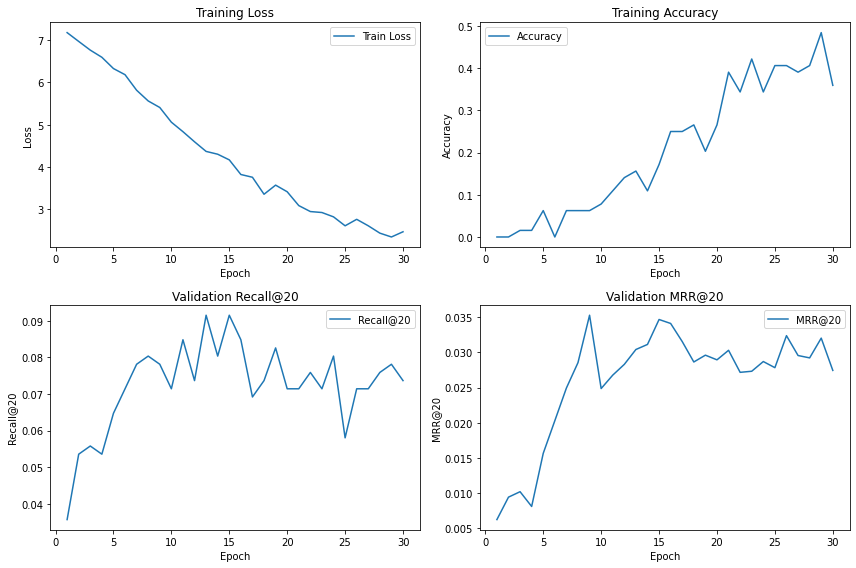

In [89]:
# Plot the metrics
plot_metrics(train_losses, accuracies, val_recalls, val_mrrs)

In [90]:
def test_model(model, args, test):
    test_recall, test_mrr = get_metrics(test, model, args, 20)
    print(f"\t - Recall@{args.k}: {test_recall:3f}")
    print(f"\t - MRR@{args.k}: {test_mrr:3f}\n")

test_model(model, args, test)

Evaluation:   0%|          | 0/67 [00:00<?, ?it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   1   75  159  234  309  313  503  507  573  994 1004 1059 1128 1169
 1176 1235 1275 3271 1287 1550 1604 1648 1669 1682 1723 1760 1838 1864
 1879 1989 1995 2007 2048 2072 2086 2183 2309 2349 2422 2459 2503 2512
 2519 2556 2612 2640 2651 2770 2843 2854 2884 2891 2901 2913 3031 3037
 3058 3092 3104 3154 3181 3211 3236 3253], end=[  74  158  233  308  312  502  506  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3276 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 1994 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3036 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=64, finished=False, mask=[17]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[   3   77  161  236 3276  315 3318  509  575  996 1006 1061 1130 1171
 1178 1237 1277 3273 1289 1552 1606 1650 1671 1684 1725 1762 1840 1866
 1881 1991 1997 2009 2050 2074 

Evaluation:   6%|▌         | 4/67 [00:01<00:18,  3.32it/s]

(64, 1, 1245)
Calling update_status
After update: start=[   5   79  163  238 3278  317 3320  511  577  998 1008 1063 1132 1173
 1180 1239 1279 3352 1291 1554 1608 1652 1673 1686 1727 1764 1842 1868
 1883 3367 1999 2011 2052 2076 2090 2187 2313 2353 2426 2463 2507 2516
 2523 2560 2616 2644 2655 2774 2847 2858 2888 2895 2905 2917 3508 3041
 3062 3096 3108 3158 3185 3215 3240 3257], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 1175
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 2511 2518
 2555 2611 2639 2650 2769 2842 2853 2883 2890 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=69, finished=False, mask=[17 29 54]
(64, 1, 1245)
Calling update_status
After update: start=[   6   80  164  239 3279  318 3321  512  578  999 1009 1064 1133 3549
 1181 1240 1280 3353 1292 1555 1609 1653 1674 1687 1728 1765 1843 1869
 1884 3368 2000 2012 2053 2077 2091 218

Evaluation:  12%|█▏        | 8/67 [00:02<00:17,  3.36it/s]

Calling update_status
After update: start=[   8   82  166  241 3281  320 3323  514  580 1001 1011 1066 1135 3551
 1183 1242 1282 3355 1294 1557 1611 1655 1676 1689 1730 1767 1845 1871
 1886 3370 2002 2014 2055 2079 2093 2190 2316 2356 2429 2466 3672 3567
 2526 2563 2619 2647 2658 2777 2850 2861 3643 2898 2908 2920 3511 3044
 3065 3099 3111 3161 3188 3218 3243 3260], end=[  74  158  233  308 3318  502 3352  572  993 1003 1058 1127 1168 3565
 1234 1274 1284 3367 1549 1603 1647 1668 1681 1722 1759 1837 1863 1878
 1988 3508 2006 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 2650 2769 2842 2853 2883 3672 2900 2912 3030 3549 3057
 3091 3103 3153 3180 3210 3235 3252 3271], last_session=73, finished=False, mask=[40]
(64, 1, 1245)
Calling update_status
After update: start=[   9   83  167  242 3282  321 3324  515  581 3685 1012 1067 1136 3552
 1184 1243 3804 3356 1295 1558 1612 1656 1677 1690 1731 1768 1846 1872
 1887 3371 2003 2015 2056 2080 2094 2191 2317 2357 2430 246

Evaluation:  18%|█▊        | 12/67 [00:03<00:16,  3.31it/s]

Calling update_status
After update: start=[  12   86  170  245 3285  324 3327  518  584 3688 1015 1070 1139 3555
 1187 1246 3807 3359 1298 1561 1615 1659 3986 1693 1734 1771 1849 1875
 1890 3374 3939 2018 2059 2083 2097 2194 2320 2360 2433 2470 3676 3571
 2530 2567 2623 3839 2662 2781 3903 2865 3647 3829 3965 2924 3515 3048
 3069 4030 3115 3165 3192 3222 3247 3264], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 1878
 1988 3508 3964 2047 2071 2085 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 3252 3271], last_session=83, finished=False, mask=[22 57]
(64, 1, 1245)
Calling update_status
After update: start=[  13   87  171  246 3286  325 3328  519  585 3689 1016 1071 1140 3556
 1188 1247 3808 3360 1299 1562 1616 1660 3987 1694 1735 1772 1850 1876
 1891 3375 3940 2019 2060 4040 2098 2195 2321 2361 2434 

Evaluation:  24%|██▍       | 16/67 [00:04<00:15,  3.32it/s]

Calling update_status
After update: start=[  16   90  174  249 3289  328 3331  522  588 3692 1019 1074 1143 3559
 1191 1250 3811 3363 1302 1565 1619 1663 3990 1697 1738 1775 1853 4045
 1894 3378 3943 2022 2063 4074 2101 2198 2324 2364 2437 2474 3680 3575
 2534 2571 2627 3843 2666 2785 3907 2869 3651 3833 3969 2928 3519 3052
 3073 4034 3119 3169 3196 3226 4167 3268], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 3367 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 3271], last_session=87, finished=False, mask=[62]
(64, 1, 1245)
(64, 1, 1245)
Calling update_status
After update: start=[  18   92  176  251 3291  330 3333  524  590 3694 1021 1076 1145 3561
 1193 1252 3813 3365 1304 1567 1621 1665 3992 1699 1740 1777 1855 4047
 1896 3380 3945 2024 2065 4076 2103 2200 2326

Evaluation:  28%|██▊       | 19/67 [00:05<00:14,  3.31it/s]

Calling update_status
After update: start=[  19   93  177  252 3292  331 3334  525  591 3695 1022 1077 1146 3562
 1194 1253 3814 4385 1305 1568 1622 1666 3993 1700 1741 1778 1856 4048
 1897 3381 3946 2025 2066 4077 2104 2201 2327 2367 2440 2477 3683 3578
 2537 2574 2630 3846 2669 2788 3910 2872 3654 3836 3972 2931 3522 3055
 3076 4037 3122 3172 3199 3229 4170 4370], end=[  74  158  233  308 3318  502 3352  572  993 3804 1058 1127 1168 3565
 1234 1274 3826 4416 1549 1603 1647 1668 4030 1722 1759 1837 1863 4073
 1988 3508 3964 2047 2071 4167 2182 2308 2348 2421 2458 2502 3685 3641
 2555 2611 2639 3901 2769 2842 3938 2883 3672 3837 3984 3030 3549 3057
 3091 4040 3153 3180 3210 3235 4369 4385], last_session=90, finished=True, mask=[17 51]
	 - Recall@20: 0.036184
	 - MRR@20: 0.011366



모든 모델에서 training은 잘 되는 것처럼 보이지만 test에서 두 지표를 모두 증가시키기는 어렵다...

# 회고

노드에 나온 코드 그대로 쓰다가 꼬인 부분이 있어서 과제 마무리에 시간이 오래걸렸네요  
마지막에 테스트 모델 호출하는 부분을 그대로 썼다가 자꾸 모델 구조가 안맞아서 대체 뭐가 문젤까 하고 한 줄 한 줄 디버깅하다가 알아냈습니다ㅎㅎ...  
상황에 따라 코드를 다르게 적용해야 하는데 당연한 걸 자꾸 잊네요ㅎㅎ...  